# Importing necessary packages

In [346]:
import pandas as pd
import matplotlib.pyplot as plt
import random
import spacy
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

import gensim
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from gensim.matutils import corpus2csc
from sklearn.feature_extraction.text import CountVectorizer

from wordcloud import WordCloud
from tabulate import tabulate
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Reading data

In [347]:
df = pd.read_excel("FINAL Waste strategy COMPLETE online responses to 30.11.23.xlsx")

In [348]:
df

,Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper,Is this consultation being completed over the phone or uploaded as a paper copy? - Analyst notes,Are you completing the consultation... - completing as,"If you are responding as an individual, which of the following best describes you:\n\n - indiv","If you are responding as an individual, which of the following best describes you:\n\n - Other (please state)","If you are responding on behalf of an organisation, please select which organisation type: - responding on behalf","If you are responding on behalf of an organisation, please select which organisation type: - Other:","If you are responding on behalf of an organisation, please select which organisation type: - Special interest group:",Does your organisation primarily work with or represent people from any of these groups? Please tick all that apply. - represent - Older people,Does your organisation primarily work with or represent people from any of these groups? Please tick all that apply. - represent - Children/young people,...,"Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Mental health needs","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Drug or alcohol addiction","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Physical impairment","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Learning difficulties/disabilities","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Autism spectrum disorder","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Other (please specify)","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Prefer not to say","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - If other, please specify",Response ID,Submitted Date
0,Not Answered,NaN,as an individual,a private citizen,NaN,Not Answered,Not Answered,Not Answered,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ANON-XKYM-2Z9Z-8,2023-09-13 09:29:21.945
1,Not Answered,NaN,as an individual,a private citizen,NaN,Not Answered,Not Answered,Not Answered,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ANON-XKYM-2Z9Q-Y,2023-09-13 11:00:37.037
2,Not Answered,NaN,as an individual,a private citizen,NaN,Not Answered,Not Answered,Not Answered,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ANON-XKYM-2Z96-4,2023-09-13 11:07:42.782
3,Not Answered,NaN,as an individual,a private citizen,NaN,Not Answered,Not Answered,Not Answered,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ANON-XKYM-2Z9D-J,2023-09-13 12:06:52.812
4,Not Answered,NaN,as an individual,a private citizen,NaN,Not Answered,Not Answered,Not Answered,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ANON-XKYM-2Z9K-S,2023-09-13 13:39:29.525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4219,Paper copy,NaN,as an individual,Not Answered,NaN,Not Answered,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BHLF-XKYM-2M5W-M,2023-11-28 13:45:58.263
4220,Paper copy,NaN,as an individual,a private citizen,NaN,Not Answered,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BHLF-XKYM-2M57-M,2023-11-28 15:13:50.839
4221,Paper copy,NaN,as an individual,Not Answered,NaN,Not Answered,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BHLF-XKYM-2M5B-Y,2023-11-28 15:17:26.652
4222,Paper copy,NaN,as an individual,a private citizen,NaN,Not Answered,NaN,NaN,NaN,NaN,...,NaN,NaN,Physical impairment,NaN,NaN,NaN,NaN,NaN,BHLF-XKYM-2X9E-H,2023-11-28 15:40:28.558


# Data pre-processing

In [349]:
df.isnull().sum()

Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper                                                         0
Is this consultation being completed over the phone or uploaded as a paper copy? - Analyst notes                                                    4224
Are you completing the consultation... - completing as                                                                                                 0
If you are responding as an individual, which of the following best describes you:\n\n - indiv                                                         0
If you are responding as an individual, which of the following best describes you:\n\n - Other (please state)                                       4181
                                                                                                                                                    ... 
Do you consider yourself to have a health condition, disability or impairment? Ple

In [350]:
# dropping column if null values are more than 4000 
df = df.drop(columns=[col for col in df.columns if df[col].isnull().sum() > 4000])

In [351]:
df

,Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper,Are you completing the consultation... - completing as,"If you are responding as an individual, which of the following best describes you:\n\n - indiv","If you are responding on behalf of an organisation, please select which organisation type: - responding on behalf","If you are responding on behalf of an organisation, please select which organisation type: - Other:","If you are responding on behalf of an organisation, please select which organisation type: - Special interest group:","Does your organisation primarily work with or represent people from any of these groups? Please tick all that apply. - Other, please specify","Which district(s), borough(s) or city does your organisation cover? Please tick all that apply - Other, Please state",What is the name of your organisation? - name,Please provide an email address for your organisation: - email address,...,Which age group do you belong to? - Age,What is your gender? - Gender,What is your ethnicity? - Ethnicity,What is your religion/faith? - Religion/Faith,"Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - No impairment","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Hearing impairment/deaf","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Physical impairment","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Prefer not to say",Response ID,Submitted Date
0,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,55-64,Not Answered,White British,Christian,No impairment,NaN,NaN,NaN,ANON-XKYM-2Z9Z-8,2023-09-13 09:29:21.945
1,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,65+,Male,White British,Not sure,No impairment,NaN,NaN,NaN,ANON-XKYM-2Z9Q-Y,2023-09-13 11:00:37.037
2,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,35-44,Male,White British,Christian,No impairment,NaN,NaN,NaN,ANON-XKYM-2Z96-4,2023-09-13 11:07:42.782
3,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,45-54,Male,White British,NaN,No impairment,NaN,NaN,NaN,ANON-XKYM-2Z9D-J,2023-09-13 12:06:52.812
4,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,45-54,Female,White British,NaN,No impairment,NaN,NaN,NaN,ANON-XKYM-2Z9K-S,2023-09-13 13:39:29.525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4219,Paper copy,as an individual,Not Answered,Not Answered,NaN,NaN,NaN,NaN,NaN,NaN,...,Prefer not to say,Not Answered,White British,Prefer not to say,No impairment,NaN,NaN,NaN,BHLF-XKYM-2M5W-M,2023-11-28 13:45:58.263
4220,Paper copy,as an individual,a private citizen,Not Answered,NaN,NaN,NaN,NaN,NaN,NaN,...,65+,Male,White British,Not Answered,NaN,NaN,NaN,NaN,BHLF-XKYM-2M57-M,2023-11-28 15:13:50.839
4221,Paper copy,as an individual,Not Answered,Not Answered,NaN,NaN,NaN,NaN,NaN,NaN,...,65+,Male,White British,Christian,No impairment,NaN,NaN,NaN,BHLF-XKYM-2M5B-Y,2023-11-28 15:17:26.652
4222,Paper copy,as an individual,a private citizen,Not Answered,NaN,NaN,NaN,NaN,NaN,NaN,...,65+,Male,White British,Christian,NaN,NaN,Physical impairment,NaN,BHLF-XKYM-2X9E-H,2023-11-28 15:40:28.558


In [352]:
# dropping unncessary columns
df = df.drop(columns=['Response ID', 'Submitted Date'])

In [353]:
# replacing NaN values with Null values string for our knowledge
for column in df:
    df[column].fillna("Null values", inplace = True)

In [354]:
# download stopwords & wordnet packages
nltk.download('stopwords')
nltk.download('wordnet')
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to C:\Users\Anurup
[nltk_data]     Salokhe\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Anurup
[nltk_data]     Salokhe\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# Lowering Text Case and Removing Special Characters & Stopwords

In [355]:
import re

def preprocess(text):
    text = str(text)
    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\d', ' ', text)
    text = text.lower()
    words = text.split()
    words = [word for word in words if word not in stop_words]
    words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(words)


for column in df:
    # Function to remove special characters 
    df[column].apply(preprocess)

print(df)

     Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper  \
0                                          Not Answered                                               
1                                          Not Answered                                               
2                                          Not Answered                                               
3                                          Not Answered                                               
4                                          Not Answered                                               
...                                                 ...                                               
4219                                         Paper copy                                               
4220                                         Paper copy                                               
4221                                         Paper copy                  

In [356]:
df.head()

,Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper,Are you completing the consultation... - completing as,"If you are responding as an individual, which of the following best describes you:\n\n - indiv","If you are responding on behalf of an organisation, please select which organisation type: - responding on behalf","If you are responding on behalf of an organisation, please select which organisation type: - Other:","If you are responding on behalf of an organisation, please select which organisation type: - Special interest group:","Does your organisation primarily work with or represent people from any of these groups? Please tick all that apply. - Other, please specify","Which district(s), borough(s) or city does your organisation cover? Please tick all that apply - Other, Please state",What is the name of your organisation? - name,Please provide an email address for your organisation: - email address,...,Is there anything else you would like to tell us about the Environmental Report? - Further comments,"Which Essex district, city or borough do you live in? - District",Which age group do you belong to? - Age,What is your gender? - Gender,What is your ethnicity? - Ethnicity,What is your religion/faith? - Religion/Faith,"Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - No impairment","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Hearing impairment/deaf","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Physical impairment","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Prefer not to say"
0,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Braintree,55-64,Not Answered,White British,Christian,No impairment,Null values,Null values,Null values
1,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Brentwood,65+,Male,White British,Not sure,No impairment,Null values,Null values,Null values
2,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Chelmsford,35-44,Male,White British,Christian,No impairment,Null values,Null values,Null values
3,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Colchester,45-54,Male,White British,Null values,No impairment,Null values,Null values,Null values
4,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Colchester,45-54,Female,White British,Null values,No impairment,Null values,Null values,Null values


# DataFrame Pre-check

In [357]:
df.isnull().sum()

Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper                                                                                                                                                                                                                                         0
Are you completing the consultation... - completing as                                                                                                                                                                                                                                                                                 0
If you are responding as an individual, which of the following best describes you:\n\n - indiv                                                                                                                                                                                                                                         0
If you are re

In [358]:
# Trying for single cloumn
print(df.columns[0])
df.iloc[:,0].unique()

Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper


array(['Not Answered', 'Paper copy'], dtype=object)

In [359]:
# Create a DataFrame
data = pd.DataFrame(df.iloc[:,0])

# Define a function to calculate response percentages for each column
def calculate_response_percentages(column):
    # Count the occurrences of each response
    

    response_counts = column.value_counts(dropna=False)
    
    # Replace NaN with '(Blank)'
    response_counts.index = response_counts.index.fillna('(Blank)')
    
    # Calculate the percentage of each response
    response_percentages = (response_counts / response_counts.sum()) * 100
    
    return response_percentages

# for column in df:
    # Apply the function to each column
    
percentages =  data.apply(calculate_response_percentages)


# Transpose the result for better readability
percentages_transposed = percentages.T

# Display the result
#print(percentages_transposed)

table = percentages_transposed.reset_index().values.tolist()
headers = ["Questions"] + percentages_transposed.columns.tolist()

# Print the table with borders and highlighted color for headers
print(tabulate(table, headers, tablefmt="simple_grid", stralign="center", numalign="center"))

                                          Questions                                              Not Answered    Paper copy
----------------------------------------------------------------------------------------------  --------------  ------------
Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper     99.6922        0.307765


In [360]:
df

,Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper,Are you completing the consultation... - completing as,"If you are responding as an individual, which of the following best describes you:\n\n - indiv","If you are responding on behalf of an organisation, please select which organisation type: - responding on behalf","If you are responding on behalf of an organisation, please select which organisation type: - Other:","If you are responding on behalf of an organisation, please select which organisation type: - Special interest group:","Does your organisation primarily work with or represent people from any of these groups? Please tick all that apply. - Other, please specify","Which district(s), borough(s) or city does your organisation cover? Please tick all that apply - Other, Please state",What is the name of your organisation? - name,Please provide an email address for your organisation: - email address,...,Is there anything else you would like to tell us about the Environmental Report? - Further comments,"Which Essex district, city or borough do you live in? - District",Which age group do you belong to? - Age,What is your gender? - Gender,What is your ethnicity? - Ethnicity,What is your religion/faith? - Religion/Faith,"Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - No impairment","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Hearing impairment/deaf","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Physical impairment","Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Prefer not to say"
0,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Braintree,55-64,Not Answered,White British,Christian,No impairment,Null values,Null values,Null values
1,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Brentwood,65+,Male,White British,Not sure,No impairment,Null values,Null values,Null values
2,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Chelmsford,35-44,Male,White British,Christian,No impairment,Null values,Null values,Null values
3,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Colchester,45-54,Male,White British,Null values,No impairment,Null values,Null values,Null values
4,Not Answered,as an individual,a private citizen,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,Not Answered,...,Not Answered,Colchester,45-54,Female,White British,Null values,No impairment,Null values,Null values,Null values
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4219,Paper copy,as an individual,Not Answered,Not Answered,Null values,Null values,Null values,Null values,Null values,Null values,...,Null values,Basildon,Prefer not to say,Not Answered,White British,Prefer not to say,No impairment,Null values,Null values,Null values
4220,Paper copy,as an individual,a private citizen,Not Answered,Null values,Null values,Null values,Null values,Null values,Null values,...,Null values,Basildon,65+,Male,White British,Not Answered,Null values,Null values,Null values,Null values
4221,Paper copy,as an individual,Not Answered,Not Answered,Null values,Null values,Null values,Null values,Null values,Null values,...,No to an incinerator in Basildon,Basildon,65+,Male,White British,Christian,No impairment,Null values,Null values,Null values


In [361]:
print(df.shape[1])

59


In [362]:
gender = df['What is your gender? - Gender']

In [363]:
age = df['Which age group do you belong to? - Age']

In [364]:
city = df['Which Essex district, city or borough do you live in? - District']

# Summarization of Overall Columns


Column Question :  Is this consultation being completed over the phone or uploaded as a paper copy? - Phone/paper
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Paper copy'
 'Paper copy' 'Paper copy']


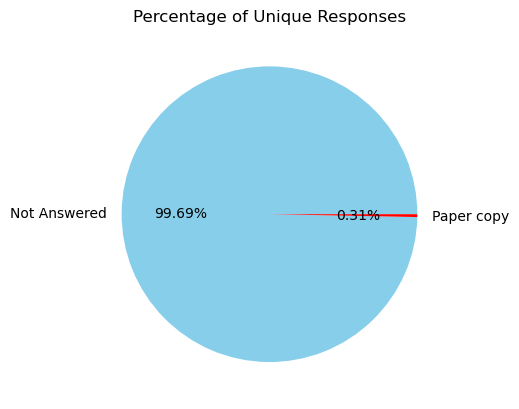

* Regarding the question, 'Not Answered' was the most common response, accounting for 99.69% of participants.
* Additionally, notable responses were 'Paper copy' with 0.31%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Are you completing the consultation... - completing as
Column Responses :  ['as an individual' 'as an individual' 'as an individual' ...
 'as an individual' 'as an individual' 'as an individual']


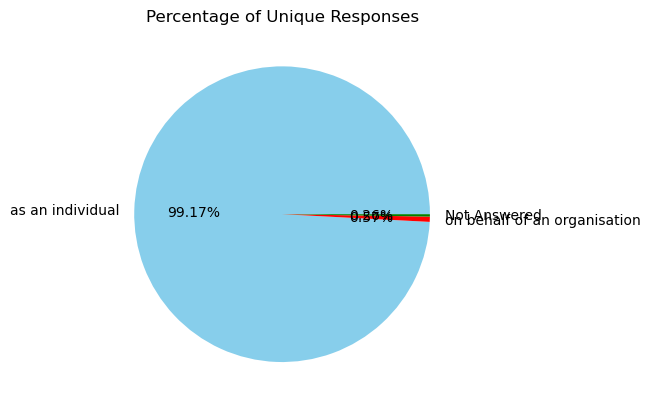

* For the question, the most frequent response was 'as an individual', making up 99.17% of the total responses.
* Further, we observed these responses: 'on behalf of an organisation' with 0.57%; 'Not Answered' with 0.26%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  If you are responding as an individual, which of the following best describes you:

 - indiv
Column Responses :  ['a private citizen' 'a private citizen' 'a private citizen' ...
 'Not Answered' 'a private citizen' 'a private citizen']


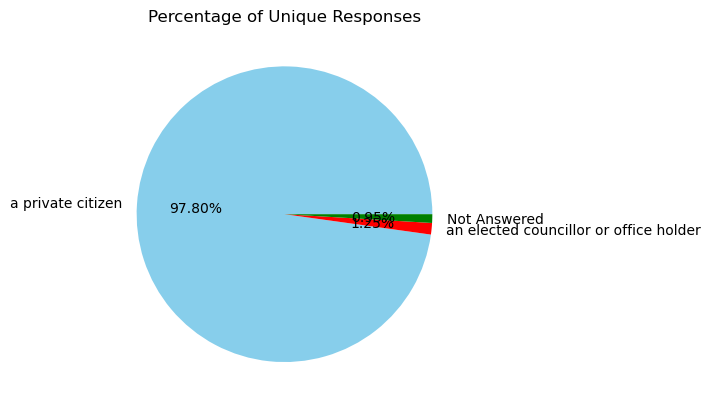

* For the question, the most frequent response was 'a private citizen', making up 97.80% of the total responses.
* Other significant responses include 'an elected councillor or office holder' with 1.25%; 'Not Answered' with 0.95%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  If you are responding on behalf of an organisation, please select which organisation type: - responding on behalf
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Not Answered'
 'Not Answered' 'Not Answered']


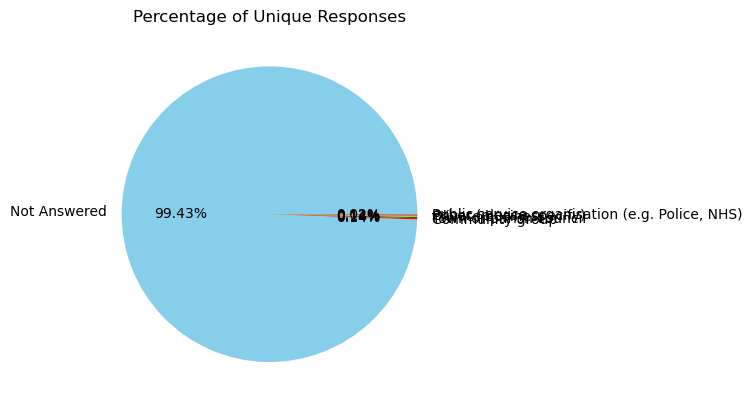

* The question saw 'Not Answered' as the top response, representing 99.43% of the answers.
* Further, we observed these responses: 'Community group' with 0.14%; 'Town or parish council' with 0.14%; 'Private business' with 0.14%; 'Other (please specify)' with 0.12%; 'Public service organisation (e.g. Police, NHS)' with 0.02%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  If you are responding on behalf of an organisation, please select which organisation type: - Other:
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Null values'
 'Null values' 'Null values']


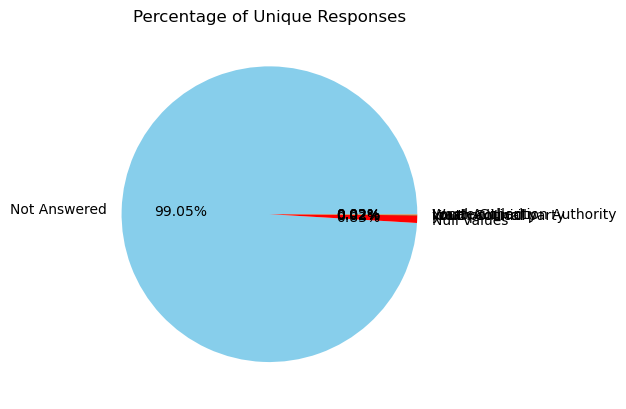

* For the question, the most frequent response was 'Not Answered', making up 99.05% of the total responses.
* Further, we observed these responses: 'Null values' with 0.83%; 'youth counicl' with 0.02%; 'Youth Council' with 0.02%; 'local political party' with 0.02%; 'Local Authority' with 0.02%; 'Waste Collection Authority' with 0.02%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  If you are responding on behalf of an organisation, please select which organisation type: - Special interest group:
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Null values'
 'Null values' 'Null values']


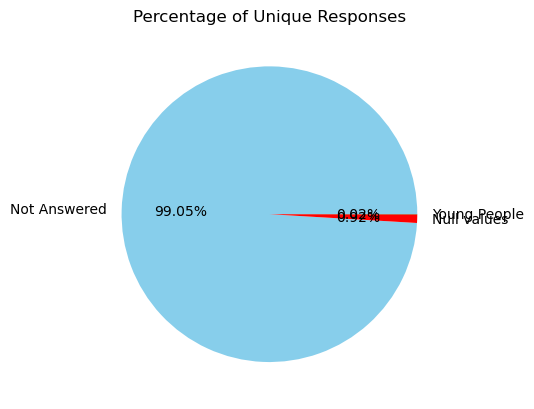

* For the question, the most frequent response was 'Not Answered', making up 99.05% of the total responses.
* Other significant responses include 'Null values' with 0.92%; 'Young People' with 0.02%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Does your organisation primarily work with or represent people from any of these groups? Please tick all that apply. - Other, please specify
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Null values'
 'Null values' 'Null values']


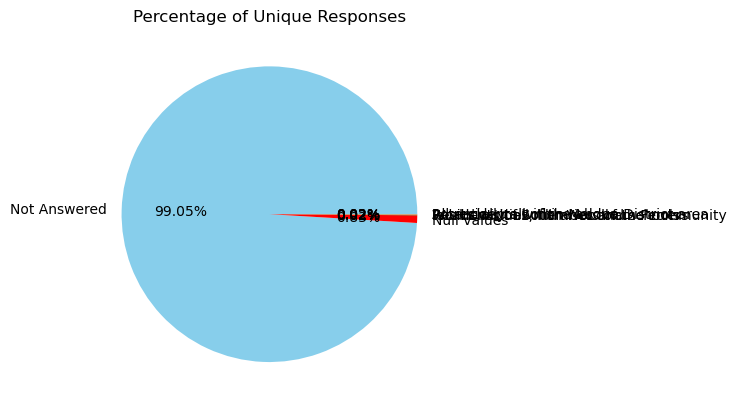

* The question saw 'Not Answered' as the top response, representing 99.05% of the answers.
* Additionally, notable responses were 'Null values' with 0.83%; 'local charities, libraries and schools' with 0.02%; 'Residents of South Woodham Ferrers' with 0.02%; 'Works with all members of the community' with 0.02%; 'Potentially all of the above' with 0.02%; 'All residents within Maldon District area' with 0.02%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which district(s), borough(s) or city does your organisation cover? Please tick all that apply - Other, Please state
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Null values'
 'Null values' 'Null values']


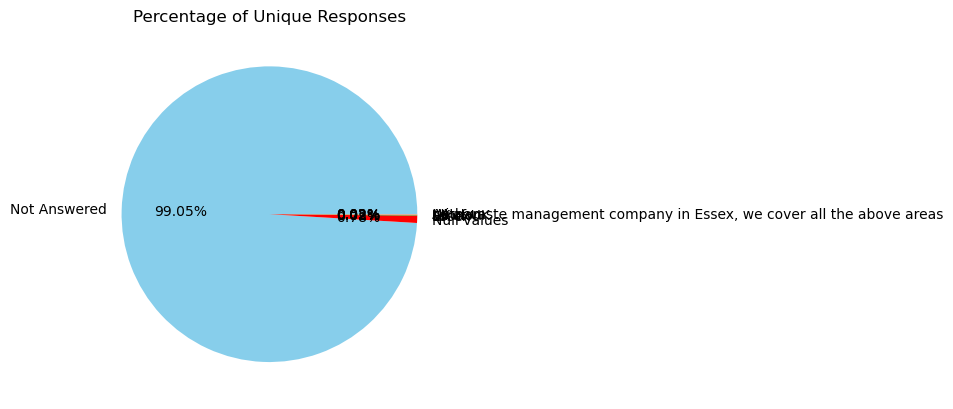

* The question saw 'Not Answered' as the top response, representing 99.05% of the answers.
* Further, we observed these responses: 'Null values' with 0.78%; 'Essex' with 0.05%; 'all of UK' with 0.02%; 'London' with 0.02%; 'UK' with 0.02%; 'Witham' with 0.02%; 'As a waste management company in Essex, we cover all the above areas' with 0.02%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  What is the name of your organisation? - name
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Null values'
 'Null values' 'Null values']


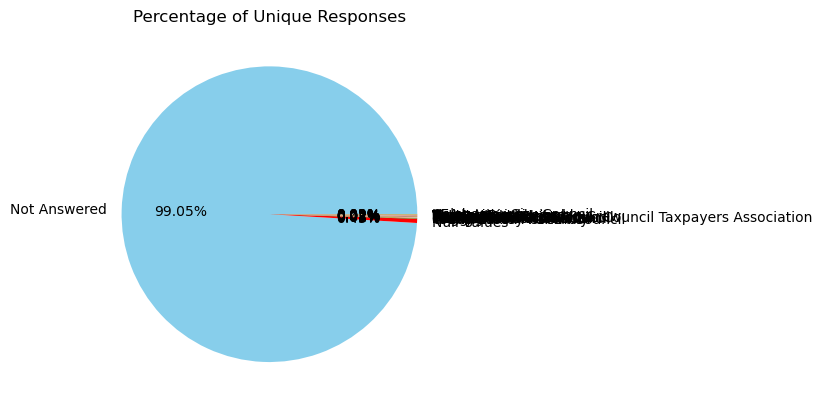

* Regarding the question, 'Not Answered' was the most common response, accounting for 99.05% of participants.
* Other significant responses include 'Null values' with 0.45%; 'Young Essex Assembly' with 0.05%; 'Great Oakley Parish Council' with 0.02%; 'Coggeshall Parish Council' with 0.02%; 'Indaver' with 0.02%; 'Feering Parish Council' with 0.02%; 'Maldon District Council' with 0.02%; 'Braintree District Council' with 0.02%; 'Witham Town Council' with 0.02%; 'South Woodham Ferrers Council Taxpayers Association' with 0.02%; 'Hempstead Parish Council' with 0.02%; 'The Epping Society' with 0.02%; 'Castle Point Clean Up Crew' with 0.02%; 'Echologika Ltd' with 0.02%; 'The Bell Inn' with 0.02%; 'MotorAid Ltd' with 0.02%; 'The Ink Bin Limited' with 0.02%; 'young essex asembley' with 0.02%; 'Youth service' with 0.02%; 'YEA' with 0.02%; 'Colchester City Council' with 0.02%.

-------------------------------------------------------------------------------------------------------------------------

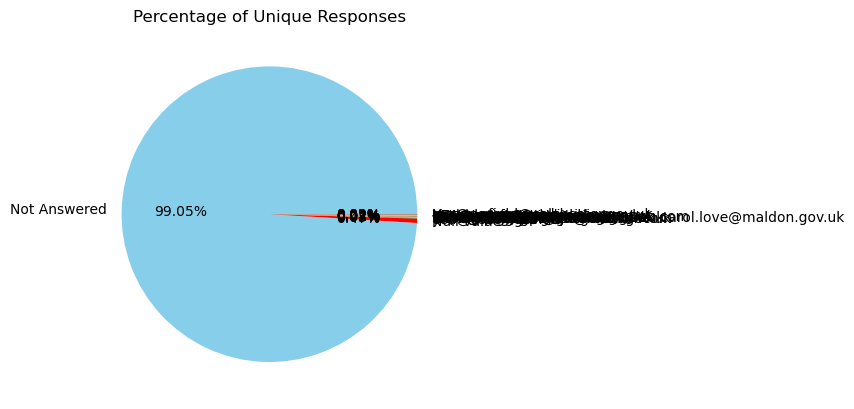

* The question saw 'Not Answered' as the top response, representing 99.05% of the answers.
* Additionally, notable responses were 'Null values' with 0.47%; 'yea@essex.gov.uk' with 0.05%; 'diana.hpcouncil@gmail.com' with 0.02%; 'clerk@coggeshall-pc.gov.uk' with 0.02%; 'funmi.adefioye-giwa@indaver.com' with 0.02%; 'clerk@feeringparishcouncil.gov.uk' with 0.02%; 'Princes Road, Maldon CM9 5DL   carol.love@maldon.gov.uk' with 0.02%; 'samir.pandya@braintree.gov.uk' with 0.02%; 'deputytownclerk@witham.gov.uk' with 0.02%; 'membership@swfcta.org' with 0.02%; 'secretary@eppingsociety.org.uk' with 0.02%; 'gtoakleypc@aol.com' with 0.02%; 'Castlepointcleanupcrew@yahoo.com' with 0.02%; 'info@echologika.com' with 0.02%; 'bell-castle@hotmail.co.uk' with 0.02%; 'simon.croft@motoraid.com' with 0.02%; 'becky.baines@theinkbin.co.uk' with 0.02%; 'YEA@essex.gov.uk' with 0.02%; 'Yea@essex.gov.uk' with 0.02%; 'rosa.tanfield@colchester.gov.uk' with 0.02%.

------------------------------------------------------

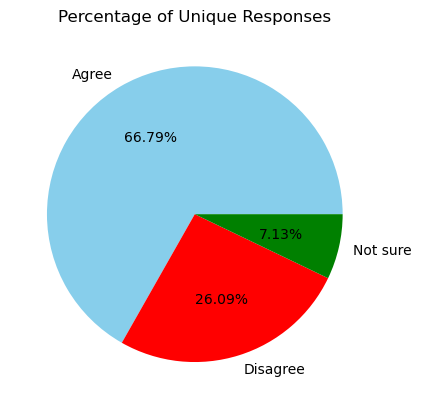

* Regarding the question, 'Agree' was the most common response, accounting for 66.79% of participants.
* Other responses worth mentioning are 'Disagree' with 26.09%; 'Not sure' with 7.13%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which of the following statements best describes your thoughts on the targets in the draft strategy?  - targets
Column Responses :  ['I would prefer more ambitious targets'
 'I would prefer more ambitious targets'
 'I think the targets are about right' ... 'Not Answered'
 'I would prefer less ambitious targets'
 'I would prefer more ambitious targets']


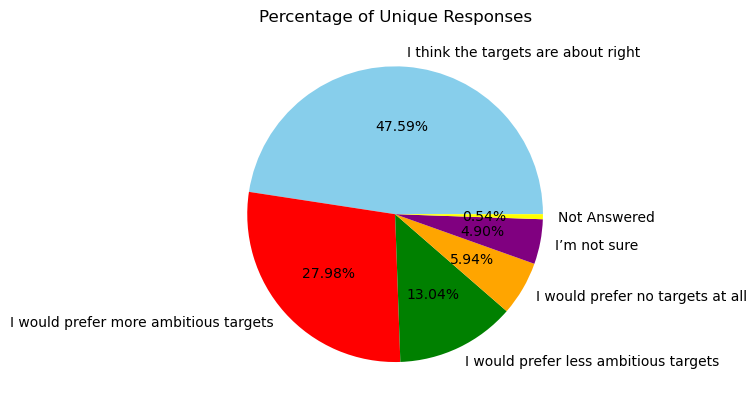

* The question saw 'I think the targets are about right' as the top response, representing 47.59% of the answers.
* Other significant responses include 'I would prefer more ambitious targets' with 27.98%; 'I would prefer less ambitious targets' with 13.04%; 'I would prefer no targets at all' with 5.94%; 'I’m not sure' with 4.90%; 'Not Answered' with 0.54%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which of the following best describes your view?
 - higher
Column Responses :  ['I would prefer higher targets that are achieved sooner'
 'I would prefer higher targets that are achieved sooner' 'Not Answered'
 ... 'Not Answered' 'Not Answered'
 'I would prefer these targets to be achieved sooner']


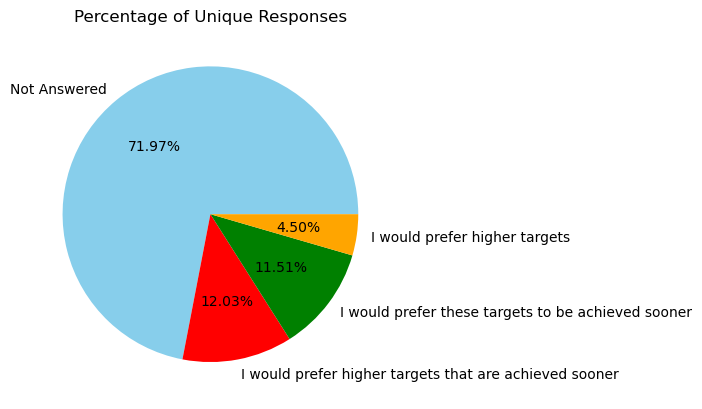

* The question saw 'Not Answered' as the top response, representing 71.97% of the answers.
* Further, we observed these responses: 'I would prefer higher targets that are achieved sooner' with 12.03%; 'I would prefer these targets to be achieved sooner' with 11.51%; 'I would prefer higher targets' with 4.50%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which of the following best describes your view? - less ambitious
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Not Answered'
 'I would prefer lower targets that are achieved at a later date'
 'Not Answered']


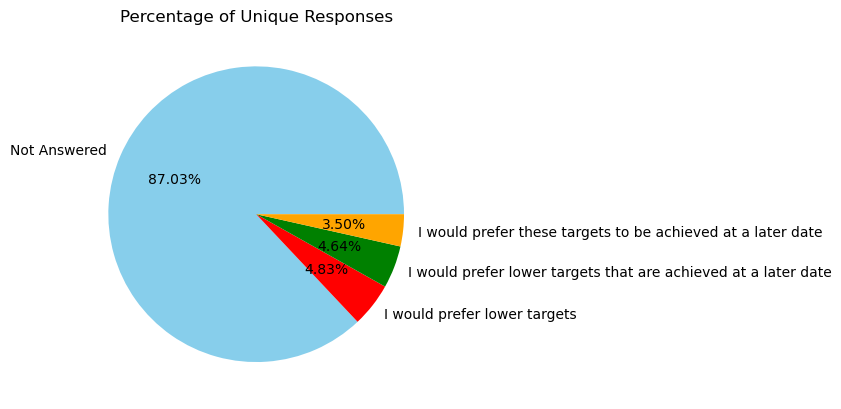

* The question saw 'Not Answered' as the top response, representing 87.03% of the answers.
* Other responses worth mentioning are 'I would prefer lower targets' with 4.83%; 'I would prefer lower targets that are achieved at a later date' with 4.64%; 'I would prefer these targets to be achieved at a later date' with 3.50%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which of the following statements best describes your thoughts on the ambitions in the draft strategy? - ambitions
Column Responses :  ['I would prefer higher ambitions' 'I would prefer higher ambitions'
 'I think the ambitions are about right' ... 'Not Answered'
 'I would prefer no ambitions at all' 'I would prefer higher ambitions']


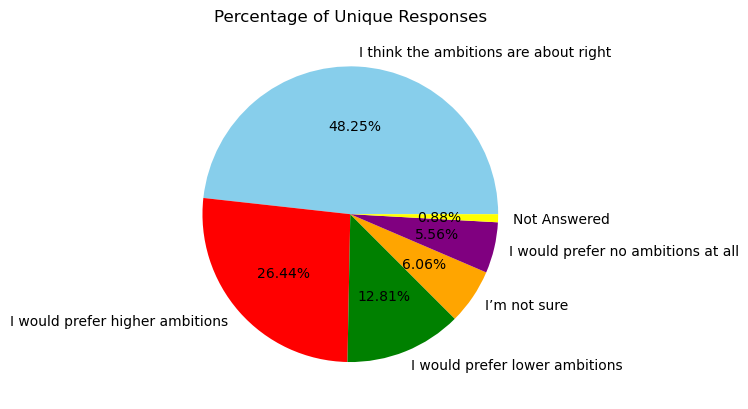

* For the question, the most frequent response was 'I think the ambitions are about right', making up 48.25% of the total responses.
* Additionally, notable responses were 'I would prefer higher ambitions' with 26.44%; 'I would prefer lower ambitions' with 12.81%; 'I’m not sure' with 6.06%; 'I would prefer no ambitions at all' with 5.56%; 'Not Answered' with 0.88%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which of the following best describes your view? - Ambitions
Column Responses :  ['I would prefer higher ambitions that are achieved sooner'
 'I would prefer these ambitions to be achieved sooner' 'Not Answered' ...
 'Not Answered' 'Not Answered'
 'I would prefer these ambitions to be achieved sooner']


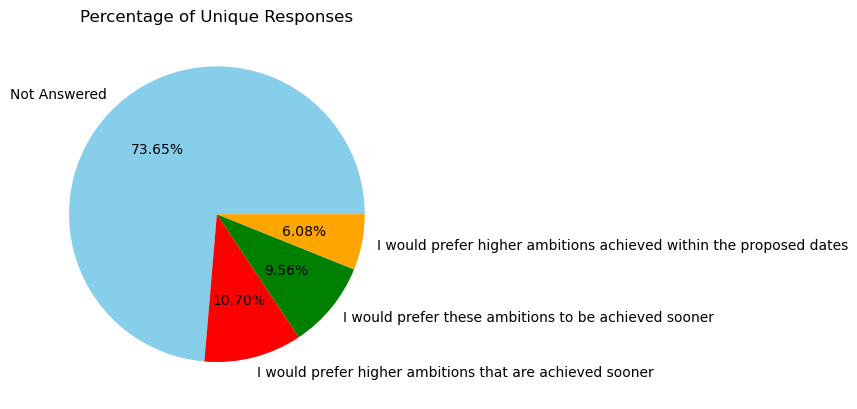

* Regarding the question, 'Not Answered' was the most common response, accounting for 73.65% of participants.
* Further, we observed these responses: 'I would prefer higher ambitions that are achieved sooner' with 10.70%; 'I would prefer these ambitions to be achieved sooner' with 9.56%; 'I would prefer higher ambitions achieved within the proposed dates' with 6.08%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which of the following best describes your view? - Ambitions.1
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Not Answered'
 'Not Answered' 'Not Answered']


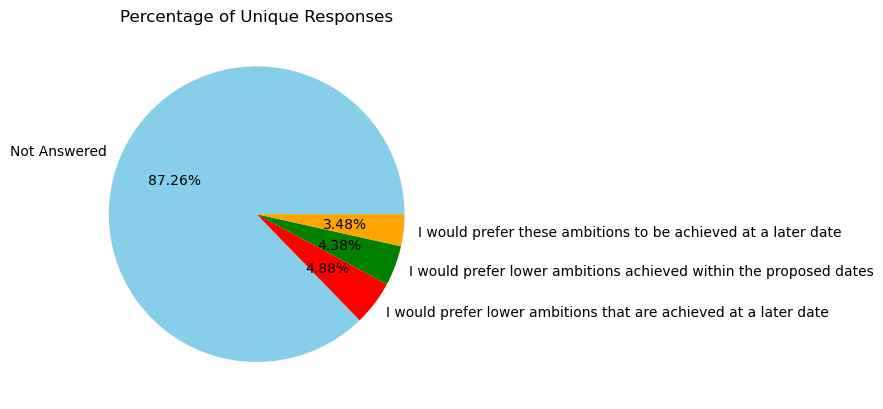

* The question saw 'Not Answered' as the top response, representing 87.26% of the answers.
* Other responses worth mentioning are 'I would prefer lower ambitions that are achieved at a later date' with 4.88%; 'I would prefer lower ambitions achieved within the proposed dates' with 4.38%; 'I would prefer these ambitions to be achieved at a later date' with 3.48%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - priority
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Not sure' 'Agree']


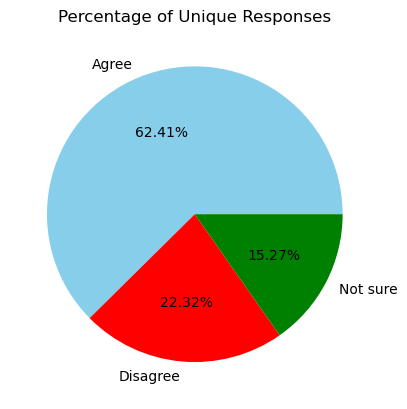

* Regarding the question, 'Agree' was the most common response, accounting for 62.41% of participants.
* Other significant responses include 'Disagree' with 22.32%; 'Not sure' with 15.27%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


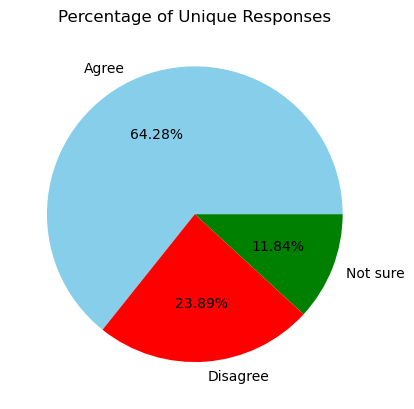

* The question saw 'Agree' as the top response, representing 64.28% of the answers.
* Other responses worth mentioning are 'Disagree' with 23.89%; 'Not sure' with 11.84%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree.1
Column Responses :  ['Agree' 'Agree' 'Not sure' ... 'Not sure' 'Agree' 'Agree']


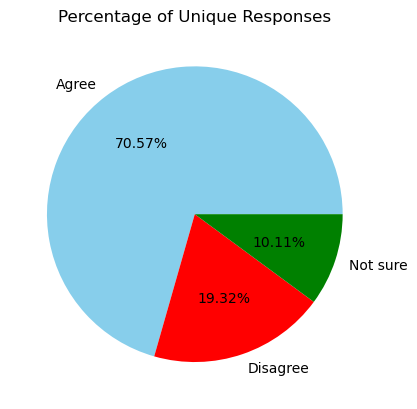

* For the question, the most frequent response was 'Agree', making up 70.57% of the total responses.
* Further, we observed these responses: 'Disagree' with 19.32%; 'Not sure' with 10.11%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree.2
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Not sure' 'Agree']


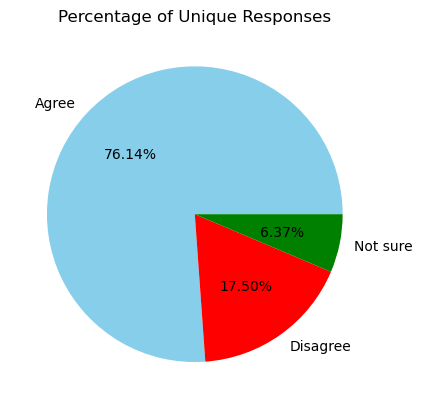

* Regarding the question, 'Agree' was the most common response, accounting for 76.14% of participants.
* Additionally, notable responses were 'Disagree' with 17.50%; 'Not sure' with 6.37%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that the EWP should reduce the use of landfill? - landfill
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


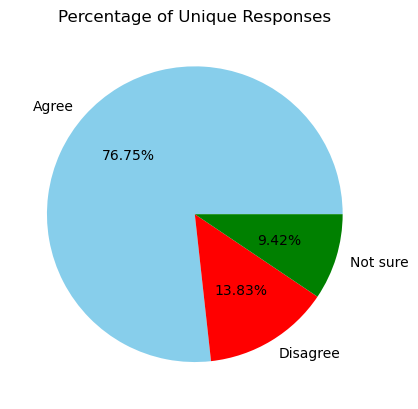

* Regarding the question, 'Agree' was the most common response, accounting for 76.75% of participants.
* Other significant responses include 'Disagree' with 13.83%; 'Not sure' with 9.42%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that adopting the use of anaerobic digestion for the treatment of food waste is the right solution? - anaerobic digestion
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


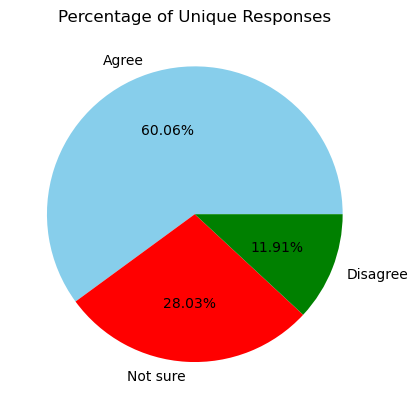

* The question saw 'Agree' as the top response, representing 60.06% of the answers.
* Other significant responses include 'Not sure' with 28.03%; 'Disagree' with 11.91%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that, after recycling everything we can, adopting Energy from Waste (EfW) for residual waste is the right solution? - EFW
Column Responses :  ['Disagree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


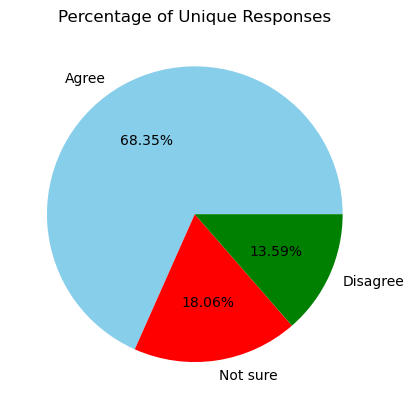

* For the question, the most frequent response was 'Agree', making up 68.35% of the total responses.
* Additionally, notable responses were 'Not sure' with 18.06%; 'Disagree' with 13.59%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree.3
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Disagree' 'Agree']


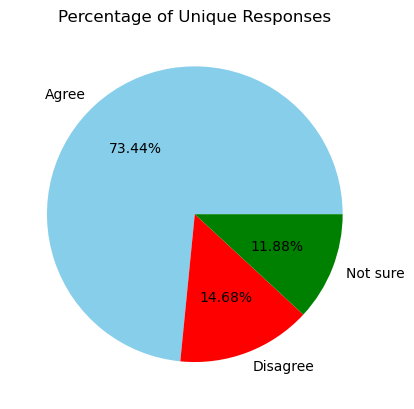

* For the question, the most frequent response was 'Agree', making up 73.44% of the total responses.
* Further, we observed these responses: 'Disagree' with 14.68%; 'Not sure' with 11.88%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Work to reduce the carbon impact of waste operations by increasing use of alternative fuels for our vehicles and equipment, and making waste transport routes as efficient as possible.
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


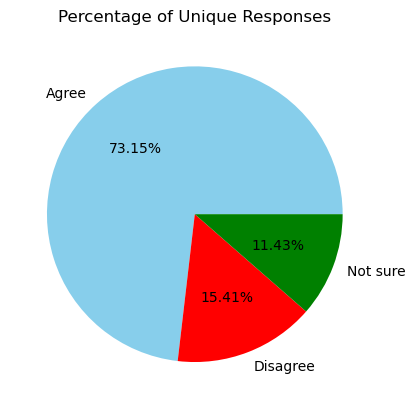

* For the question, the most frequent response was 'Agree', making up 73.15% of the total responses.
* Other significant responses include 'Disagree' with 15.41%; 'Not sure' with 11.43%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Work together to make the network of recycling centres, waste transfer stations and depots as efficient as possible
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


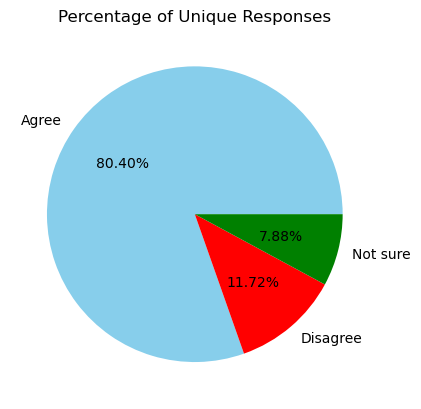

* Regarding the question, 'Agree' was the most common response, accounting for 80.40% of participants.
* Other significant responses include 'Disagree' with 11.72%; 'Not sure' with 7.88%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Explore carbon capture, utilisation and storage, and carbon offsetting to mitigate unavoidable greenhouse gas emissions
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Not sure' 'Disagree']


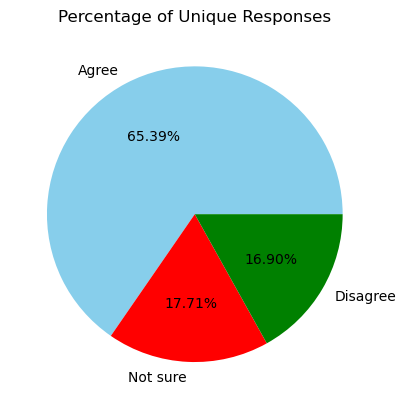

* Regarding the question, 'Agree' was the most common response, accounting for 65.39% of participants.
* Further, we observed these responses: 'Not sure' with 17.71%; 'Disagree' with 16.90%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Stay abreast of innovation, trends and examples of best practice to shape service design
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Not sure' 'Agree']


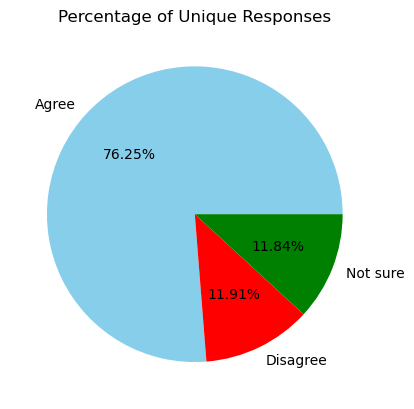

* The question saw 'Agree' as the top response, representing 76.25% of the answers.
* Further, we observed these responses: 'Disagree' with 11.91%; 'Not sure' with 11.84%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Work together and maximise opportunities to increase recycling in public spaces and reduce litter.
Column Responses :  ['Agree' 'Agree' 'Not sure' ... 'Not sure' 'Agree' 'Agree']


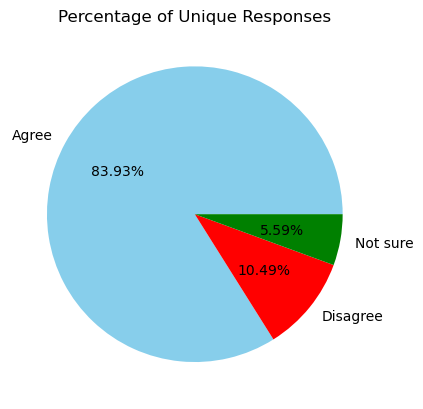

* The question saw 'Agree' as the top response, representing 83.93% of the answers.
* Additionally, notable responses were 'Disagree' with 10.49%; 'Not sure' with 5.59%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Be an active voice striving to shape government policy, legislation, and regulation through engagement, consultations, and lobbying
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Disagree' 'Agree']


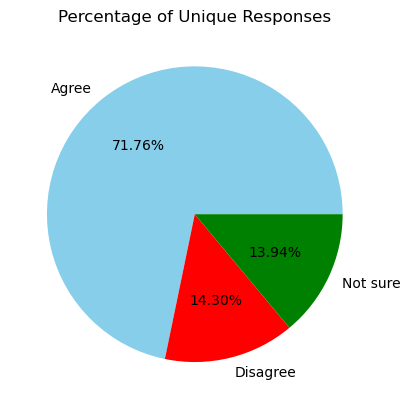

* For the question, the most frequent response was 'Agree', making up 71.76% of the total responses.
* Other responses worth mentioning are 'Disagree' with 14.30%; 'Not sure' with 13.94%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Work together to develop opportunities for employment, environmental benefit, and reduced costs
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


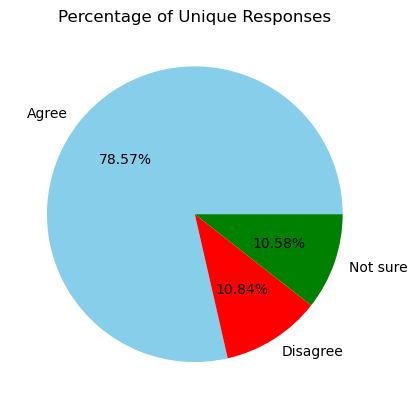

* The question saw 'Agree' as the top response, representing 78.57% of the answers.
* Other significant responses include 'Disagree' with 10.84%; 'Not sure' with 10.58%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree.4
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


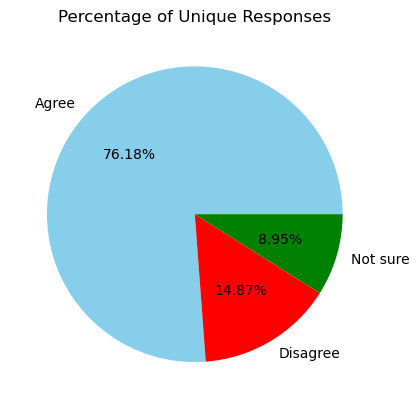

* Regarding the question, 'Agree' was the most common response, accounting for 76.18% of participants.
* Further, we observed these responses: 'Disagree' with 14.87%; 'Not sure' with 8.95%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this approach to research, planning and performance monitoring?   - agree
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']


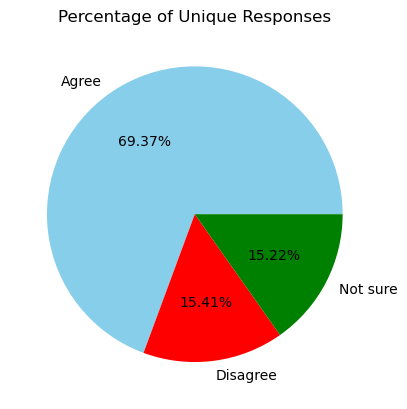

* Regarding the question, 'Agree' was the most common response, accounting for 69.37% of participants.
* Additionally, notable responses were 'Disagree' with 15.41%; 'Not sure' with 15.22%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Do you wish to provide any comments on the Environmental Report? - Environmental Report
Column Responses :  ['No' 'No' 'No' ... 'Not Answered' 'No' 'Yes']


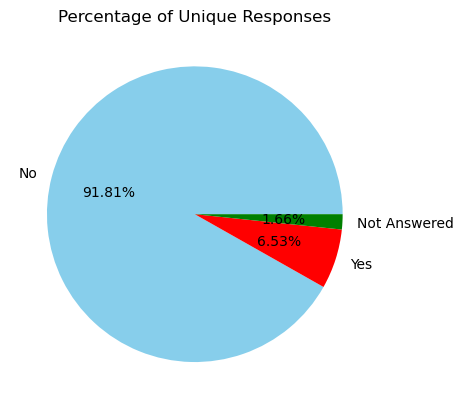

* Regarding the question, 'No' was the most common response, accounting for 91.81% of participants.
* Other significant responses include 'Yes' with 6.53%; 'Not Answered' with 1.66%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Does the Environmental Report correctly identify the likely significant effects of the draft Strategy? - Strategic Environment Assessment
Column Responses :  ['Not Answered' 'Not Answered' 'Not Answered' ... 'Not Answered'
 'Not Answered' 'No']


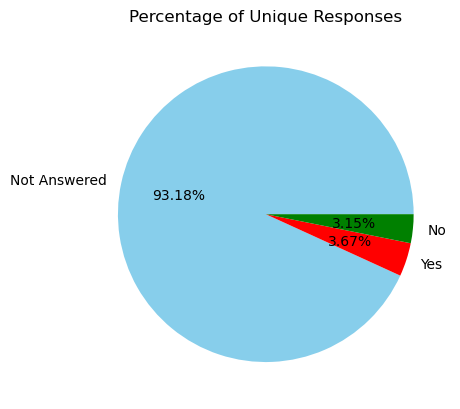

* Regarding the question, 'Not Answered' was the most common response, accounting for 93.18% of participants.
* Further, we observed these responses: 'Yes' with 3.67%; 'No' with 3.15%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which Essex district, city or borough do you live in? - District
Column Responses :  ['Braintree' 'Brentwood' 'Chelmsford' ... 'Basildon' 'Braintree'
 'Basildon']


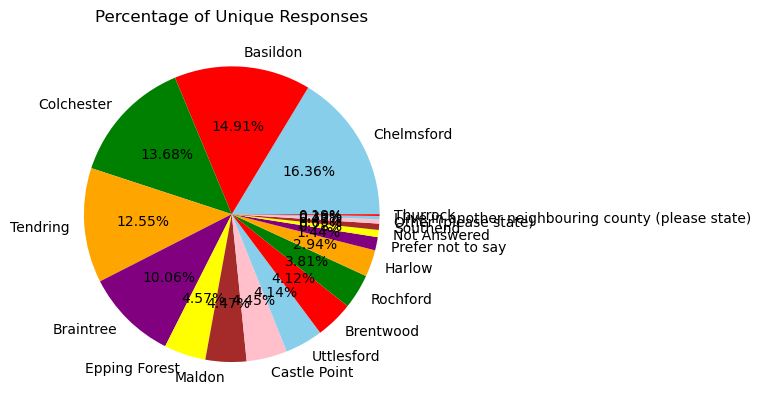

* Regarding the question, 'Chelmsford' was the most common response, accounting for 16.36% of participants.
* Additionally, notable responses were 'Basildon' with 14.91%; 'Colchester' with 13.68%; 'Tendring' with 12.55%; 'Braintree' with 10.06%; 'Epping Forest' with 4.57%; 'Maldon' with 4.47%; 'Castle Point' with 4.45%; 'Uttlesford' with 4.14%; 'Brentwood' with 4.12%; 'Rochford' with 3.81%; 'Harlow' with 2.94%; 'Prefer not to say' with 1.44%; 'Not Answered' with 0.78%; 'Southend' with 0.69%; 'Other (please state)' with 0.47%; 'I live in another neighbouring county (please state)' with 0.36%; 'Thurrock' with 0.19%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Which age group do you belong to? - Age
Column Responses :  ['55-64' '65+' '35-44' ... '65+' '65+' '55-64'

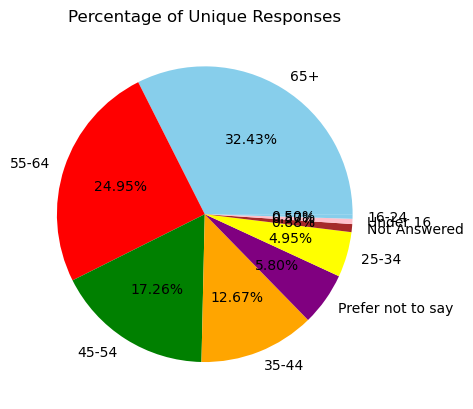

* Regarding the question, '65+' was the most common response, accounting for 32.43% of participants.
* Further, we observed these responses: '55-64' with 24.95%; '45-54' with 17.26%; '35-44' with 12.67%; 'Prefer not to say' with 5.80%; '25-34' with 4.95%; 'Not Answered' with 0.88%; 'Under 16' with 0.57%; '16-24' with 0.50%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  What is your gender? - Gender
Column Responses :  ['Not Answered' 'Male' 'Male' ... 'Male' 'Male' 'Female']


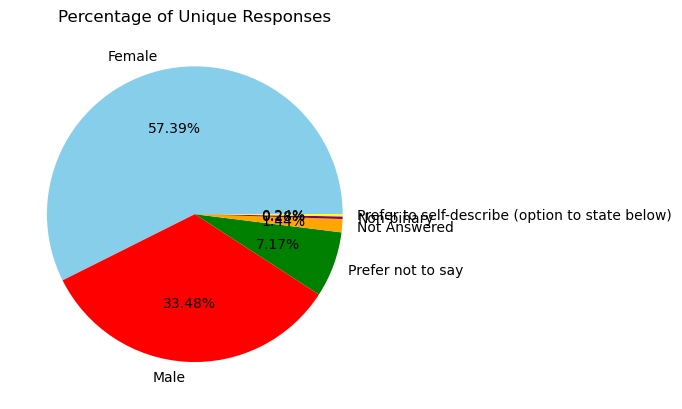

* Regarding the question, 'Female' was the most common response, accounting for 57.39% of participants.
* Other significant responses include 'Male' with 33.48%; 'Prefer not to say' with 7.17%; 'Not Answered' with 1.44%; 'Non-binary' with 0.28%; 'Prefer to self-describe (option to state below)' with 0.24%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  What is your ethnicity? - Ethnicity
Column Responses :  ['White British' 'White British' 'White British' ... 'White British'
 'White British' 'White British']


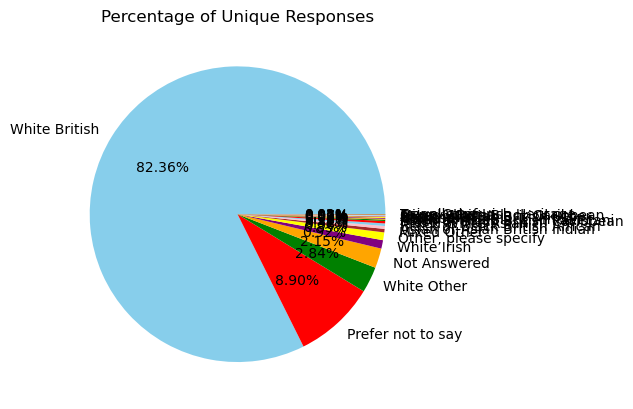

* Regarding the question, 'White British' was the most common response, accounting for 82.36% of participants.
* Additionally, notable responses were 'Prefer not to say' with 8.90%; 'White Other' with 2.84%; 'Not Answered' with 2.15%; 'White Irish' with 0.92%; 'Other, please specify' with 0.85%; 'Mixed Other' with 0.38%; 'Asian or Asian British Indian' with 0.31%; 'Black or Black British African' with 0.28%; 'Mixed White/Asian' with 0.26%; 'Black or Black British Caribbean' with 0.14%; 'Asian or Asian British Pakistani' with 0.09%; 'Mixed White/Black African' with 0.09%; 'Chinese' with 0.09%; 'Not Known' with 0.07%; 'Asian or Asian British Other' with 0.07%; 'Gypsy / Roma' with 0.07%; 'Mixed White/Black Caribbean' with 0.05%; 'Traveller of Irish Heritage' with 0.02%; 'Asian Other' with 0.02%.

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

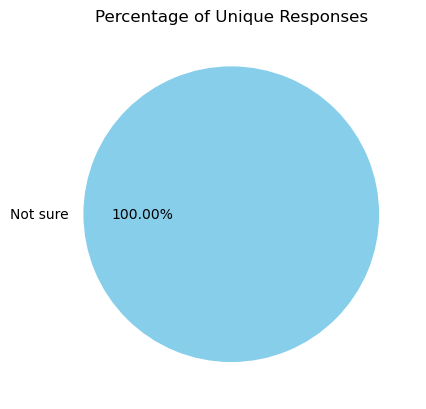

* The question saw 'Not sure' as the top response, representing 100.00% of the answers.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - No impairment
Column Responses :  ['No impairment' 'No impairment' 'No impairment' ... 'No impairment'
 'Null values' 'No impairment']


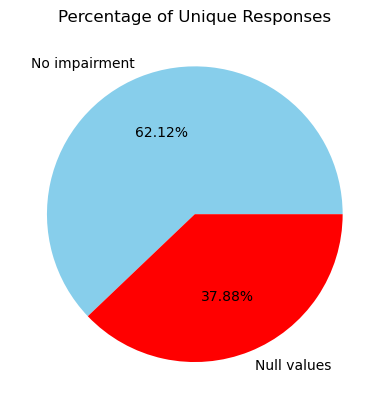

* For the question, the most frequent response was 'No impairment', making up 62.12% of the total responses.
* Additionally, notable responses were 'Null values' with 37.88%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Hearing impairment/deaf
Column Responses :  ['Null values' 'Null values' 'Null values' ... 'Null values' 'Null values'
 'Null values']


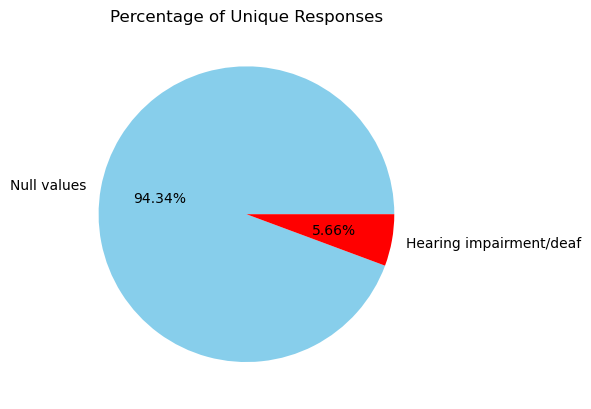

* Regarding the question, 'Null values' was the most common response, accounting for 94.34% of participants.
* Other responses worth mentioning are 'Hearing impairment/deaf' with 5.66%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Physical impairment
Column Responses :  ['Null values' 'Null values' 'Null values' ... 'Null values'
 'Physical impairment' 'Null values']


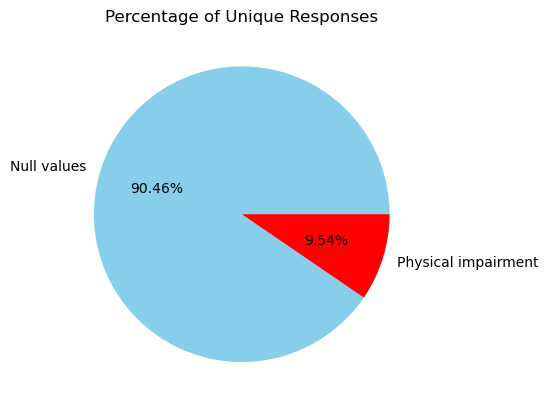

* For the question, the most frequent response was 'Null values', making up 90.46% of the total responses.
* Other significant responses include 'Physical impairment' with 9.54%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  Do you consider yourself to have a health condition, disability or impairment? Please tick all that apply. - Disability - Prefer not to say
Column Responses :  ['Null values' 'Null values' 'Null values' ... 'Null values' 'Null values'
 'Null values']


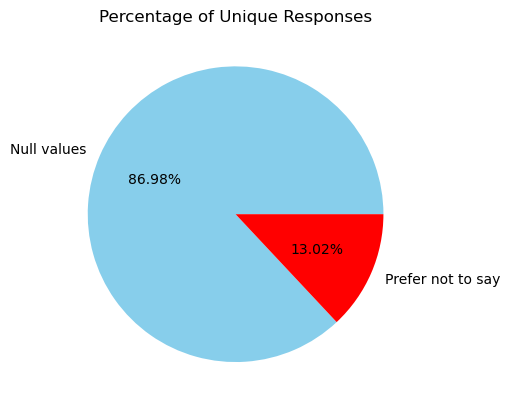

* The question saw 'Null values' as the top response, representing 86.98% of the answers.
* Other responses worth mentioning are 'Prefer not to say' with 13.02%.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [365]:
# Define new categories
def categorize_response(response):
    if response in ["Strongly agree", "Mostly agree"]:
        return "Agree"
    elif response in ["Strongly disagree", "Mostly disagree"]:
        return "Disagree"
    else:
        return "Not sure"

    
# Apply the categorization
# Col_A = df['To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Work to reduce the carbon impact of waste operations by increasing use of alternative fuels for our vehicles and equipment, and making waste transport routes as efficient as possible.'].apply(categorize_response)
# col_B = df['To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Work to reduce the carbon impact of waste operations by increasing use of alternative fuels for our vehicles and equipment, and making waste transport routes as efficient as possible.']

# List of sentence templates for variation
top_response_templates = [
    "For the question, the most frequent response was '{response}', making up {percentage:.2f}% of the total responses.",
    "The question saw '{response}' as the top response, representing {percentage:.2f}% of the answers.",
    "Regarding the question, '{response}' was the most common response, accounting for {percentage:.2f}% of participants.",
]

other_responses_templates = [
    "Other significant responses include {responses}.",
    "Additionally, notable responses were {responses}.",
    "Further, we observed these responses: {responses}.",
    "Other responses worth mentioning are {responses}.",
]

# Iterate over all column names
for column in df:
    if df[column].isin(["Strongly disagree", "Mostly disagree", "Disagree", "Not sure", "Strongly agree", "Mostly agree"]).any():
        df[column] = df[column].apply(categorize_response)
    
    # Data cleaning without dropping column
    df[column].fillna("Null values", inplace=True)  

    # Count the occurrences of each response
    response_counts = df[column].value_counts()

    if df[column].nunique() < 30:

        columnSeriesObj = df[column]
        print('\nColumn Question : ', column)
        print('Column Responses : ', columnSeriesObj.values)

        # Calculate the percentage of each response
        response_percentages = (response_counts / response_counts.sum()) * 100

        # Plot the pie chart
        fig, ax = plt.subplots()
        ax.pie(response_percentages, labels=response_counts.index, autopct='%.2f%%', colors=['skyblue', 'red', 'green', 'orange', 'purple', 'yellow', 'brown', 'pink'])

        # Add title
        ax.set_title('Percentage of Unique Responses')

        # Display the plot
        plt.show()

        # Generate summary
        top_response = response_counts.idxmax()
        top_response_percentage = response_percentages.max()

        # Choose a random template for the top response
        top_response_summary = random.choice(top_response_templates).format(
            column=column, response=top_response, percentage=top_response_percentage
        )

        other_responses = response_percentages.drop(labels=top_response)
        other_responses_summary = [f"'{response}' with {percentage:.2f}%" for response, percentage in other_responses.items()]
        other_responses_text = "; ".join(other_responses_summary)

        if other_responses_text:
            # Choose a random template for other responses
            other_responses_summary_text = random.choice(other_responses_templates).format(responses=other_responses_text)
            summary = f"* {top_response_summary}\n* {other_responses_summary_text}"
        else:
            summary = f"* {top_response_summary}"

        # Print the summary
        print(summary+"\n")
        print("-"*250)


# Demographics Exploration By Gender, Age, Geographical location

# Summary & Plot functions

In [366]:
# Define new categories
def categorize_response(response):
    if response in ["Strongly agree", "Mostly agree"]:
        return "Agree"
    elif response in ["Strongly disagree", "Mostly disagree"]:
        return "Disagree"
    else:
        return "Not sure"

# Initialize spaCy
nlp = spacy.load("en_core_web_sm")

# Function to create summary
def create_summary(data, category, threshold=100):
    summaries = []
    for index, row in data.iterrows():
        if category[index] > threshold:
            agree_percentage = row.get('Agree', 0)
            disagree_percentage = row.get('Disagree', 0)
            not_sure_percentage = row.get('Not sure', 0)

            sentences = [
                f"In the {category[index]}, '{index}' category, {agree_percentage:.1f}% of participants agree, {disagree_percentage:.1f}% disagree and {not_sure_percentage:.1f}% are not sure.",
                f"out of {category[index]}, '{index}' category, the total of {disagree_percentage:.1f}% of {index} respondents disagree, {agree_percentage:.1f}% of respondents agree and unsure were {not_sure_percentage:.1f}% ",
                #f"Not sure responses are at {not_sure_percentage:.1f}% for the {index} group.",
                f"out of total {category[index]}, '{index}' category,{agree_percentage:.1f}% of people in the {index} category agree with the statement, few {disagree_percentage:.1f}% disagree and rest were not sure .",
                f"In the total of {category[index]}, '{index}' group, {disagree_percentage:.1f}% disagree, however {agree_percentage:.1f}% agreed and {not_sure_percentage:.1f}% are not sure."
            ]

            # Randomly select one sentence for the summary
            summary_sentence = random.choice(sentences)
            summaries.append(summary_sentence)
        else:
            summaries.append(f"In the {index} category, less effective data due to low response count.")
    return summaries

# Function to plot pie charts
def plot_pie_chart(df, title):
    plt.figure(figsize=(14, 8))
    for i, (index, row) in enumerate(df.iterrows()):
        plt.subplot(3, 3, i + 1)
        plt.pie(
            row,
            labels=row.index,
            autopct='%1.1f%%',
            startangle=140,
            pctdistance=0.85,
            labeldistance=1.1
        )
        plt.title(index)
    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


# Gender Statistics


Column Question :  To what extent do you agree or disagree with this vision statement for the Waste Strategy for Essex? - vision
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']
What is your gender? - Gender
Female                                             2424
Male                                               1414
Non-binary                                           12
Not Answered                                         61
Prefer not to say                                   303
Prefer to self-describe (option to state below)      10
dtype: int64


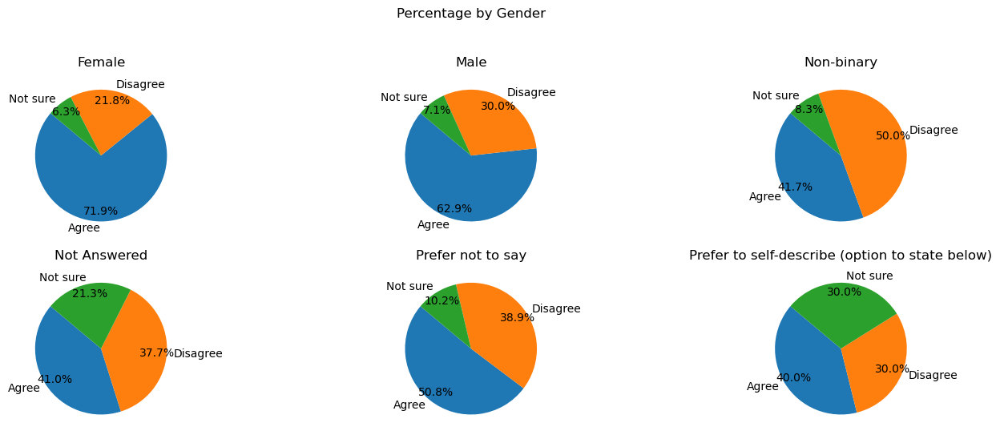

Summary by Gender:
* out of total 2424, 'Female' category,71.9% of people in the Female category agree with the statement, few 21.8% disagree and rest were not sure .
* out of total 1414, 'Male' category,62.9% of people in the Male category agree with the statement, few 30.0% disagree and rest were not sure .
* In the total of 303, 'Prefer not to say' group, 38.9% disagree, however 50.8% agreed and 10.2% are not sure.

Conclusion:
Through the gender response study, it is clear that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

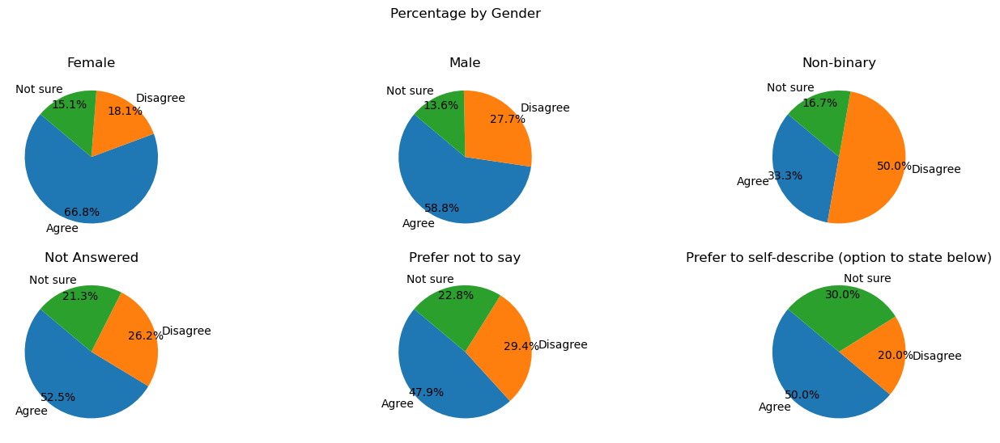

Summary by Gender:
* out of 2424, 'Female' category, the total of 18.1% of Female respondents disagree, 66.8% of respondents agree and unsure were 15.1% 
* In the total of 1414, 'Male' group, 27.7% disagree, however 58.8% agreed and 13.6% are not sure.
* In the 303, 'Prefer not to say' category, 47.9% of participants agree, 29.4% disagree and 22.8% are not sure.

Conclusion:
Examining the responses, we see that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, with Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree wi

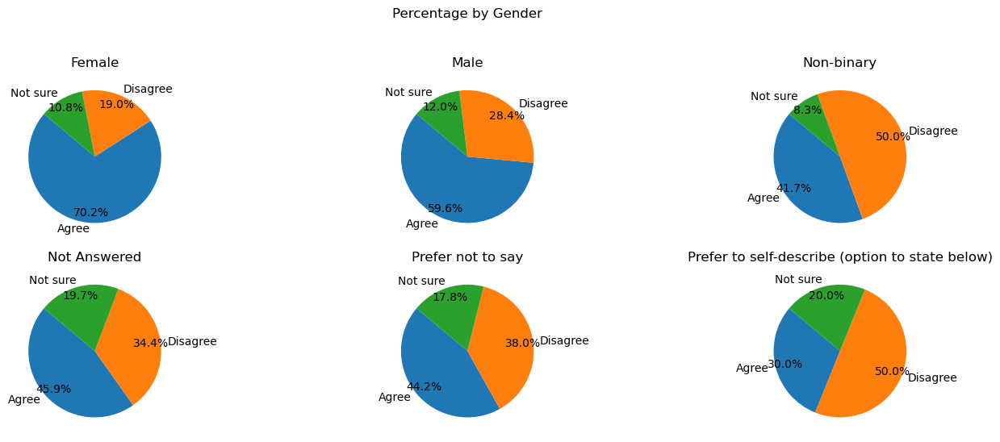

Summary by Gender:
* out of 2424, 'Female' category, the total of 19.0% of Female respondents disagree, 70.2% of respondents agree and unsure were 10.8% 
* In the total of 1414, 'Male' group, 28.4% disagree, however 59.6% agreed and 12.0% are not sure.
* In the 303, 'Prefer not to say' category, 44.2% of participants agree, 38.0% disagree and 17.8% are not sure.

Conclusion:
Gender response data highlight females has higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree.1
Column Responses

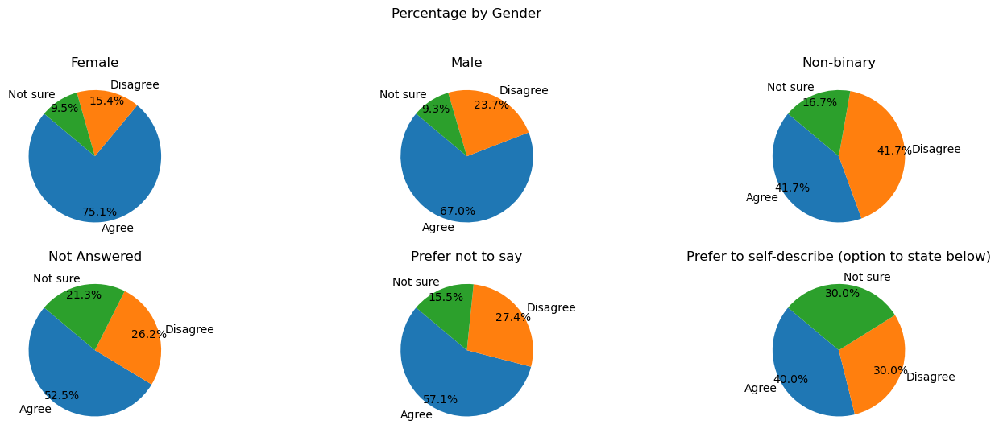

Summary by Gender:
* out of 2424, 'Female' category, the total of 15.4% of Female respondents disagree, 75.1% of respondents agree and unsure were 9.5% 
* out of total 1414, 'Male' category,67.0% of people in the Male category agree with the statement, few 23.7% disagree and rest were not sure .
* out of total 303, 'Prefer not to say' category,57.1% of people in the Prefer not to say category agree with the statement, few 27.4% disagree and rest were not sure .

Conclusion:
Survey data show that females has almost similar but showed a slightly higher level of agreement compared to males; while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

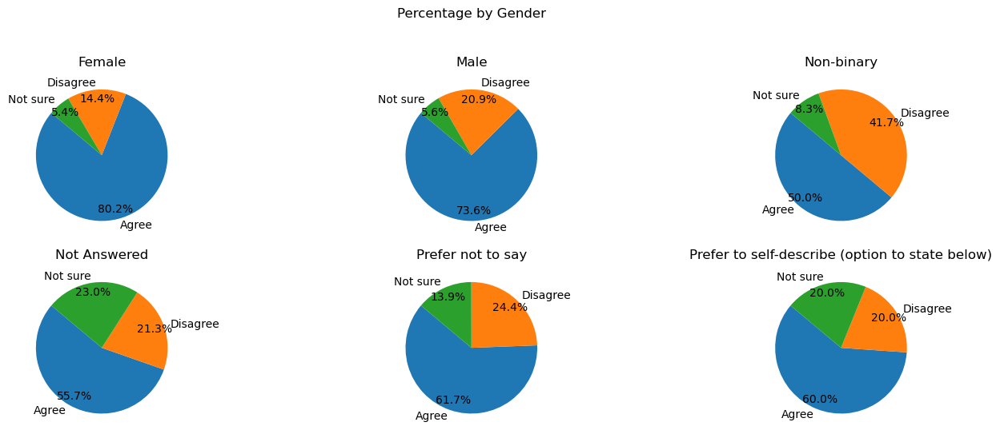

Summary by Gender:
* In the 2424, 'Female' category, 80.2% of participants agree, 14.4% disagree and 5.4% are not sure.
* out of total 1414, 'Male' category,73.6% of people in the Male category agree with the statement, few 20.9% disagree and rest were not sure .
* out of 303, 'Prefer not to say' category, the total of 24.4% of Prefer not to say respondents disagree, 61.7% of respondents agree and unsure were 13.9% 

Conclusion:
According to the analysis, females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement. Furthermore, Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Q

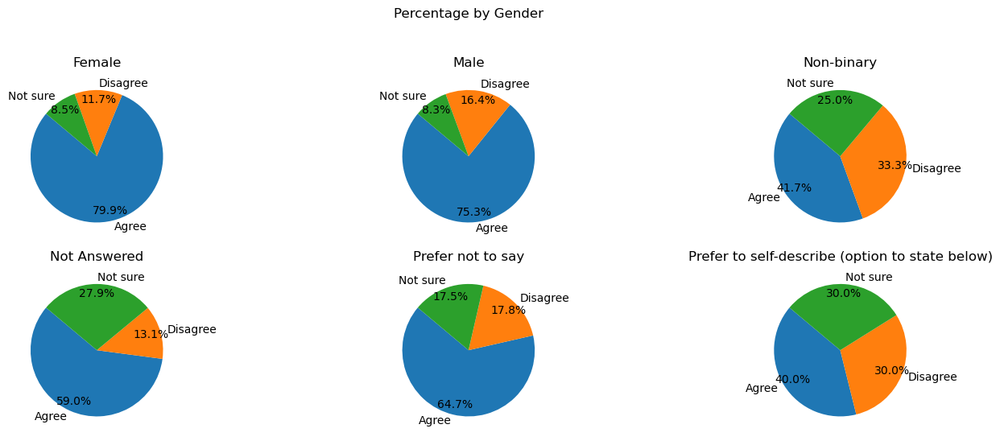

Summary by Gender:
* out of 2424, 'Female' category, the total of 11.7% of Female respondents disagree, 79.9% of respondents agree and unsure were 8.5% 
* In the 1414, 'Male' category, 75.3% of participants agree, 16.4% disagree and 8.3% are not sure.
* In the 303, 'Prefer not to say' category, 64.7% of participants agree, 17.8% disagree and 17.5% are not sure.

Conclusion:
Gender response data highlight females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that adopt

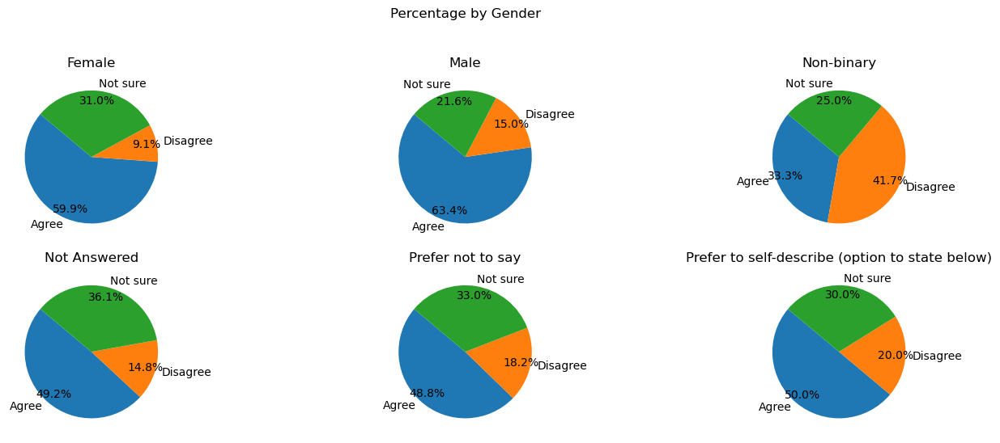

Summary by Gender:
* In the 2424, 'Female' category, 59.9% of participants agree, 9.1% disagree and 31.0% are not sure.
* out of 1414, 'Male' category, the total of 15.0% of Male respondents disagree, 63.4% of respondents agree and unsure were 21.6% 
* In the total of 303, 'Prefer not to say' group, 18.2% disagree, however 48.8% agreed and 33.0% are not sure.

Conclusion:
From the gender responses, it was found that males showed a similar but slightly higher level of agreement compared to females, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that, aft

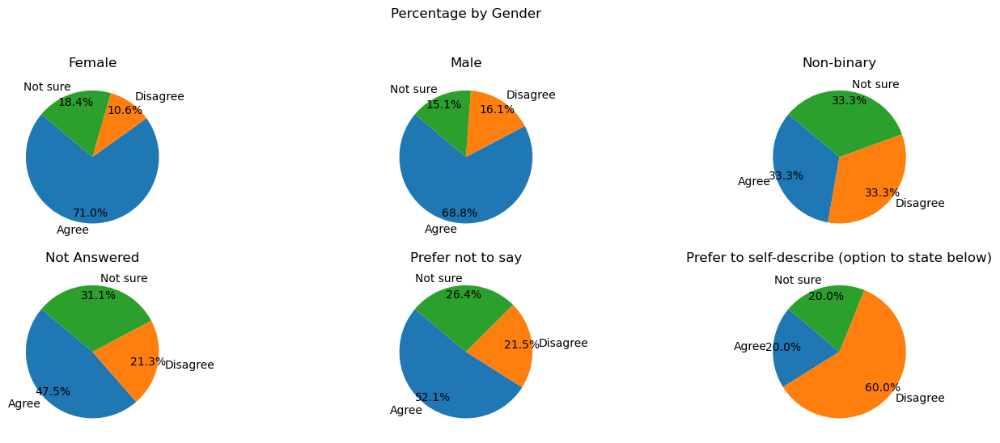

Summary by Gender:
* In the total of 2424, 'Female' group, 10.6% disagree, however 71.0% agreed and 18.4% are not sure.
* out of total 1414, 'Male' category,68.8% of people in the Male category agree with the statement, few 16.1% disagree and rest were not sure .
* In the total of 303, 'Prefer not to say' group, 21.5% disagree, however 52.1% agreed and 26.4% are not sure.

Conclusion:
From the gender responses, it was found that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agr

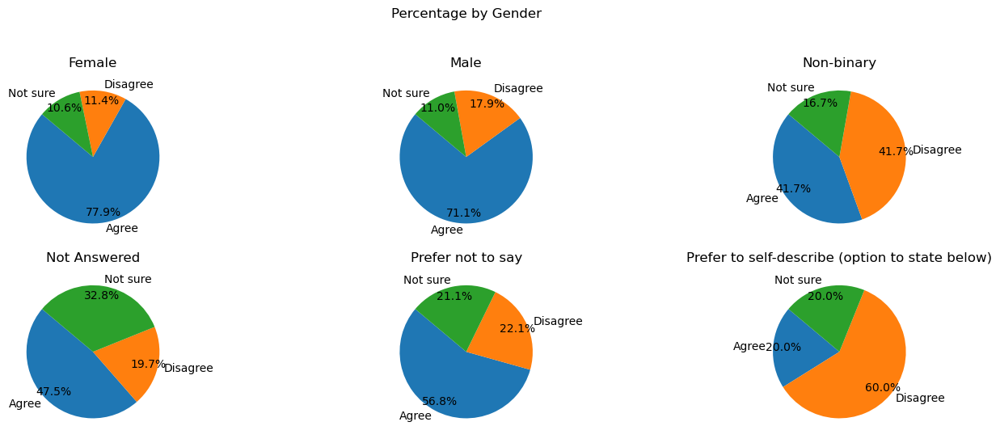

Summary by Gender:
* In the total of 2424, 'Female' group, 11.4% disagree, however 77.9% agreed and 10.6% are not sure.
* out of 1414, 'Male' category, the total of 17.9% of Male respondents disagree, 71.1% of respondents agree and unsure were 11.0% 
* out of total 303, 'Prefer not to say' category,56.8% of people in the Prefer not to say category agree with the statement, few 22.1% disagree and rest were not sure .

Conclusion:
Gender response data highlight females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Questi

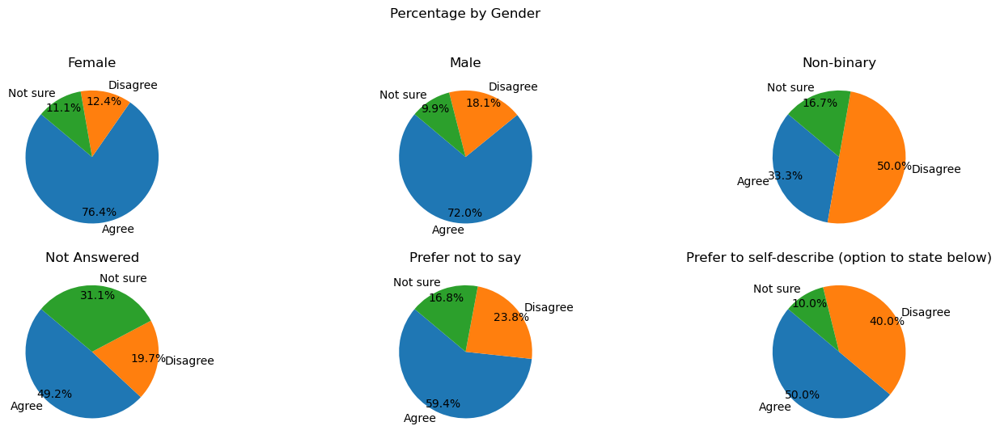

Summary by Gender:
* In the total of 2424, 'Female' group, 12.4% disagree, however 76.4% agreed and 11.1% are not sure.
* out of total 1414, 'Male' category,72.0% of people in the Male category agree with the statement, few 18.1% disagree and rest were not sure .
* In the total of 303, 'Prefer not to say' group, 23.8% disagree, however 59.4% agreed and 16.8% are not sure.

Conclusion:
Through the gender response study, it is clear that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do 

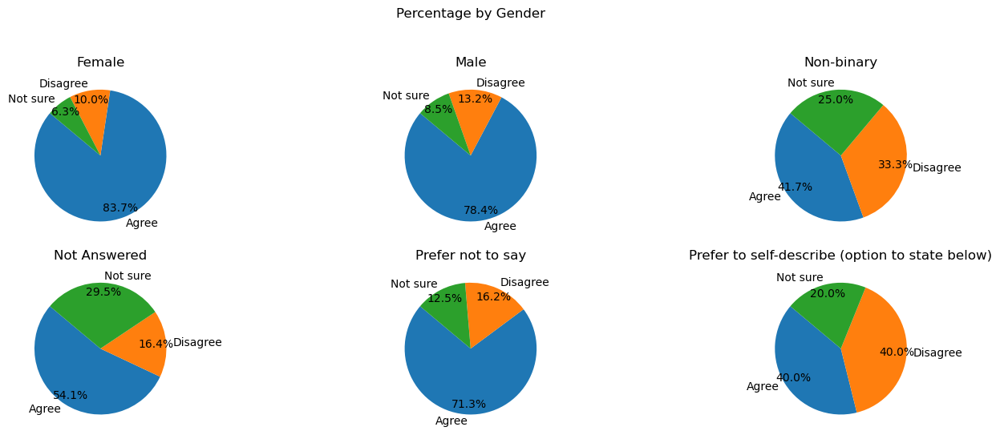

Summary by Gender:
* In the total of 2424, 'Female' group, 10.0% disagree, however 83.7% agreed and 6.3% are not sure.
* out of total 1414, 'Male' category,78.4% of people in the Male category agree with the statement, few 13.2% disagree and rest were not sure .
* out of 303, 'Prefer not to say' category, the total of 16.2% of Prefer not to say respondents disagree, 71.3% of respondents agree and unsure were 12.5% 

Conclusion:
In the analysis of gender responses, females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement. Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males.

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Questi

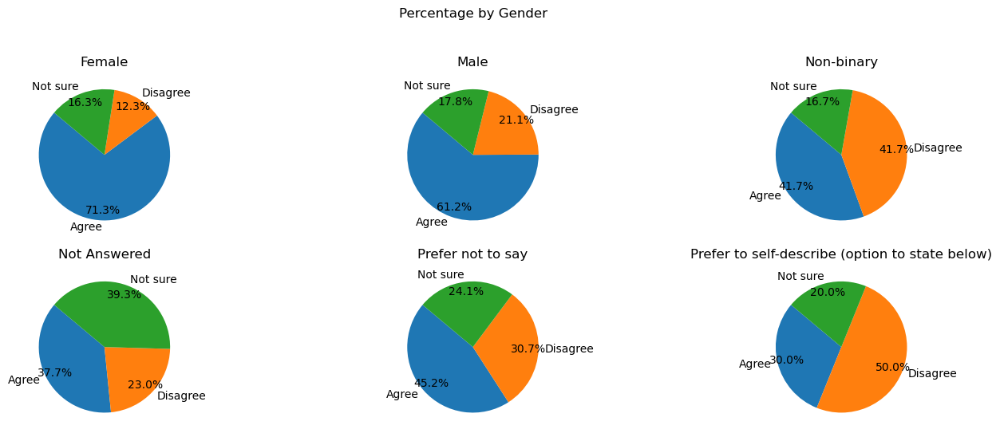

Summary by Gender:
* out of total 2424, 'Female' category,71.3% of people in the Female category agree with the statement, few 12.3% disagree and rest were not sure .
* out of 1414, 'Male' category, the total of 21.1% of Male respondents disagree, 61.2% of respondents agree and unsure were 17.8% 
* out of total 303, 'Prefer not to say' category,45.2% of people in the Prefer not to say category agree with the statement, few 30.7% disagree and rest were not sure .

Conclusion:
The gender-based response analysis reveals females has higher level of agreement compared to males, while males had a slightly higher level of disagreement, and also Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

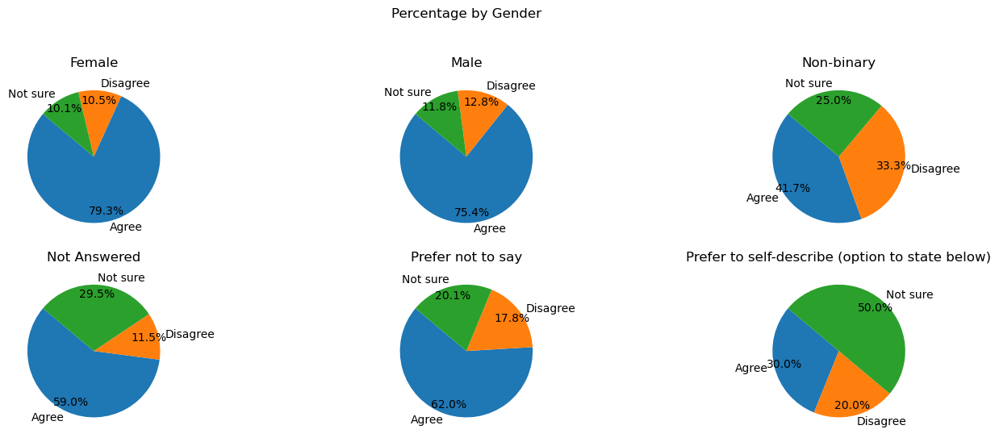

Summary by Gender:
* In the 2424, 'Female' category, 79.3% of participants agree, 10.5% disagree and 10.1% are not sure.
* In the total of 1414, 'Male' group, 12.8% disagree, however 75.4% agreed and 11.8% are not sure.
* out of total 303, 'Prefer not to say' category,62.0% of people in the Prefer not to say category agree with the statement, few 17.8% disagree and rest were not sure .

Conclusion:
Through the gender response study, it is clear that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To w

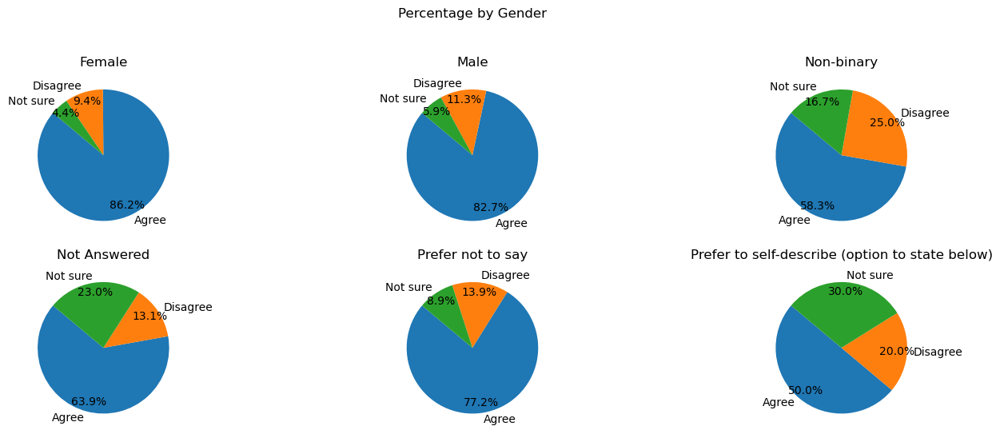

Summary by Gender:
* In the 2424, 'Female' category, 86.2% of participants agree, 9.4% disagree and 4.4% are not sure.
* In the total of 1414, 'Male' group, 11.3% disagree, however 82.7% agreed and 5.9% are not sure.
* In the total of 303, 'Prefer not to say' group, 13.9% disagree, however 77.2% agreed and 8.9% are not sure.

Conclusion:
From the gender responses, it was found that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation

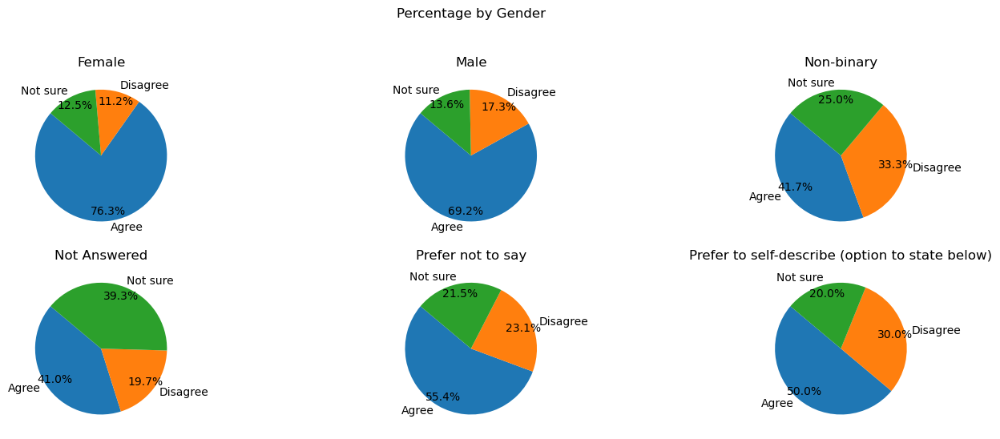

Summary by Gender:
* In the total of 2424, 'Female' group, 11.2% disagree, however 76.3% agreed and 12.5% are not sure.
* out of 1414, 'Male' category, the total of 17.3% of Male respondents disagree, 69.2% of respondents agree and unsure were 13.6% 
* out of 303, 'Prefer not to say' category, the total of 23.1% of Prefer not to say respondents disagree, 55.4% of respondents agree and unsure were 21.5% 

Conclusion:
Survey data show that females has almost similar but showed a slightly higher level of agreement compared to males; while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent d

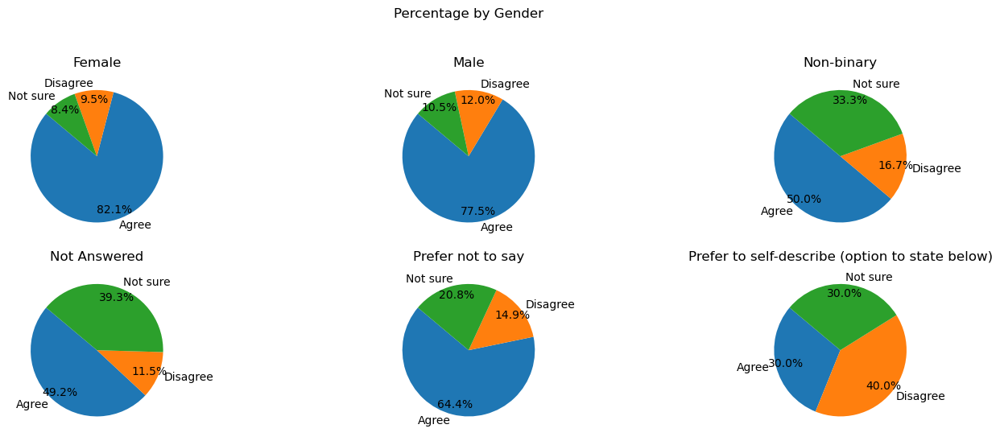

Summary by Gender:
* out of total 2424, 'Female' category,82.1% of people in the Female category agree with the statement, few 9.5% disagree and rest were not sure .
* out of 1414, 'Male' category, the total of 12.0% of Male respondents disagree, 77.5% of respondents agree and unsure were 10.5% 
* out of 303, 'Prefer not to say' category, the total of 14.9% of Prefer not to say respondents disagree, 64.4% of respondents agree and unsure were 20.8% 

Conclusion:
Examining the responses, we see that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, with Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

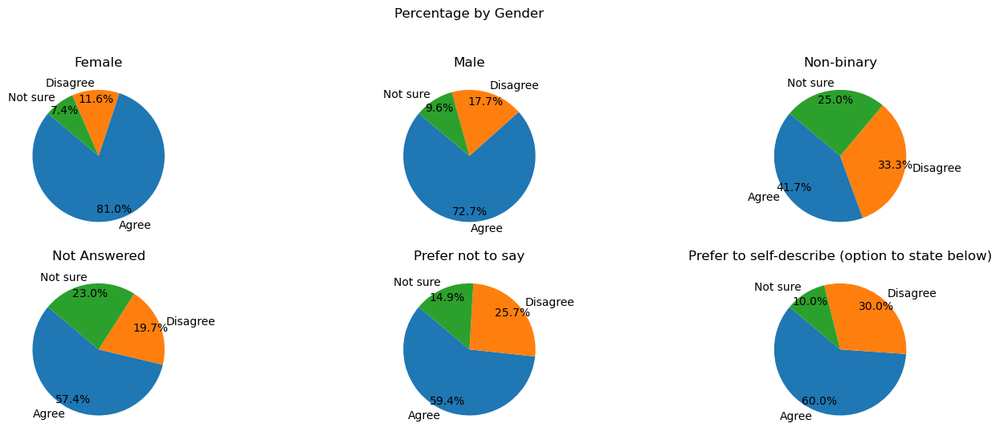

Summary by Gender:
* In the 2424, 'Female' category, 81.0% of participants agree, 11.6% disagree and 7.4% are not sure.
* out of 1414, 'Male' category, the total of 17.7% of Male respondents disagree, 72.7% of respondents agree and unsure were 9.6% 
* out of total 303, 'Prefer not to say' category,59.4% of people in the Prefer not to say category agree with the statement, few 25.7% disagree and rest were not sure .

Conclusion:
Examining the responses, we see that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, with Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column 

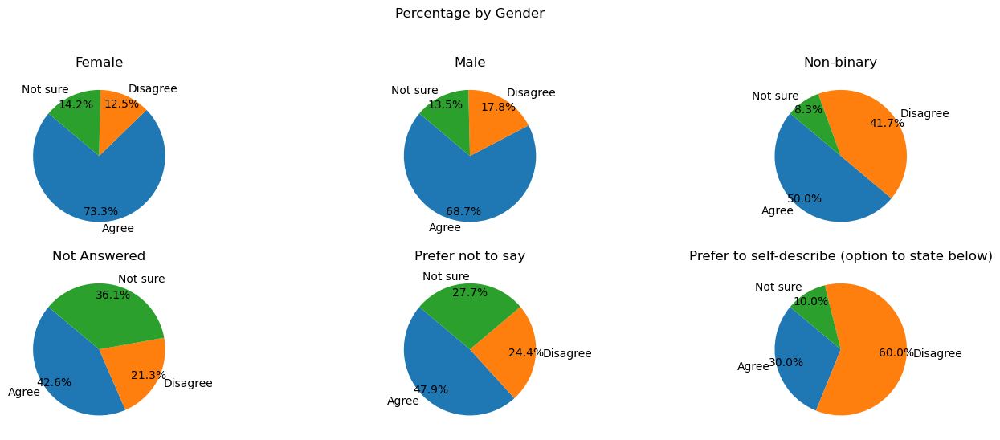

Summary by Gender:
* out of 2424, 'Female' category, the total of 12.5% of Female respondents disagree, 73.3% of respondents agree and unsure were 14.2% 
* In the 1414, 'Male' category, 68.7% of participants agree, 17.8% disagree and 13.5% are not sure.
* out of total 303, 'Prefer not to say' category,47.9% of people in the Prefer not to say category agree with the statement, few 24.4% disagree and rest were not sure .

Conclusion:
Through the gender response study, it is clear that females has almost similar but showed a slightly higher level of agreement compared to males, while males had a slightly higher level of disagreement, and Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males..

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [367]:
# Iterate over all column names
for column in df:
    
    if all(value in df[column].values for value in ["Agree", "Disagree", "Not sure"]):
        
        columnSeriesObj = df[column]
        print('\nColumn Question : ', column)
        print('Column Responses : ', columnSeriesObj.values)
        # Calculate percentages for gender
        gender_counts = df.groupby([gender, df[column]]).size().unstack(fill_value=0)
        gender_totals = gender_counts.sum(axis=1)
        gender_percentages = (gender_counts.T / gender_totals).T * 100

        print(gender_totals)

        # Filter gender categories with a count greater than 100
        filtered_gender_percentages = gender_percentages[gender_totals > 100]
        # Generate summaries for gender
        gender_summaries = create_summary(filtered_gender_percentages, gender_totals)

        # Plot pie charts for gender
        plot_pie_chart(gender_percentages, 'Percentage by Gender')

        # Display the summaries
        print("Summary by Gender:")
        for summary in gender_summaries:
            print(f"* {summary}")

        # Generate a common sentence without using percentages
        female_agree = gender_percentages.loc['Female', 'Agree']
        female_disagree = gender_percentages.loc['Female', 'Disagree']
        female_not_sure = gender_percentages.loc['Female', 'Not sure']

        male_agree = gender_percentages.loc['Male', 'Agree']
        male_disagree = gender_percentages.loc['Male', 'Disagree']
        male_not_sure = gender_percentages.loc['Male', 'Not sure']

        prefer_not_say_agree = gender_percentages.loc['Prefer not to say', 'Agree']
        prefer_not_say_disagree = gender_percentages.loc['Prefer not to say', 'Disagree']
        prefer_not_say_not_sure = gender_percentages.loc['Prefer not to say', 'Not sure']

        if female_agree - male_agree > 0.1 and female_agree - male_agree < 10:
            agree_comparison = "females has almost similar but showed a slightly higher level of agreement compared to males"
        elif male_agree - female_agree > 0.1 and male_agree - female_agree < 10:  
            agree_comparison = "males showed a similar but slightly higher level of agreement compared to females"
        elif female_agree - male_agree > 10:
            agree_comparison = "females has higher level of agreement compared to males"
        else:
            agree_comparison = "males showed higher level of agreement compared to females"

        if male_disagree - female_disagree > 0.1 and male_disagree - female_disagree < 10:
            disagree_comparison = "while males had a slightly higher level of disagreement"
        elif female_agree - male_agree > 0.1 and female_agree - male_agree < 10:
            disagree_comparison = "while females had a slightly higher level of disagreement"
        elif female_agree - male_agree > 10:
            disagree_comparison = "while females had a higher level of disagreement"
        else:
            disagree_comparison = "while males had a higher level of disagreement"

        if prefer_not_say_agree < female_agree and prefer_not_say_agree < male_agree:
            prefer_not_say_comparison = "Additionally, other groups had a moderate level of priorities and uncertainty compared to both females and males."
        else:
            prefer_not_say_comparison = "Additionally, the 'Prefer not to say' group had a different level of choices and uncertainty compared to both females and males."

        final_statement_sentences = [f"In the analysis of gender responses, {agree_comparison}, {disagree_comparison}. {prefer_not_say_comparison}",
                           f"In the survey results, {agree_comparison} were observed, {disagree_comparison} were recorded, and {prefer_not_say_comparison} were noted.",
                           f"From the gender responses, it was found that {agree_comparison}, {disagree_comparison}, and {prefer_not_say_comparison}.",
                           f"Survey data show that {agree_comparison}; {disagree_comparison}, and {prefer_not_say_comparison}.",
                           f"Examining the responses, we see that {agree_comparison}, {disagree_comparison}, with {prefer_not_say_comparison}.",
                           f"The gender-based response analysis reveals {agree_comparison}, {disagree_comparison}, and also {prefer_not_say_comparison}.",
                           f"According to the analysis, {agree_comparison}, {disagree_comparison}. Furthermore, {prefer_not_say_comparison}.",
                           f"Gender response data highlight {agree_comparison}, {disagree_comparison}, and {prefer_not_say_comparison}.",
                           f"Through the gender response study, it is clear that {agree_comparison}, {disagree_comparison}, and {prefer_not_say_comparison}."
                        ]
        final_statement = random.choice(final_statement_sentences)
        print("\nConclusion:")
        print(final_statement + "\n")
        print("-"*250)


# Age Statistics


Column Question :  To what extent do you agree or disagree with this vision statement for the Waste Strategy for Essex? - vision
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']
Which age group do you belong to? - Age
16-24                  21
25-34                 209
35-44                 535
45-54                 729
55-64                1054
65+                  1370
Not Answered           37
Prefer not to say     245
Under 16               24
dtype: int64


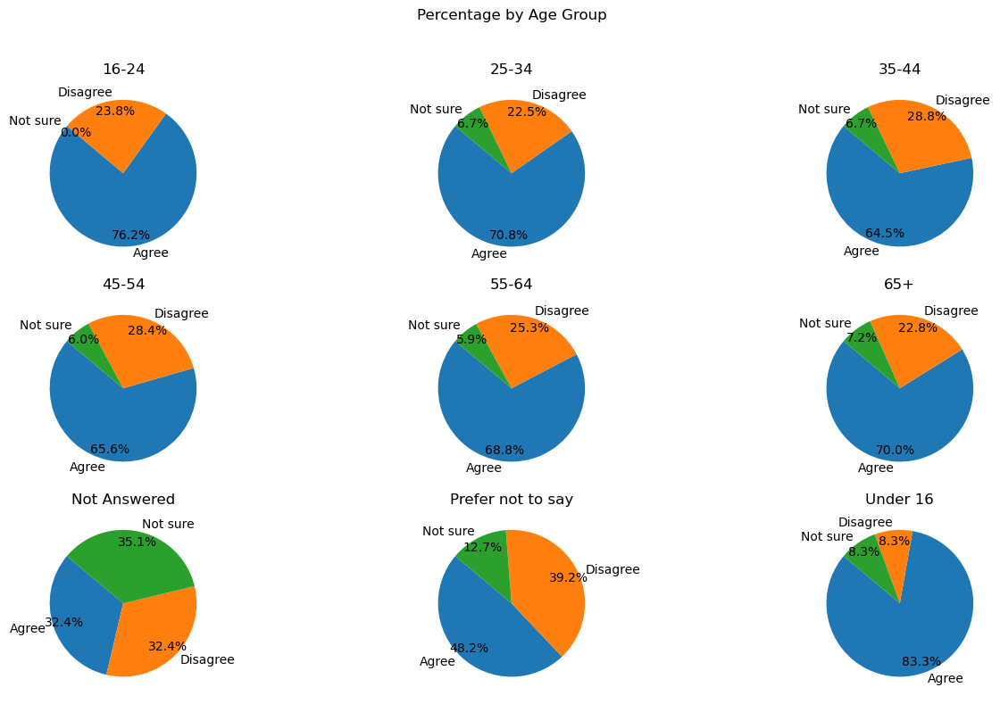


Summary by Age Group:
* In the 535, '35-44' category, 64.5% of participants agree, 28.8% disagree and 6.7% are not sure.
* In the 729, '45-54' category, 65.6% of participants agree, 28.4% disagree and 6.0% are not sure.
* In the total of 1054, '55-64' group, 25.3% disagree, however 68.8% agreed and 5.9% are not sure.
* out of 1370, '65+' category, the total of 22.8% of 65+ respondents disagree, 70.0% of respondents agree and unsure were 7.2% 

Conclusion for Age Group:
The data show that candidates in 45-54 showed higher levels of agreement compared to 35-44 and Here 65+ showed higher levels of agreement compared to those aged 55-64, while while those aged 35-44 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Every age group exhibited moderate uncertainty levels.

--------------------------------------------------------------------------------------------------------------------------------------------------------------------

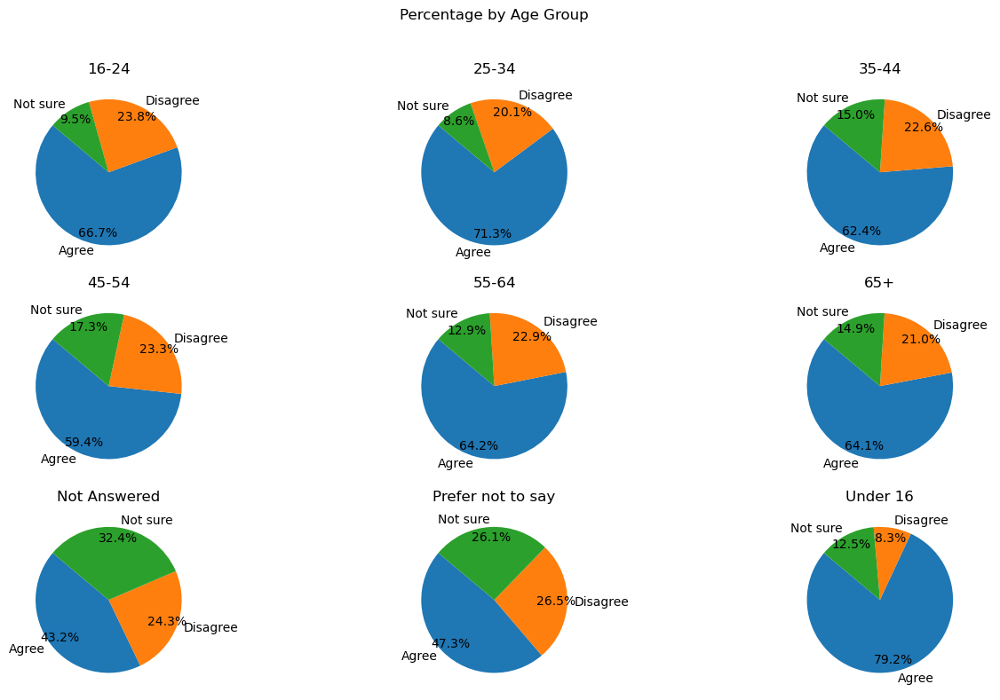


Summary by Age Group:
* In the 535, '35-44' category, 62.4% of participants agree, 22.6% disagree and 15.0% are not sure.
* In the total of 729, '45-54' group, 23.3% disagree, however 59.4% agreed and 17.3% are not sure.
* In the total of 1054, '55-64' group, 22.9% disagree, however 64.2% agreed and 12.9% are not sure.
* out of 1370, '65+' category, the total of 21.0% of 65+ respondents disagree, 64.1% of respondents agree and unsure were 14.9% 

Conclusion for Age Group:
Age group analysis revealed participants aged 35-44 showed higher levels of agreement with respect to 45-54, people aged 55-64 showed higher levels of agreement compared to 65+, and while those aged 45-54 exhibited higher levels of disagreement as well as while those aged 55-64 exhibited higher levels of disagreement. The levels of uncertainty were moderate throughout all age groups.

--------------------------------------------------------------------------------------------------------------------------------------

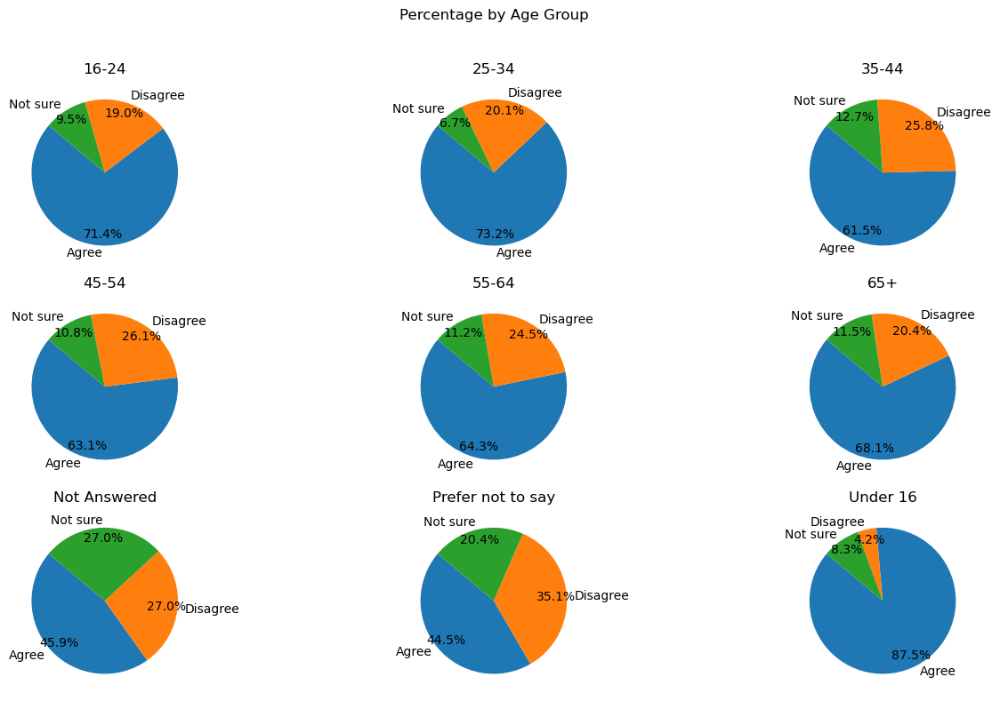


Summary by Age Group:
* In the total of 535, '35-44' group, 25.8% disagree, however 61.5% agreed and 12.7% are not sure.
* In the 729, '45-54' category, 63.1% of participants agree, 26.1% disagree and 10.8% are not sure.
* In the 1054, '55-64' category, 64.3% of participants agree, 24.5% disagree and 11.2% are not sure.
* out of 1370, '65+' category, the total of 20.4% of 65+ respondents disagree, 68.1% of respondents agree and unsure were 11.5% 

Conclusion for Age Group:
Age group analysis revealed candidates in 45-54 showed higher levels of agreement compared to 35-44, Here 65+ showed higher levels of agreement compared to those aged 55-64, and while those aged 45-54 exhibited higher levels of disagreement as well as while those aged 55-64 exhibited higher levels of disagreement. The levels of uncertainty were moderate throughout all age groups.

-----------------------------------------------------------------------------------------------------------------------------------------

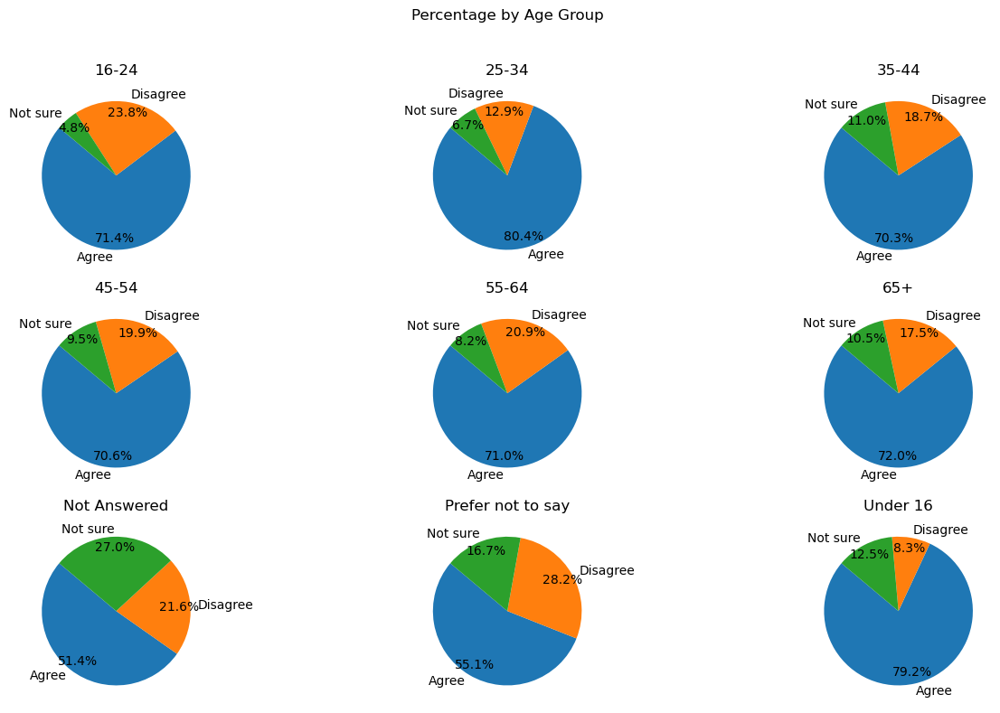


Summary by Age Group:
* In the 535, '35-44' category, 70.3% of participants agree, 18.7% disagree and 11.0% are not sure.
* In the total of 729, '45-54' group, 19.9% disagree, however 70.6% agreed and 9.5% are not sure.
* out of 1054, '55-64' category, the total of 20.9% of 55-64 respondents disagree, 71.0% of respondents agree and unsure were 8.2% 
* out of total 1370, '65+' category,72.0% of people in the 65+ category agree with the statement, few 17.5% disagree and rest were not sure .

Conclusion for Age Group:
Our analysis of age-based responses indicates candidates in 45-54 showed higher levels of agreement compared to 35-44 and Here 65+ showed higher levels of agreement compared to those aged 55-64, while those aged 45-54 exhibited higher levels of disagreement, and while those aged 55-64 exhibited higher levels of disagreement. Uncertainty remained moderate for all age groups.

----------------------------------------------------------------------------------------------------

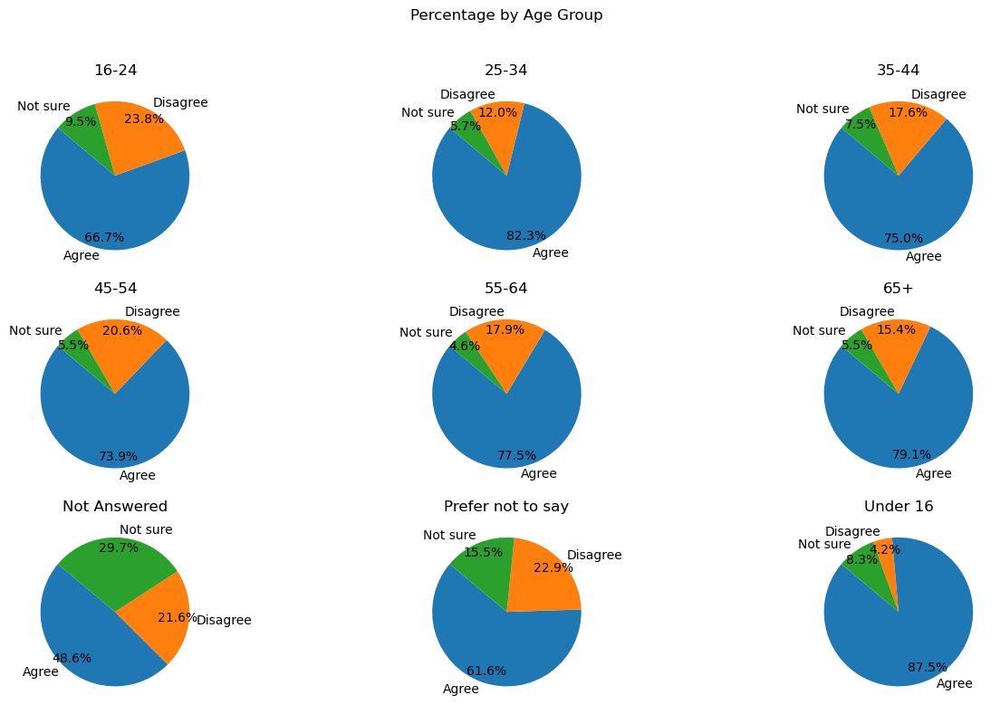


Summary by Age Group:
* out of total 535, '35-44' category,75.0% of people in the 35-44 category agree with the statement, few 17.6% disagree and rest were not sure .
* In the total of 729, '45-54' group, 20.6% disagree, however 73.9% agreed and 5.5% are not sure.
* out of total 1054, '55-64' category,77.5% of people in the 55-64 category agree with the statement, few 17.9% disagree and rest were not sure .
* out of 1370, '65+' category, the total of 15.4% of 65+ respondents disagree, 79.1% of respondents agree and unsure were 5.5% 

Conclusion for Age Group:
Age group analysis revealed participants aged 35-44 showed higher levels of agreement with respect to 45-54, Here 65+ showed higher levels of agreement compared to those aged 55-64, and while those aged 45-54 exhibited higher levels of disagreement as well as while those aged 55-64 exhibited higher levels of disagreement. The levels of uncertainty were moderate throughout all age groups.

-----------------------------------------

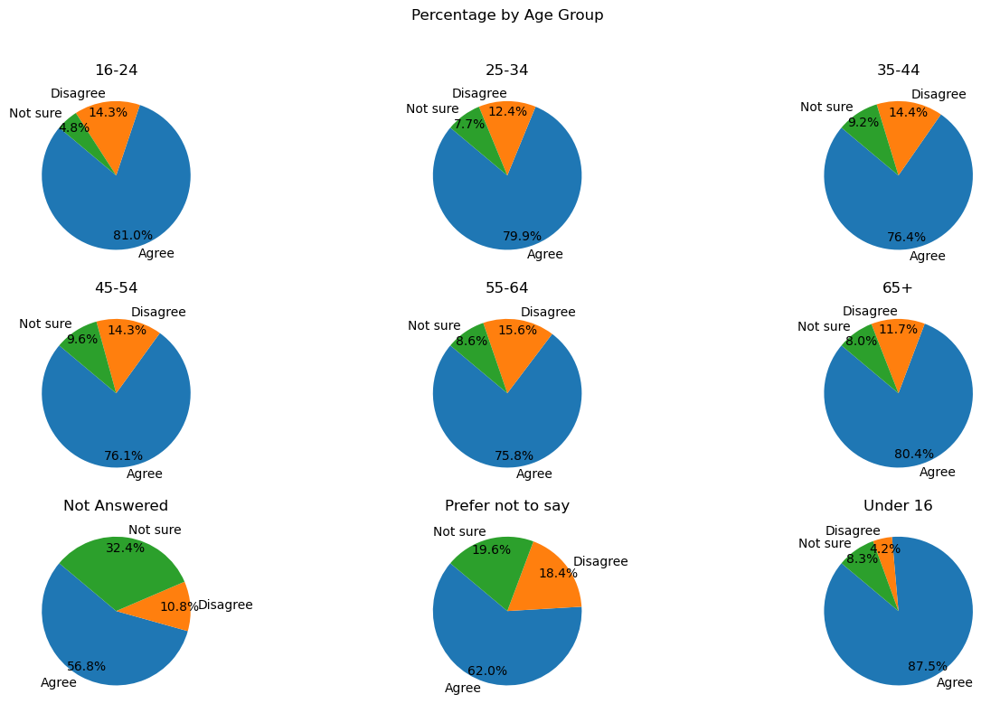


Summary by Age Group:
* In the total of 535, '35-44' group, 14.4% disagree, however 76.4% agreed and 9.2% are not sure.
* out of 729, '45-54' category, the total of 14.3% of 45-54 respondents disagree, 76.1% of respondents agree and unsure were 9.6% 
* In the total of 1054, '55-64' group, 15.6% disagree, however 75.8% agreed and 8.6% are not sure.
* In the total of 1370, '65+' group, 11.7% disagree, however 80.4% agreed and 8.0% are not sure.

Conclusion for Age Group:
Our analysis of age-based responses indicates participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, while those aged 35-44 exhibited higher levels of disagreement, and while those aged 55-64 exhibited higher levels of disagreement. Uncertainty remained moderate for all age groups.

-------------------------------------------------------------------------------------------------------------------------------------------

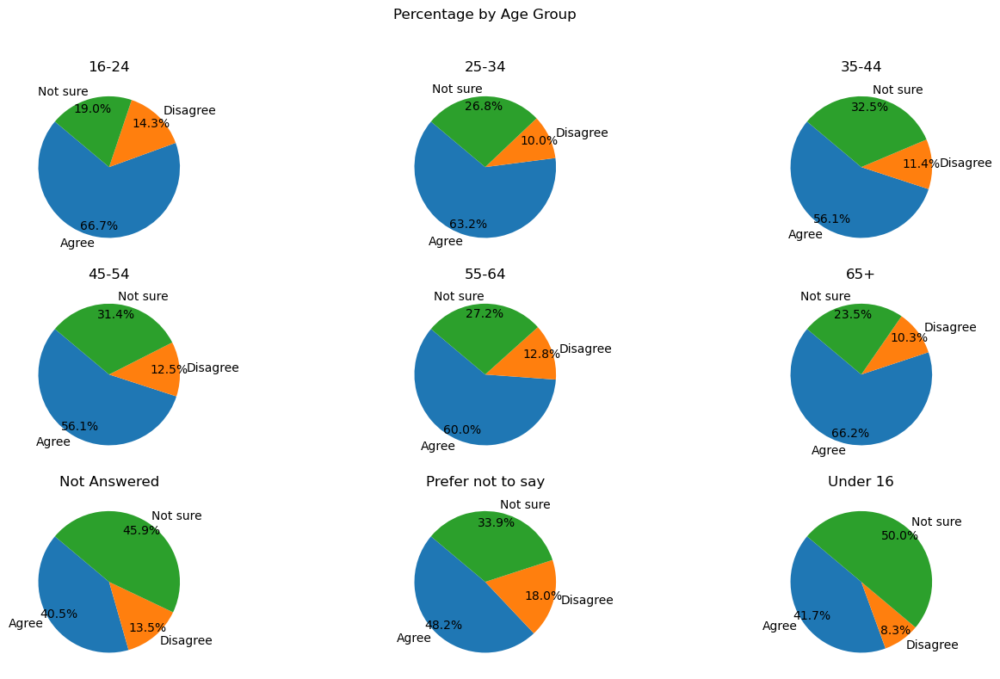


Summary by Age Group:
* In the 535, '35-44' category, 56.1% of participants agree, 11.4% disagree and 32.5% are not sure.
* In the 729, '45-54' category, 56.1% of participants agree, 12.5% disagree and 31.4% are not sure.
* out of 1054, '55-64' category, the total of 12.8% of 55-64 respondents disagree, 60.0% of respondents agree and unsure were 27.2% 
* In the total of 1370, '65+' group, 10.3% disagree, however 66.2% agreed and 23.5% are not sure.

Conclusion for Age Group:
The analysis of responses by age groups shows that candidates in 45-54 showed higher levels of agreement compared to 35-44, Here 65+ showed higher levels of agreement compared to those aged 55-64, with while those aged 45-54 exhibited higher levels of disagreement, and while those aged 55-64 exhibited higher levels of disagreement. Across all age groups, uncertainty levels were found to be moderate.

-------------------------------------------------------------------------------------------------------------------

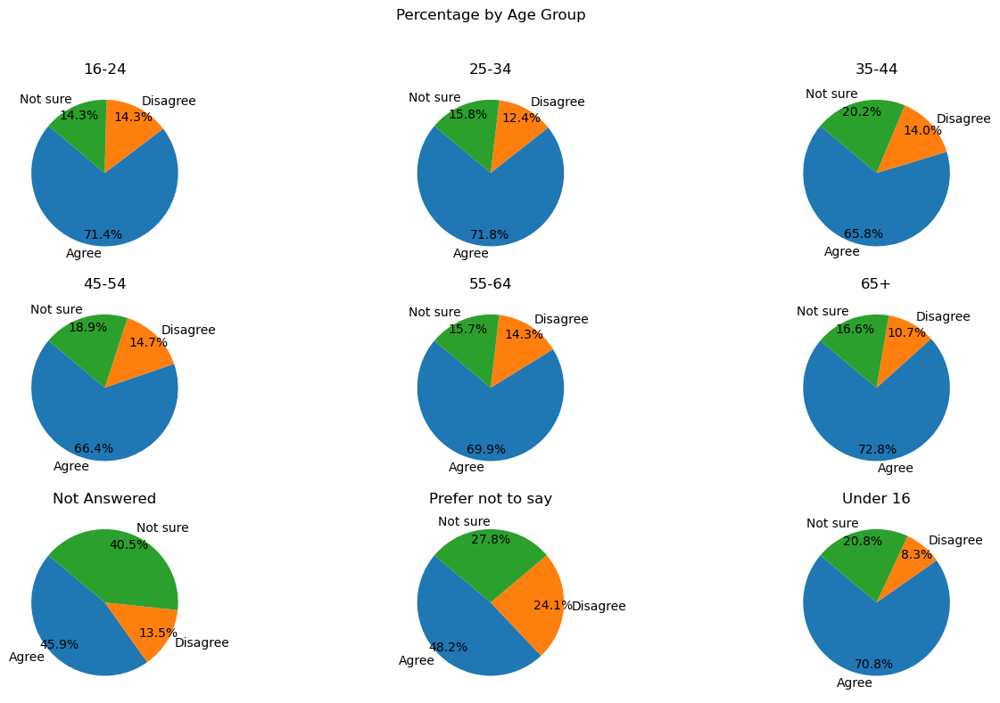


Summary by Age Group:
* out of 535, '35-44' category, the total of 14.0% of 35-44 respondents disagree, 65.8% of respondents agree and unsure were 20.2% 
* In the 729, '45-54' category, 66.4% of participants agree, 14.7% disagree and 18.9% are not sure.
* In the total of 1054, '55-64' group, 14.3% disagree, however 69.9% agreed and 15.7% are not sure.
* out of total 1370, '65+' category,72.8% of people in the 65+ category agree with the statement, few 10.7% disagree and rest were not sure .

Conclusion for Age Group:
According to the age group analysis, candidates in 45-54 showed higher levels of agreement compared to 35-44 and Here 65+ showed higher levels of agreement compared to those aged 55-64, while while those aged 45-54 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Uncertainty was consistently moderate among all age groups.

--------------------------------------------------------------------------------------------

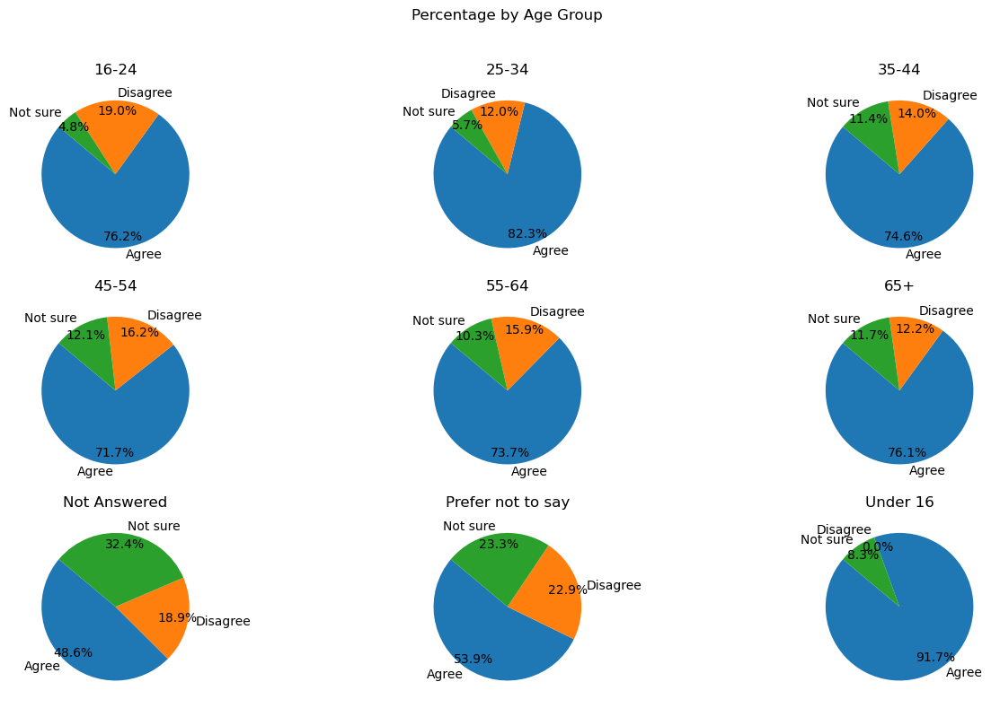


Summary by Age Group:
* In the total of 535, '35-44' group, 14.0% disagree, however 74.6% agreed and 11.4% are not sure.
* out of total 729, '45-54' category,71.7% of people in the 45-54 category agree with the statement, few 16.2% disagree and rest were not sure .
* In the total of 1054, '55-64' group, 15.9% disagree, however 73.7% agreed and 10.3% are not sure.
* out of total 1370, '65+' category,76.1% of people in the 65+ category agree with the statement, few 12.2% disagree and rest were not sure .

Conclusion for Age Group:
The data show that participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, while while those aged 45-54 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Every age group exhibited moderate uncertainty levels.

-----------------------------------------------------------------------------------------------

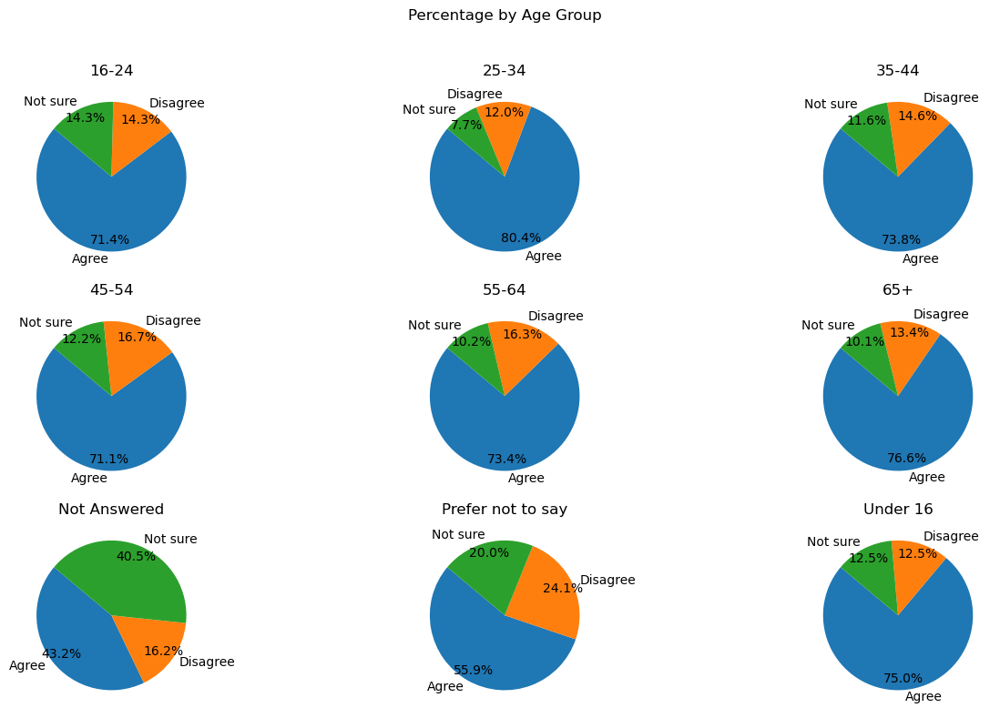


Summary by Age Group:
* out of total 535, '35-44' category,73.8% of people in the 35-44 category agree with the statement, few 14.6% disagree and rest were not sure .
* out of total 729, '45-54' category,71.1% of people in the 45-54 category agree with the statement, few 16.7% disagree and rest were not sure .
* In the total of 1054, '55-64' group, 16.3% disagree, however 73.4% agreed and 10.2% are not sure.
* In the 1370, '65+' category, 76.6% of participants agree, 13.4% disagree and 10.1% are not sure.

Conclusion for Age Group:
An analysis of the age groups highlights participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, with while those aged 45-54 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Moderate uncertainty was present across all groups.

--------------------------------------------------------------------------

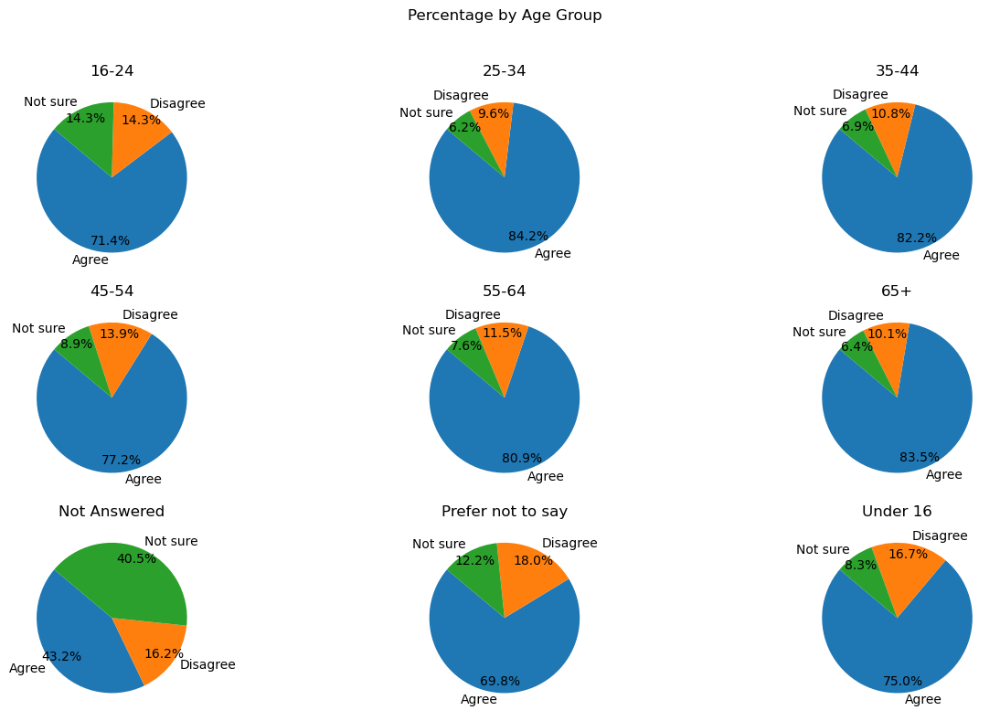


Summary by Age Group:
* out of total 535, '35-44' category,82.2% of people in the 35-44 category agree with the statement, few 10.8% disagree and rest were not sure .
* out of total 729, '45-54' category,77.2% of people in the 45-54 category agree with the statement, few 13.9% disagree and rest were not sure .
* out of total 1054, '55-64' category,80.9% of people in the 55-64 category agree with the statement, few 11.5% disagree and rest were not sure .
* out of 1370, '65+' category, the total of 10.1% of 65+ respondents disagree, 83.5% of respondents agree and unsure were 6.4% 

Conclusion for Age Group:
Our analysis of age-based responses indicates participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, while those aged 45-54 exhibited higher levels of disagreement, and while those aged 55-64 exhibited higher levels of disagreement. Uncertainty remained moderate for all age groups.



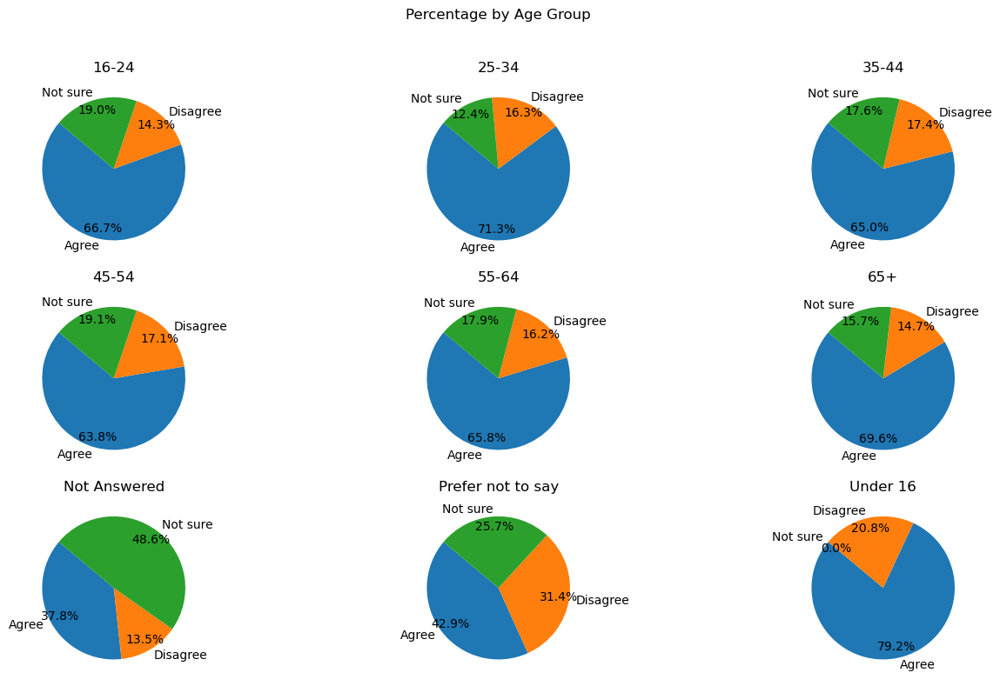


Summary by Age Group:
* out of total 535, '35-44' category,65.0% of people in the 35-44 category agree with the statement, few 17.4% disagree and rest were not sure .
* In the 729, '45-54' category, 63.8% of participants agree, 17.1% disagree and 19.1% are not sure.
* out of total 1054, '55-64' category,65.8% of people in the 55-64 category agree with the statement, few 16.2% disagree and rest were not sure .
* In the total of 1370, '65+' group, 14.7% disagree, however 69.6% agreed and 15.7% are not sure.

Conclusion for Age Group:
Analyzing the responses by age groups, we observed participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, and also while those aged 35-44 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Each age group showed moderate levels of uncertainty.

----------------------------------------------------------

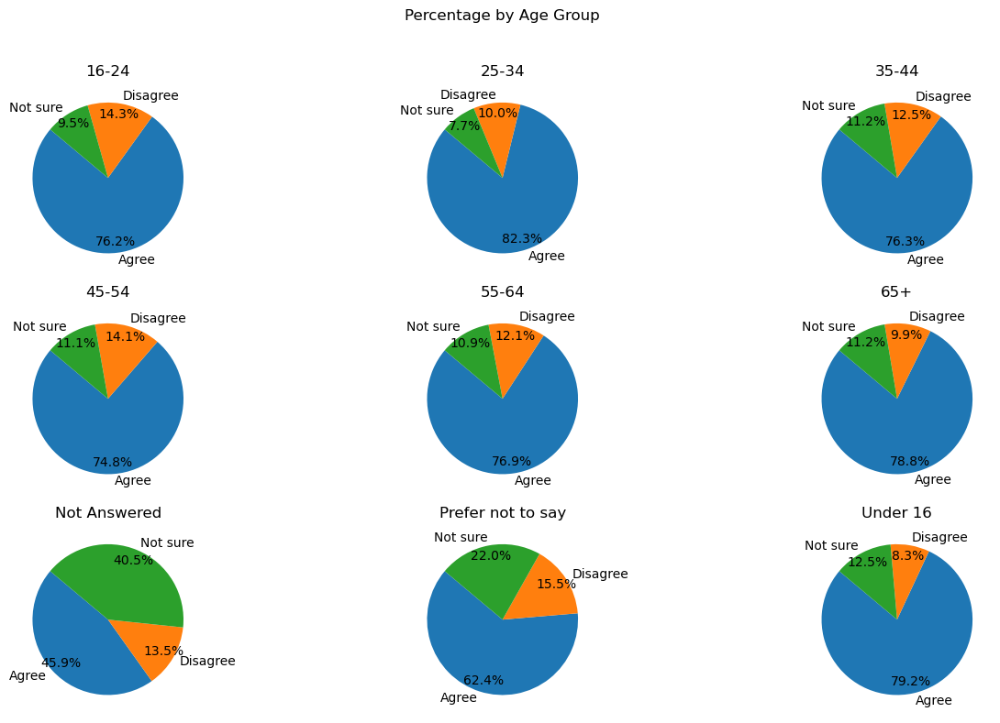


Summary by Age Group:
* In the 535, '35-44' category, 76.3% of participants agree, 12.5% disagree and 11.2% are not sure.
* In the 729, '45-54' category, 74.8% of participants agree, 14.1% disagree and 11.1% are not sure.
* out of 1054, '55-64' category, the total of 12.1% of 55-64 respondents disagree, 76.9% of respondents agree and unsure were 10.9% 
* out of 1370, '65+' category, the total of 9.9% of 65+ respondents disagree, 78.8% of respondents agree and unsure were 11.2% 

Conclusion for Age Group:
Analyzing the responses by age groups, we observed participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, and also while those aged 45-54 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Each age group showed moderate levels of uncertainty.

--------------------------------------------------------------------------------------

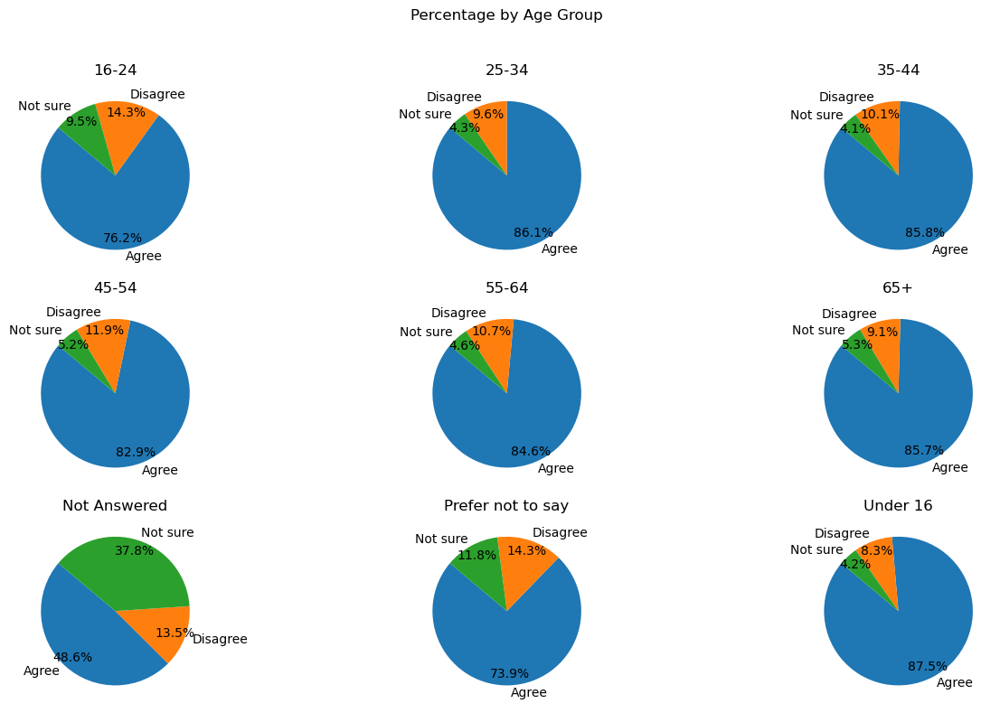


Summary by Age Group:
* In the total of 535, '35-44' group, 10.1% disagree, however 85.8% agreed and 4.1% are not sure.
* In the total of 729, '45-54' group, 11.9% disagree, however 82.9% agreed and 5.2% are not sure.
* out of 1054, '55-64' category, the total of 10.7% of 55-64 respondents disagree, 84.6% of respondents agree and unsure were 4.6% 
* out of 1370, '65+' category, the total of 9.1% of 65+ respondents disagree, 85.7% of respondents agree and unsure were 5.3% 

Conclusion for Age Group:
The analysis of responses by age groups shows that participants aged 35-44 showed higher levels of agreement with respect to 45-54, Here 65+ showed higher levels of agreement compared to those aged 55-64, with while those aged 45-54 exhibited higher levels of disagreement, and while those aged 55-64 exhibited higher levels of disagreement. Across all age groups, uncertainty levels were found to be moderate.

-----------------------------------------------------------------------------------

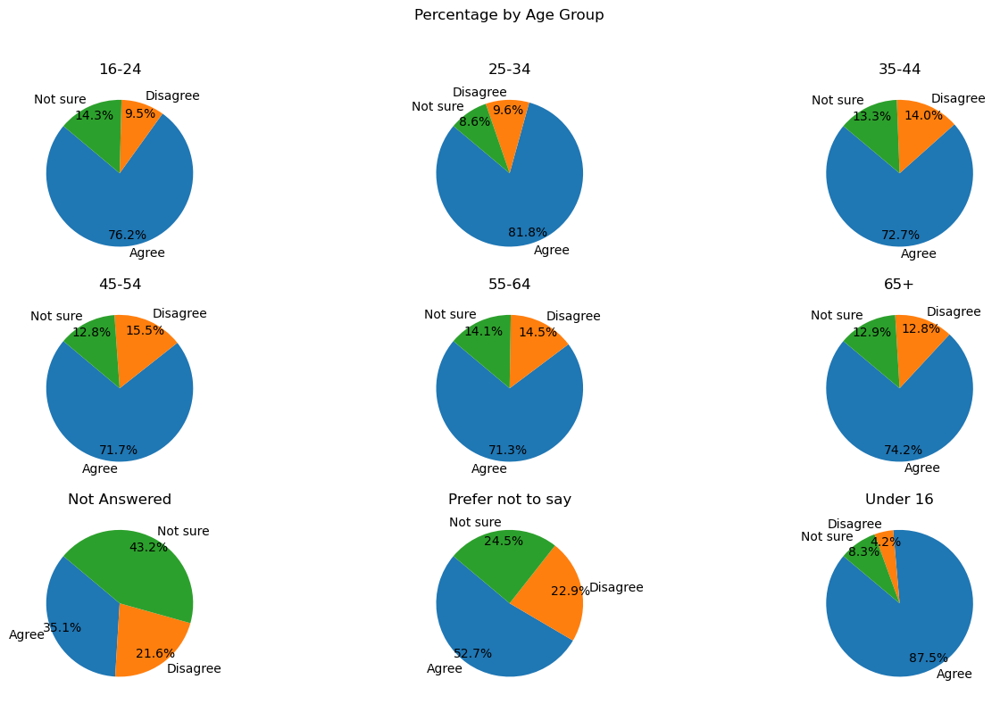


Summary by Age Group:
* In the total of 535, '35-44' group, 14.0% disagree, however 72.7% agreed and 13.3% are not sure.
* In the 729, '45-54' category, 71.7% of participants agree, 15.5% disagree and 12.8% are not sure.
* In the 1054, '55-64' category, 71.3% of participants agree, 14.5% disagree and 14.1% are not sure.
* out of 1370, '65+' category, the total of 12.8% of 65+ respondents disagree, 74.2% of respondents agree and unsure were 12.9% 

Conclusion for Age Group:
Our analysis of age-based responses indicates participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, while those aged 45-54 exhibited higher levels of disagreement, and while those aged 55-64 exhibited higher levels of disagreement. Uncertainty remained moderate for all age groups.

---------------------------------------------------------------------------------------------------------------------------------------

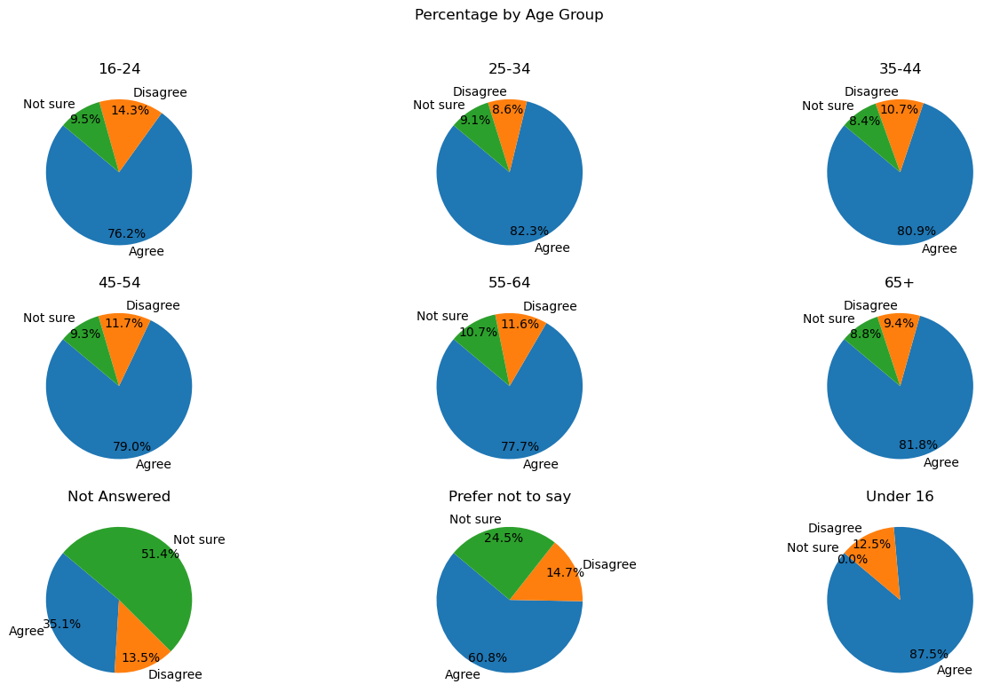


Summary by Age Group:
* out of 535, '35-44' category, the total of 10.7% of 35-44 respondents disagree, 80.9% of respondents agree and unsure were 8.4% 
* out of 729, '45-54' category, the total of 11.7% of 45-54 respondents disagree, 79.0% of respondents agree and unsure were 9.3% 
* In the total of 1054, '55-64' group, 11.6% disagree, however 77.7% agreed and 10.7% are not sure.
* In the total of 1370, '65+' group, 9.4% disagree, however 81.8% agreed and 8.8% are not sure.

Conclusion for Age Group:
In examining age group responses, we found that participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, along with while those aged 45-54 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Moderate uncertainty was noted across all age groups.

------------------------------------------------------------------------------------------

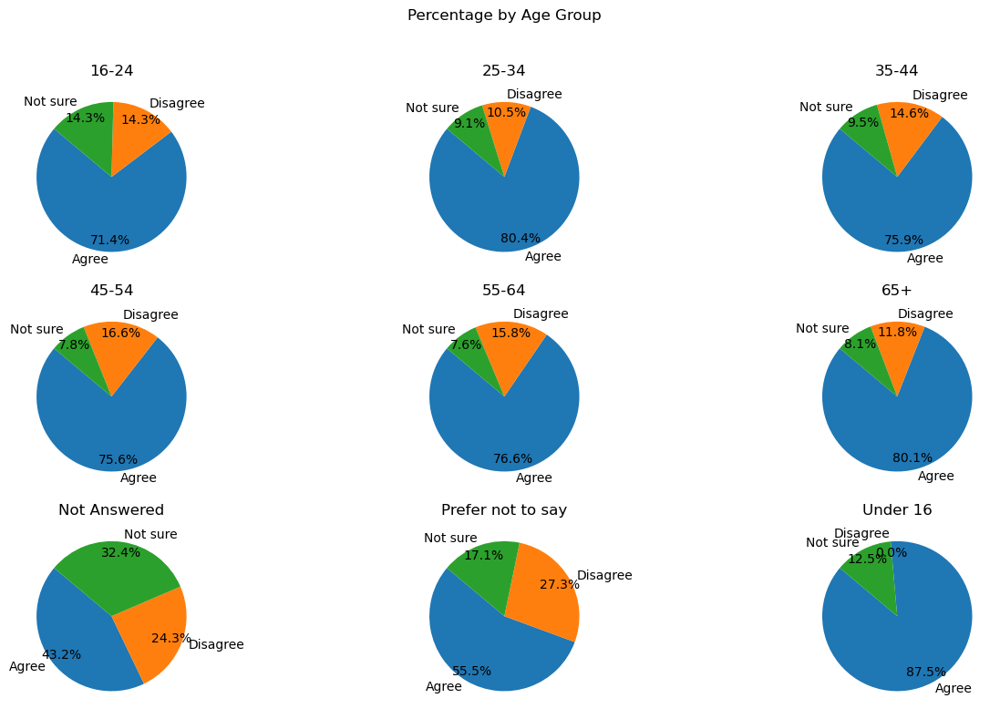


Summary by Age Group:
* In the 535, '35-44' category, 75.9% of participants agree, 14.6% disagree and 9.5% are not sure.
* In the total of 729, '45-54' group, 16.6% disagree, however 75.6% agreed and 7.8% are not sure.
* out of 1054, '55-64' category, the total of 15.8% of 55-64 respondents disagree, 76.6% of respondents agree and unsure were 7.6% 
* out of total 1370, '65+' category,80.1% of people in the 65+ category agree with the statement, few 11.8% disagree and rest were not sure .

Conclusion for Age Group:
Based on the age group data, participants aged 35-44 showed higher levels of agreement with respect to 45-54, Here 65+ showed higher levels of agreement compared to those aged 55-64, while those aged 45-54 exhibited higher levels of disagreement, and while those aged 55-64 exhibited higher levels of disagreement. Uncertainty was moderate across the age spectrum.

-----------------------------------------------------------------------------------------------------------------

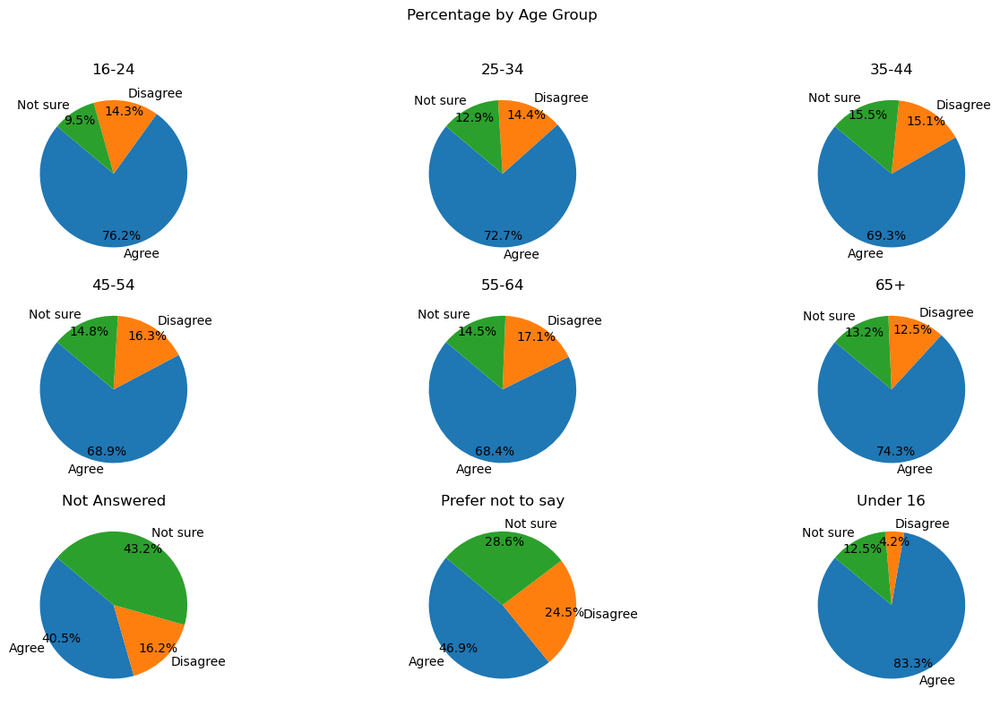


Summary by Age Group:
* out of 535, '35-44' category, the total of 15.1% of 35-44 respondents disagree, 69.3% of respondents agree and unsure were 15.5% 
* out of total 729, '45-54' category,68.9% of people in the 45-54 category agree with the statement, few 16.3% disagree and rest were not sure .
* In the total of 1054, '55-64' group, 17.1% disagree, however 68.4% agreed and 14.5% are not sure.
* out of 1370, '65+' category, the total of 12.5% of 65+ respondents disagree, 74.3% of respondents agree and unsure were 13.2% 

Conclusion for Age Group:
Analyzing the responses by age groups, we observed participants aged 35-44 showed higher levels of agreement with respect to 45-54 and Here 65+ showed higher levels of agreement compared to those aged 55-64, and also while those aged 45-54 exhibited higher levels of disagreement and while those aged 55-64 exhibited higher levels of disagreement. Each age group showed moderate levels of uncertainty.

-----------------------------------------

In [368]:
# Iterate over all column names
for column in df:
    if all(value in df[column].values for value in ["Agree", "Disagree", "Not sure"]):
        
        columnSeriesObj = df[column]
        print('\nColumn Question : ', column)
        print('Column Responses : ', columnSeriesObj.values)
        # Calculate percentages for age groups
        age_counts = df.groupby([age, df[column]]).size().unstack(fill_value=0)
        age_totals = age_counts.sum(axis=1)
        age_percentages = (age_counts.T / age_totals).T * 100

        print(age_totals)

        # Filter age categories with a count greater than 100
        filtered_age_percentages = age_percentages[age_totals > 500]
        # Generate summaries for age group
        age_summaries = create_summary(filtered_age_percentages, age_totals)

        # Plot pie charts for age groups
        plot_pie_chart(age_percentages, 'Percentage by Age Group')

        print("\nSummary by Age Group:")
        for summary in age_summaries:
            print(f"* {summary}")

        # Generate common sentence without using percentages for age group
        agree_35_44 = age_percentages.loc['35-44', 'Agree']
        disagree_35_44 = age_percentages.loc['35-44', 'Disagree']

        agree_45_54 = age_percentages.loc['45-54', 'Agree']
        disagree_45_54 = age_percentages.loc['45-54', 'Disagree']

        agree_55_64 = age_percentages.loc['55-64', 'Agree']
        disagree_55_64 = age_percentages.loc['55-64', 'Disagree']

        agree_65_plus = age_percentages.loc['65+', 'Agree']
        disagree_65_plus = age_percentages.loc['65+', 'Disagree']

        # Comparisons for agreement levels
        if agree_35_44 > agree_45_54:
            agree_comparison_35_44_45_54 = "participants aged 35-44 showed higher levels of agreement with respect to 45-54"
        else:
            agree_comparison_35_44_45_54 = "candidates in 45-54 showed higher levels of agreement compared to 35-44"

        if agree_55_64 > agree_65_plus:
            agree_comparison_55_64_65_plus = "people aged 55-64 showed higher levels of agreement compared to 65+"
        else:
            agree_comparison_55_64_65_plus = "Here 65+ showed higher levels of agreement compared to those aged 55-64"

        # Comparisons for disagreement levels
        if disagree_35_44 > disagree_45_54:
            disagree_comparison_35_44_45_54 = "while those aged 35-44 exhibited higher levels of disagreement"
        else:
            disagree_comparison_35_44_45_54 = "while those aged 45-54 exhibited higher levels of disagreement"

        if disagree_55_64 > disagree_65_plus:
            disagree_comparison_55_64_65_plus = "while those aged 55-64 exhibited higher levels of disagreement"
        else:
            disagree_comparison_55_64_65_plus = "while those aged 65+ exhibited higher levels of disagreement"

        # Final statement for age groups
        final_statement_age_sentences = [f"Based on the analysis of age group responses, {agree_comparison_35_44_45_54}, {agree_comparison_55_64_65_plus}, {disagree_comparison_35_44_45_54}, and {disagree_comparison_55_64_65_plus}. Uncertainty levels were moderate across all age groups.",
                               f"According to the age group analysis, {agree_comparison_35_44_45_54} and {agree_comparison_55_64_65_plus}, while {disagree_comparison_35_44_45_54} and {disagree_comparison_55_64_65_plus}. Uncertainty was consistently moderate among all age groups.",
                               f"The analysis of responses by age groups shows that {agree_comparison_35_44_45_54}, {agree_comparison_55_64_65_plus}, with {disagree_comparison_35_44_45_54}, and {disagree_comparison_55_64_65_plus}. Across all age groups, uncertainty levels were found to be moderate.",
                               f"In examining age group responses, we found that {agree_comparison_35_44_45_54} and {agree_comparison_55_64_65_plus}, along with {disagree_comparison_35_44_45_54} and {disagree_comparison_55_64_65_plus}. Moderate uncertainty was noted across all age groups.",
                               f"Age group analysis revealed {agree_comparison_35_44_45_54}, {agree_comparison_55_64_65_plus}, and {disagree_comparison_35_44_45_54} as well as {disagree_comparison_55_64_65_plus}. The levels of uncertainty were moderate throughout all age groups.",
                               f"Our analysis of age-based responses indicates {agree_comparison_35_44_45_54} and {agree_comparison_55_64_65_plus}, {disagree_comparison_35_44_45_54}, and {disagree_comparison_55_64_65_plus}. Uncertainty remained moderate for all age groups.",
                               f"The data show that {agree_comparison_35_44_45_54} and {agree_comparison_55_64_65_plus}, while {disagree_comparison_35_44_45_54} and {disagree_comparison_55_64_65_plus}. Every age group exhibited moderate uncertainty levels.",
                               f"An analysis of the age groups highlights {agree_comparison_35_44_45_54} and {agree_comparison_55_64_65_plus}, with {disagree_comparison_35_44_45_54} and {disagree_comparison_55_64_65_plus}. Moderate uncertainty was present across all groups.",
                               f"Based on the age group data, {agree_comparison_35_44_45_54}, {agree_comparison_55_64_65_plus}, {disagree_comparison_35_44_45_54}, and {disagree_comparison_55_64_65_plus}. Uncertainty was moderate across the age spectrum.",
                               f"Analyzing the responses by age groups, we observed {agree_comparison_35_44_45_54} and {agree_comparison_55_64_65_plus}, and also {disagree_comparison_35_44_45_54} and {disagree_comparison_55_64_65_plus}. Each age group showed moderate levels of uncertainty."
                              
                            ]
        final_statement_age = random.choice(final_statement_age_sentences)
        print("\nConclusion for Age Group:")
        print(final_statement_age + "\n")
        print("-"*250)

# District Statistics


Column Question :  To what extent do you agree or disagree with this vision statement for the Waste Strategy for Essex? - vision
Column Responses :  ['Agree' 'Agree' 'Agree' ... 'Not sure' 'Agree' 'Agree']
Which Essex district, city or borough do you live in? - District
Basildon                                                630
Braintree                                               425
Brentwood                                               174
Castle Point                                            188
Chelmsford                                              691
Colchester                                              578
Epping Forest                                           193
Harlow                                                  124
I live in another neighbouring county (please state)     15
Maldon                                                  189
Not Answered                                             33
Other (please state)                                     20
Prefer n

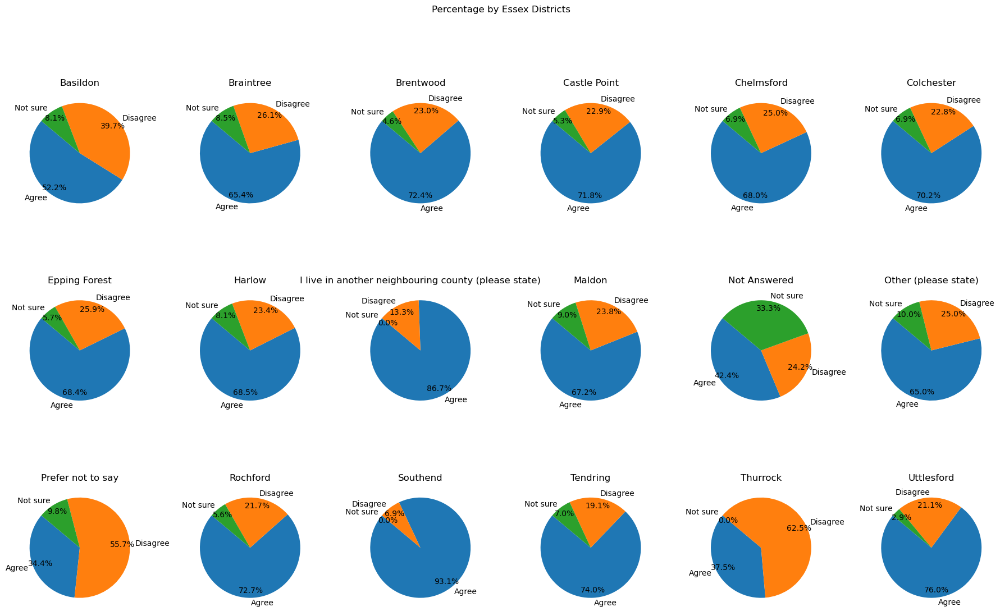


Summary by Essex Districts:
* In the 'Basildon' district out of total 630 people, 39.7% disagree, however 52.2% agreed and 8.1% are not sure.
* In 'Braintree' district out of 425 people, 65.4% of participants agree, 26.1% disagree and 8.5% are not sure.
* In 'Chelmsford' district out of 691 people, 68.0% of participants agree, 25.0% disagree and 6.9% are not sure.
* out of 578 people in 'Colchester' district, 70.2% of people in the Colchester district agree with the statement, few 22.8% disagree and rest were not sure .
* out of 530 people in 'Tendring' district, the total of 19.1% of Tendring respondents disagree, 74.0% of respondents agree and unsure were 7.0% 
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priori

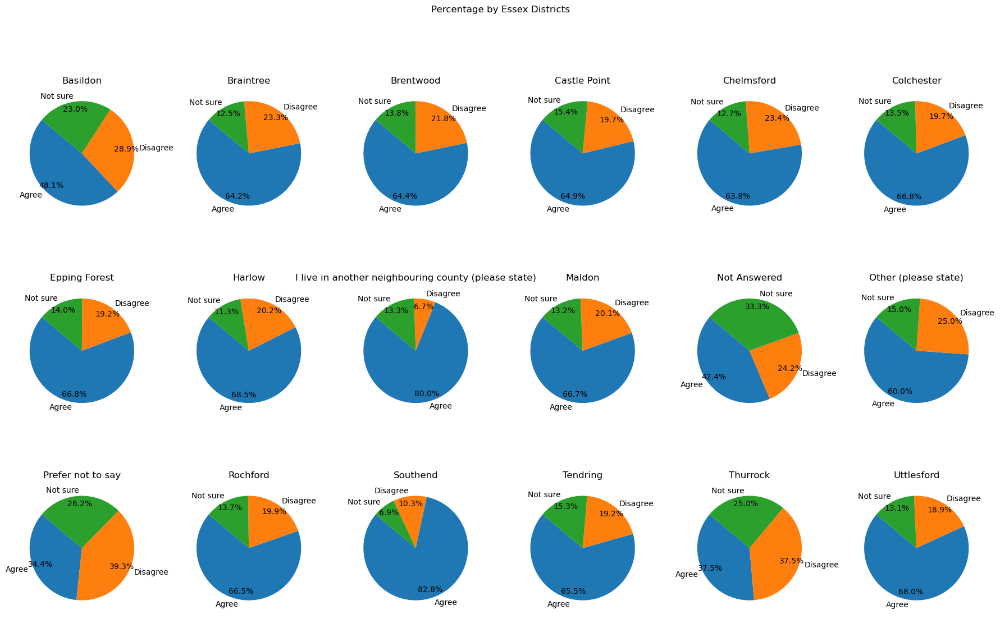


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, 48.1% of people in the Basildon district agree with the statement, few 28.9% disagree and rest were not sure .
* In 'Braintree' district out of 425 people, 64.2% of participants agree, 23.3% disagree and 12.5% are not sure.
* out of 691 people in 'Chelmsford' district, 63.8% of people in the Chelmsford district agree with the statement, few 23.4% disagree and rest were not sure .
* In the 'Colchester' district out of total 578 people, 19.7% disagree, however 66.8% agreed and 13.5% are not sure.
* out of 530 people in 'Tendring' district, 65.5% of people in the Tendring district agree with the statement, few 19.2% disagree and rest were not sure .
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  T

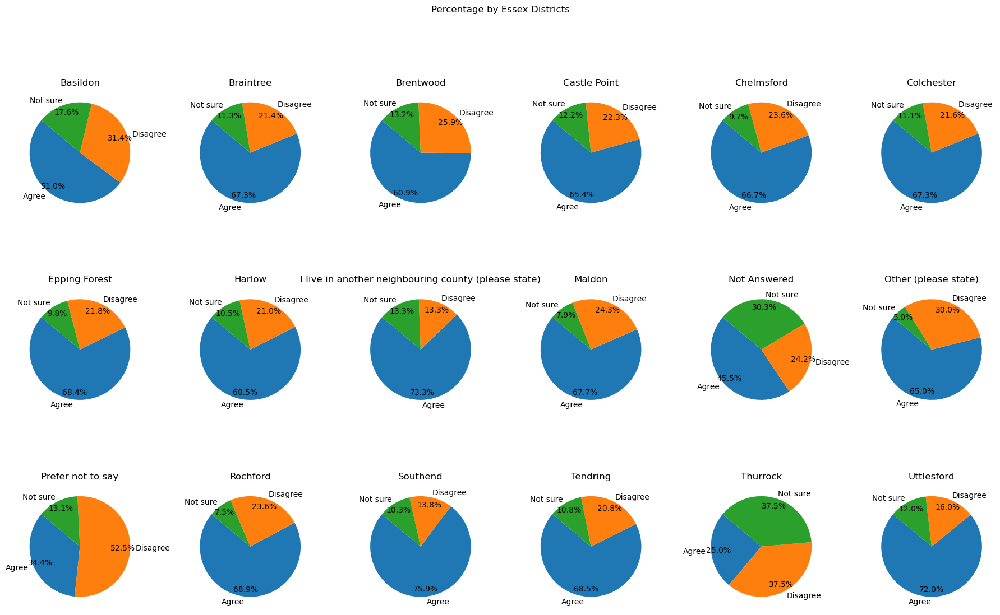


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, the total of 31.4% of Basildon respondents disagree, 51.0% of respondents agree and unsure were 17.6% 
* In 'Braintree' district out of 425 people, 67.3% of participants agree, 21.4% disagree and 11.3% are not sure.
* In 'Chelmsford' district out of 691 people, 66.7% of participants agree, 23.6% disagree and 9.7% are not sure.
* out of 578 people in 'Colchester' district, 67.3% of people in the Colchester district agree with the statement, few 21.6% disagree and rest were not sure .
* In the 'Tendring' district out of total 530 people, 20.8% disagree, however 68.5% agreed and 10.8% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this pri

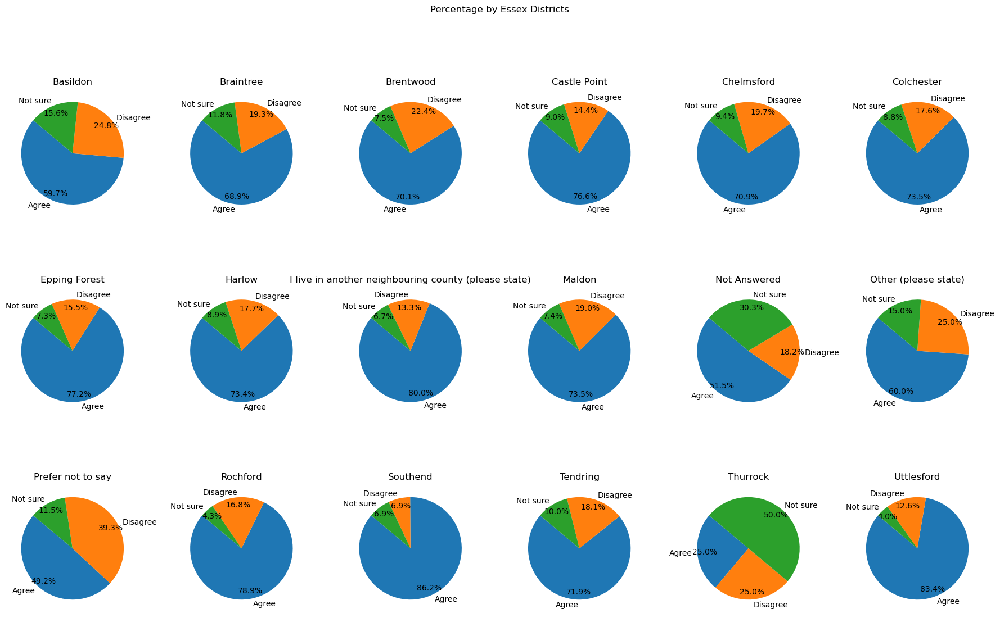


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, 59.7% of people in the Basildon district agree with the statement, few 24.8% disagree and rest were not sure .
* In 'Braintree' district out of 425 people, 68.9% of participants agree, 19.3% disagree and 11.8% are not sure.
* In the 'Chelmsford' district out of total 691 people, 19.7% disagree, however 70.9% agreed and 9.4% are not sure.
* out of 578 people in 'Colchester' district, 73.5% of people in the Colchester district agree with the statement, few 17.6% disagree and rest were not sure .
* In 'Tendring' district out of 530 people, 71.9% of participants agree, 18.1% disagree and 10.0% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with 

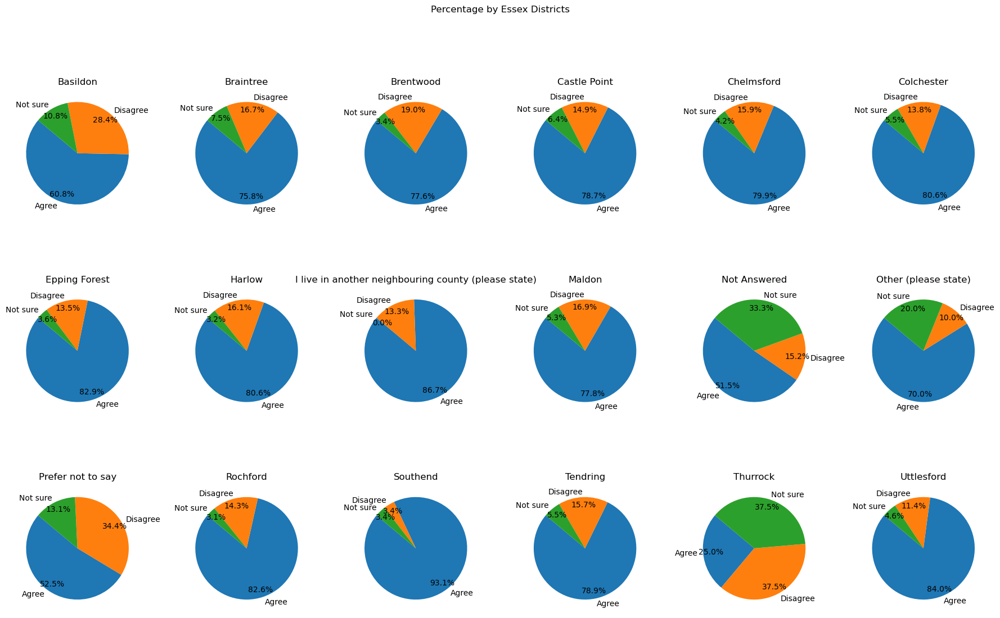


Summary by Essex Districts:
* In 'Basildon' district out of 630 people, 60.8% of participants agree, 28.4% disagree and 10.8% are not sure.
* out of 425 people in 'Braintree' district, the total of 16.7% of Braintree respondents disagree, 75.8% of respondents agree and unsure were 7.5% 
* out of 691 people in 'Chelmsford' district, the total of 15.9% of Chelmsford respondents disagree, 79.9% of respondents agree and unsure were 4.2% 
* In the 'Colchester' district out of total 578 people, 13.8% disagree, however 80.6% agreed and 5.5% are not sure.
* out of 530 people in 'Tendring' district, 78.9% of people in the Tendring district agree with the statement, few 15.7% disagree and rest were not sure .
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do y

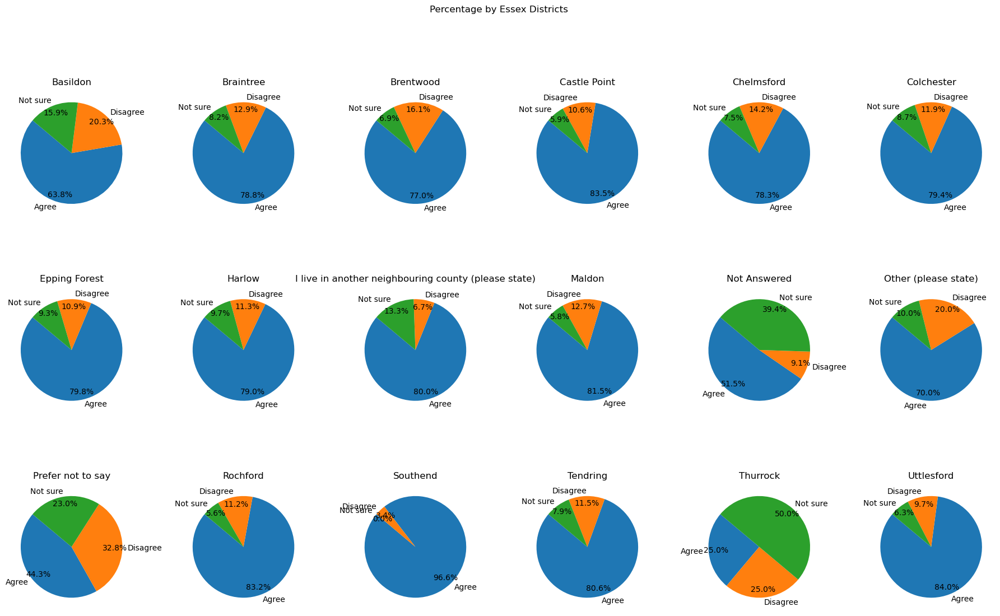


Summary by Essex Districts:
* In the 'Basildon' district out of total 630 people, 20.3% disagree, however 63.8% agreed and 15.9% are not sure.
* In the 'Braintree' district out of total 425 people, 12.9% disagree, however 78.8% agreed and 8.2% are not sure.
* out of 691 people in 'Chelmsford' district, the total of 14.2% of Chelmsford respondents disagree, 78.3% of respondents agree and unsure were 7.5% 
* out of 578 people in 'Colchester' district, the total of 11.9% of Colchester respondents disagree, 79.4% of respondents agree and unsure were 8.7% 
* In the 'Tendring' district out of total 530 people, 11.5% disagree, however 80.6% agreed and 7.9% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that adopting th

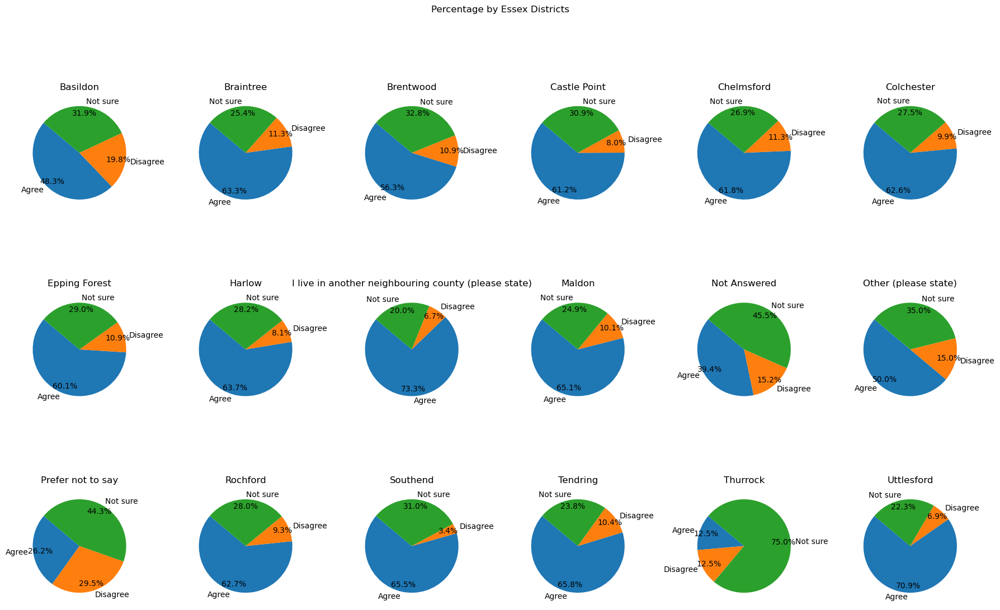


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, the total of 19.8% of Basildon respondents disagree, 48.3% of respondents agree and unsure were 31.9% 
* In 'Braintree' district out of 425 people, 63.3% of participants agree, 11.3% disagree and 25.4% are not sure.
* In 'Chelmsford' district out of 691 people, 61.8% of participants agree, 11.3% disagree and 26.9% are not sure.
* In 'Colchester' district out of 578 people, 62.6% of participants agree, 9.9% disagree and 27.5% are not sure.
* In 'Tendring' district out of 530 people, 65.8% of participants agree, 10.4% disagree and 23.8% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that, after recycling everything we can, adopting Energy from

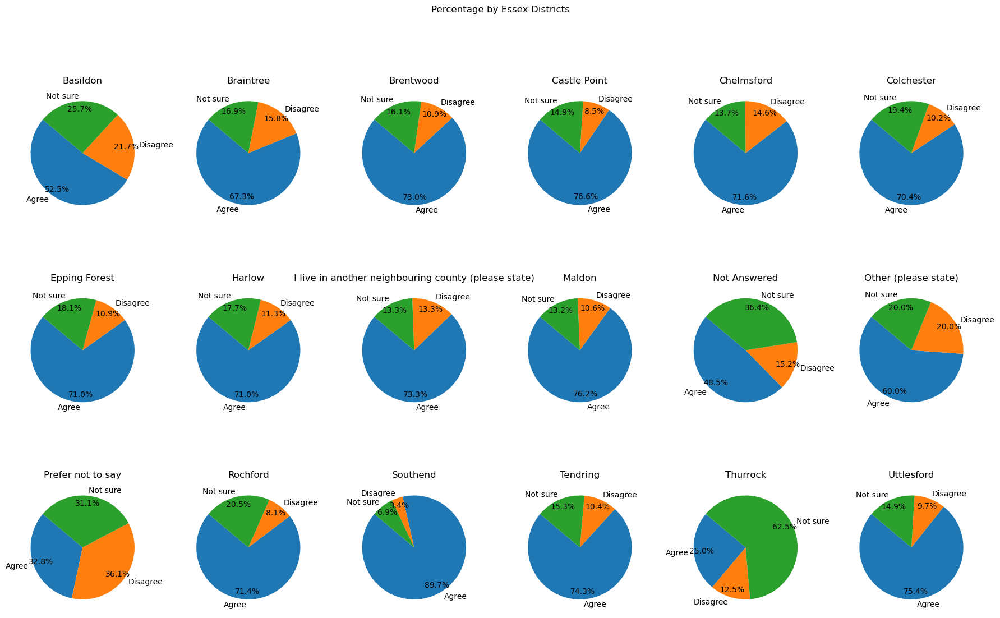


Summary by Essex Districts:
* In 'Basildon' district out of 630 people, 52.5% of participants agree, 21.7% disagree and 25.7% are not sure.
* out of 425 people in 'Braintree' district, 67.3% of people in the Braintree district agree with the statement, few 15.8% disagree and rest were not sure .
* In 'Chelmsford' district out of 691 people, 71.6% of participants agree, 14.6% disagree and 13.7% are not sure.
* In the 'Colchester' district out of total 578 people, 10.2% disagree, however 70.4% agreed and 19.4% are not sure.
* In the 'Tendring' district out of total 530 people, 10.4% disagree, however 74.3% agreed and 15.3% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree.3
Column Response

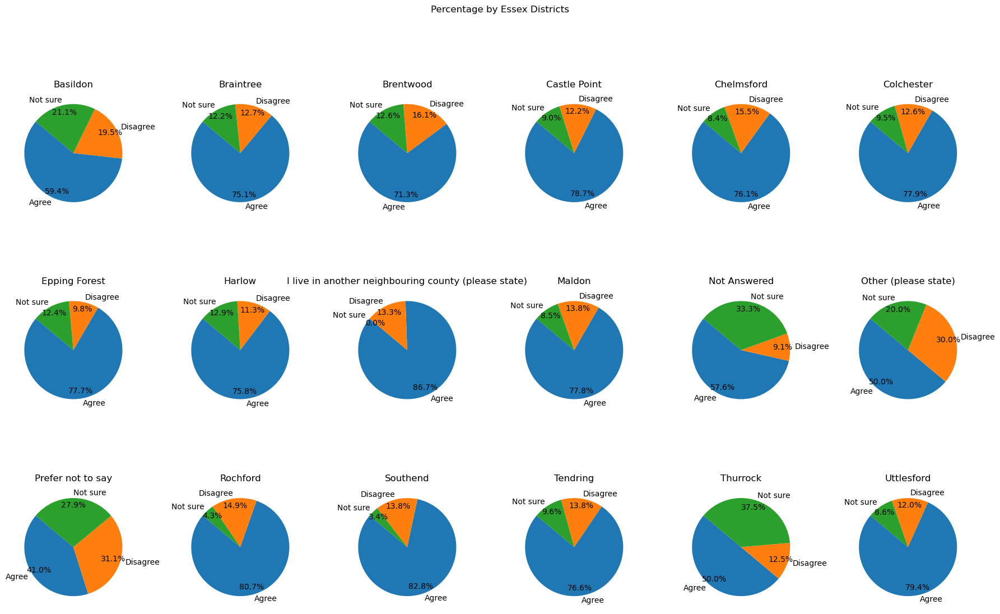


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, 59.4% of people in the Basildon district agree with the statement, few 19.5% disagree and rest were not sure .
* out of 425 people in 'Braintree' district, the total of 12.7% of Braintree respondents disagree, 75.1% of respondents agree and unsure were 12.2% 
* In 'Chelmsford' district out of 691 people, 76.1% of participants agree, 15.5% disagree and 8.4% are not sure.
* In 'Colchester' district out of 578 people, 77.9% of participants agree, 12.6% disagree and 9.5% are not sure.
* out of 530 people in 'Tendring' district, the total of 13.8% of Tendring respondents disagree, 76.6% of respondents agree and unsure were 9.6% 
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you ag

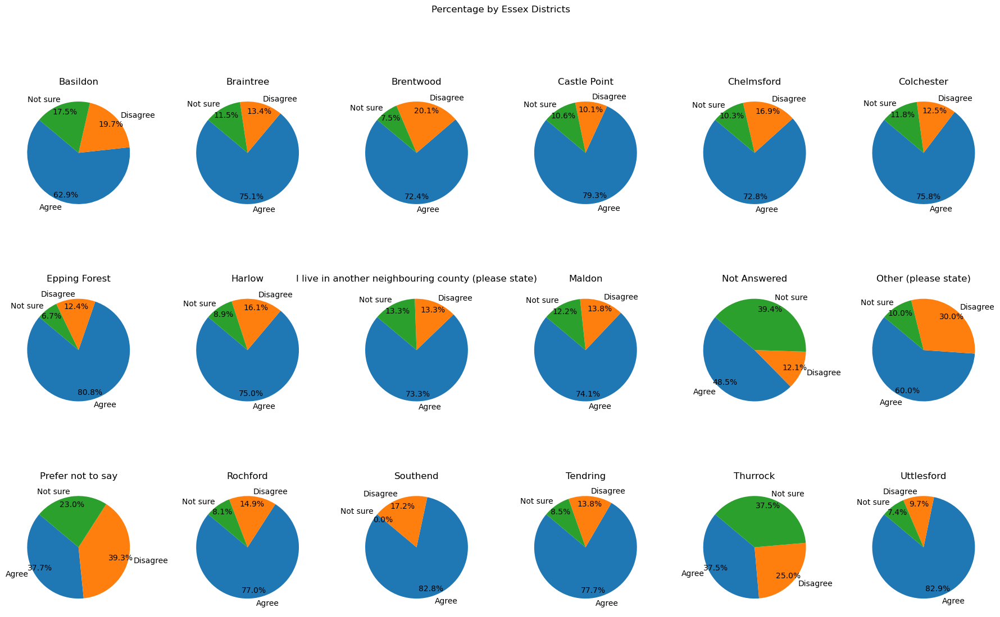


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, 62.9% of people in the Basildon district agree with the statement, few 19.7% disagree and rest were not sure .
* out of 425 people in 'Braintree' district, 75.1% of people in the Braintree district agree with the statement, few 13.4% disagree and rest were not sure .
* out of 691 people in 'Chelmsford' district, the total of 16.9% of Chelmsford respondents disagree, 72.8% of respondents agree and unsure were 10.3% 
* out of 578 people in 'Colchester' district, the total of 12.5% of Colchester respondents disagree, 75.8% of respondents agree and unsure were 11.8% 
* In 'Tendring' district out of 530 people, 77.7% of participants agree, 13.8% disagree and 8.5% are not sure.
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

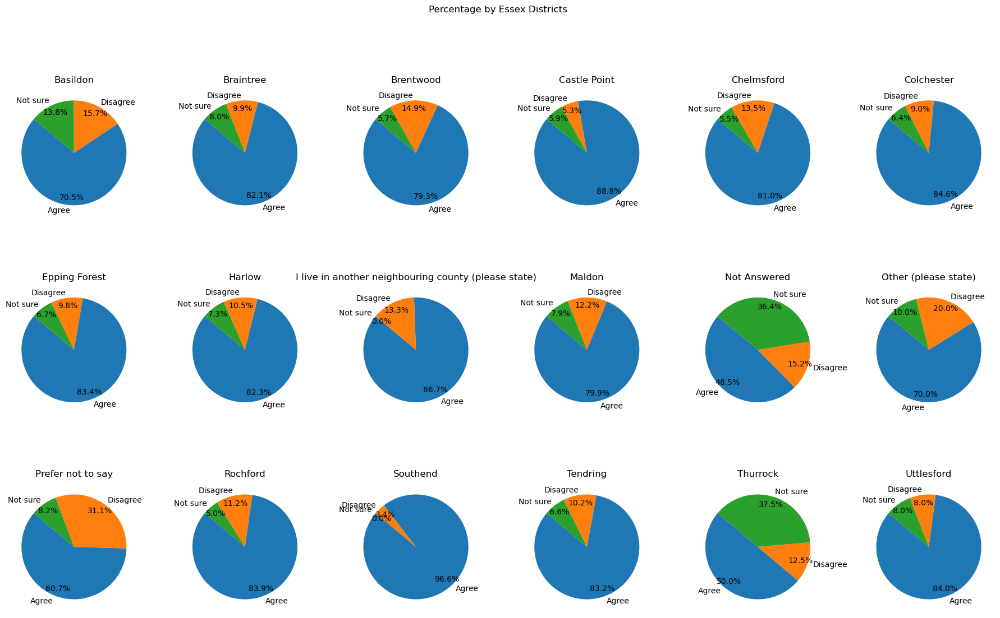


Summary by Essex Districts:
* In 'Basildon' district out of 630 people, 70.5% of participants agree, 15.7% disagree and 13.8% are not sure.
* In the 'Braintree' district out of total 425 people, 9.9% disagree, however 82.1% agreed and 8.0% are not sure.
* out of 691 people in 'Chelmsford' district, the total of 13.5% of Chelmsford respondents disagree, 81.0% of respondents agree and unsure were 5.5% 
* In 'Colchester' district out of 578 people, 84.6% of participants agree, 9.0% disagree and 6.4% are not sure.
* out of 530 people in 'Tendring' district, the total of 10.2% of Tendring respondents disagree, 83.2% of respondents agree and unsure were 6.6% 
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Inn

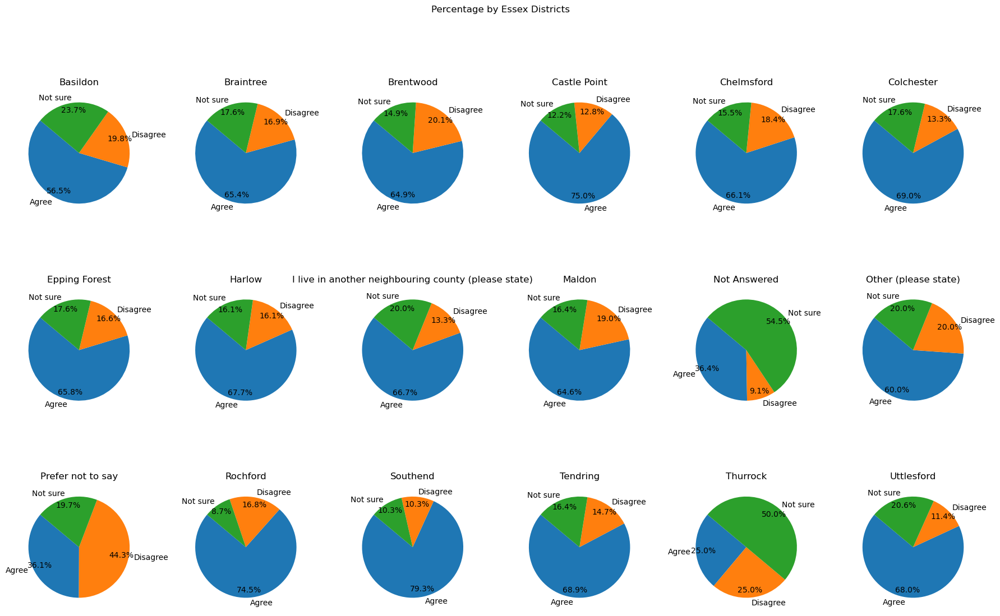


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, 56.5% of people in the Basildon district agree with the statement, few 19.8% disagree and rest were not sure .
* out of 425 people in 'Braintree' district, the total of 16.9% of Braintree respondents disagree, 65.4% of respondents agree and unsure were 17.6% 
* out of 691 people in 'Chelmsford' district, 66.1% of people in the Chelmsford district agree with the statement, few 18.4% disagree and rest were not sure .
* In 'Colchester' district out of 578 people, 69.0% of participants agree, 13.3% disagree and 17.6% are not sure.
* In the 'Tendring' district out of total 530 people, 14.7% disagree, however 68.9% agreed and 16.4% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what 

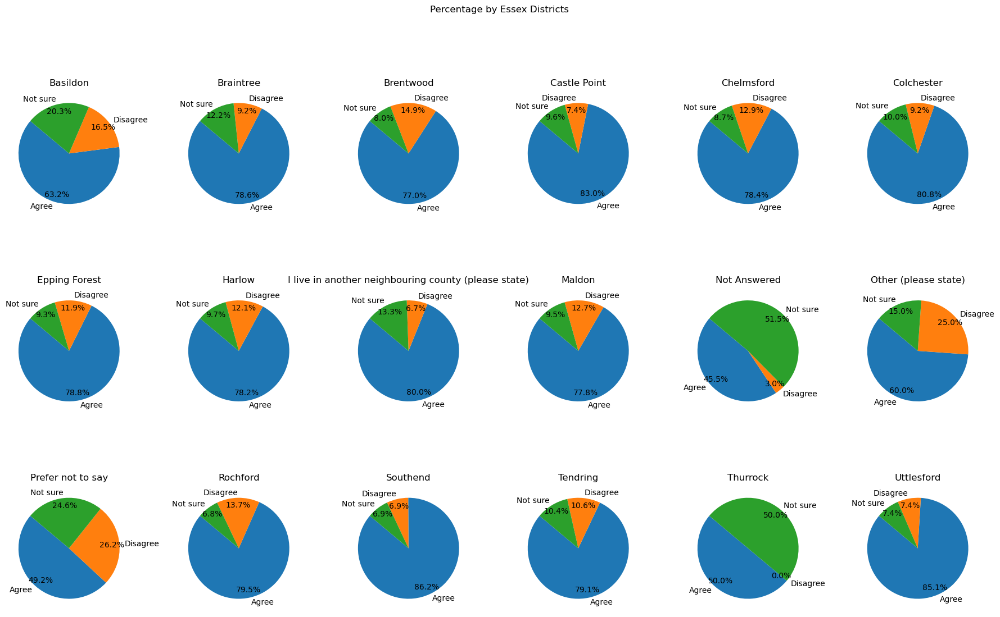


Summary by Essex Districts:
* In the 'Basildon' district out of total 630 people, 16.5% disagree, however 63.2% agreed and 20.3% are not sure.
* In 'Braintree' district out of 425 people, 78.6% of participants agree, 9.2% disagree and 12.2% are not sure.
* In the 'Chelmsford' district out of total 691 people, 12.9% disagree, however 78.4% agreed and 8.7% are not sure.
* In the 'Colchester' district out of total 578 people, 9.2% disagree, however 80.8% agreed and 10.0% are not sure.
* In 'Tendring' district out of 530 people, 79.1% of participants agree, 10.6% disagree and 10.4% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Colla

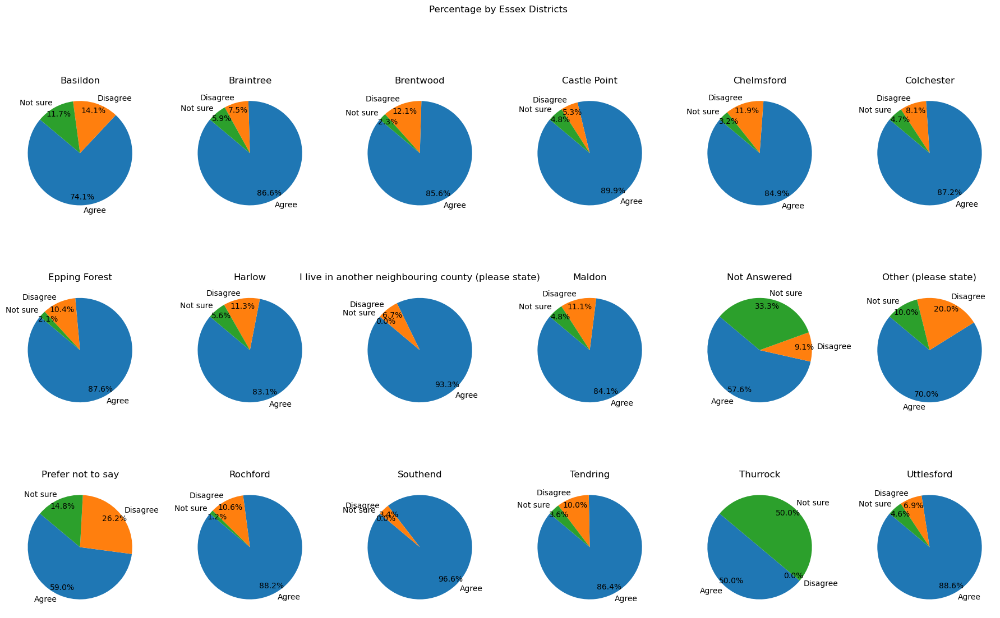


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, the total of 14.1% of Basildon respondents disagree, 74.1% of respondents agree and unsure were 11.7% 
* In 'Braintree' district out of 425 people, 86.6% of participants agree, 7.5% disagree and 5.9% are not sure.
* out of 691 people in 'Chelmsford' district, the total of 11.9% of Chelmsford respondents disagree, 84.9% of respondents agree and unsure were 3.2% 
* In the 'Colchester' district out of total 578 people, 8.1% disagree, however 87.2% agreed and 4.7% are not sure.
* out of 530 people in 'Tendring' district, the total of 10.0% of Tendring respondents disagree, 86.4% of respondents agree and unsure were 3.6% 
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or 

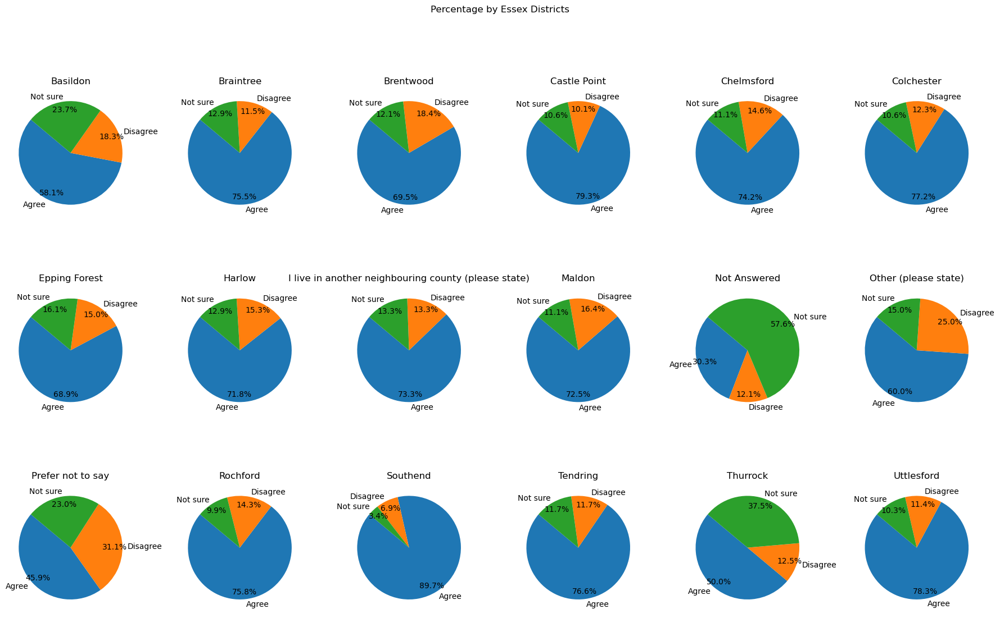


Summary by Essex Districts:
* In 'Basildon' district out of 630 people, 58.1% of participants agree, 18.3% disagree and 23.7% are not sure.
* In the 'Braintree' district out of total 425 people, 11.5% disagree, however 75.5% agreed and 12.9% are not sure.
* In the 'Chelmsford' district out of total 691 people, 14.6% disagree, however 74.2% agreed and 11.1% are not sure.
* out of 578 people in 'Colchester' district, 77.2% of people in the Colchester district agree with the statement, few 12.3% disagree and rest were not sure .
* In 'Tendring' district out of 530 people, 76.6% of participants agree, 11.7% disagree and 11.7% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree that Collaboration and Innovation should be 

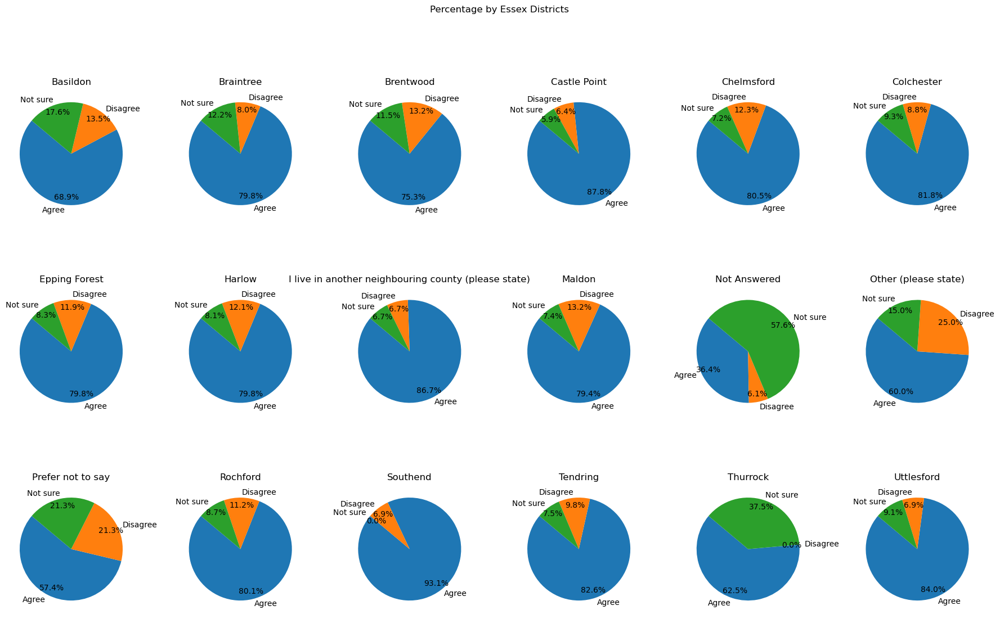


Summary by Essex Districts:
* In the 'Basildon' district out of total 630 people, 13.5% disagree, however 68.9% agreed and 17.6% are not sure.
* In 'Braintree' district out of 425 people, 79.8% of participants agree, 8.0% disagree and 12.2% are not sure.
* In the 'Chelmsford' district out of total 691 people, 12.3% disagree, however 80.5% agreed and 7.2% are not sure.
* In 'Colchester' district out of 578 people, 81.8% of participants agree, 8.8% disagree and 9.3% are not sure.
* out of 530 people in 'Tendring' district, 82.6% of people in the Tendring district agree with the statement, few 9.8% disagree and rest were not sure .
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with this priority? - agree.4
Column Responses :  [

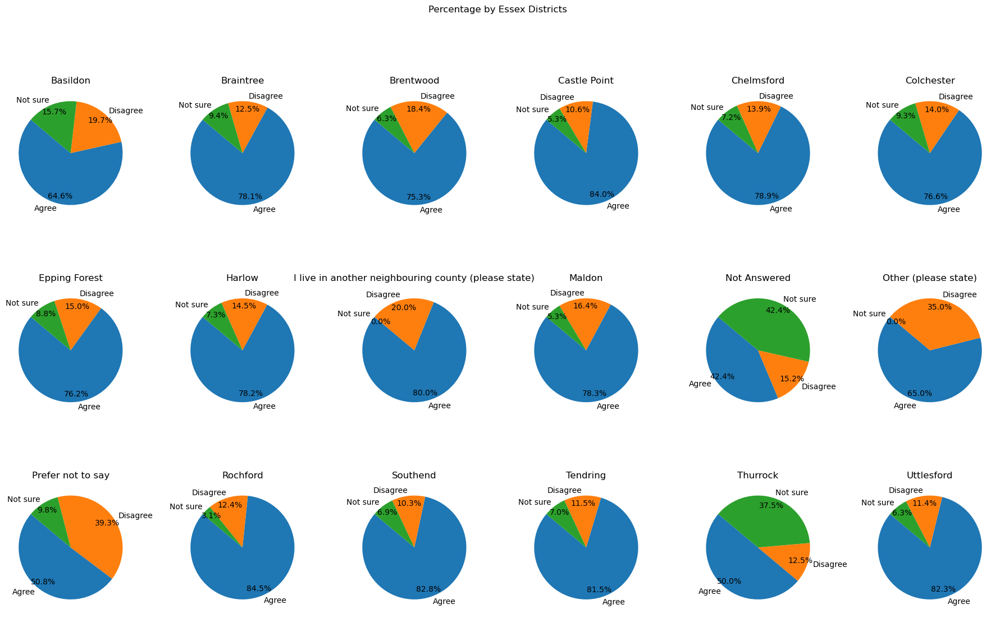


Summary by Essex Districts:
* In 'Basildon' district out of 630 people, 64.6% of participants agree, 19.7% disagree and 15.7% are not sure.
* out of 425 people in 'Braintree' district, 78.1% of people in the Braintree district agree with the statement, few 12.5% disagree and rest were not sure .
* out of 691 people in 'Chelmsford' district, 78.9% of people in the Chelmsford district agree with the statement, few 13.9% disagree and rest were not sure .
* In 'Colchester' district out of 578 people, 76.6% of participants agree, 14.0% disagree and 9.3% are not sure.
* In the 'Tendring' district out of total 530 people, 11.5% disagree, however 81.5% agreed and 7.0% are not sure.
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Column Question :  To what extent do you agree or disagree with 

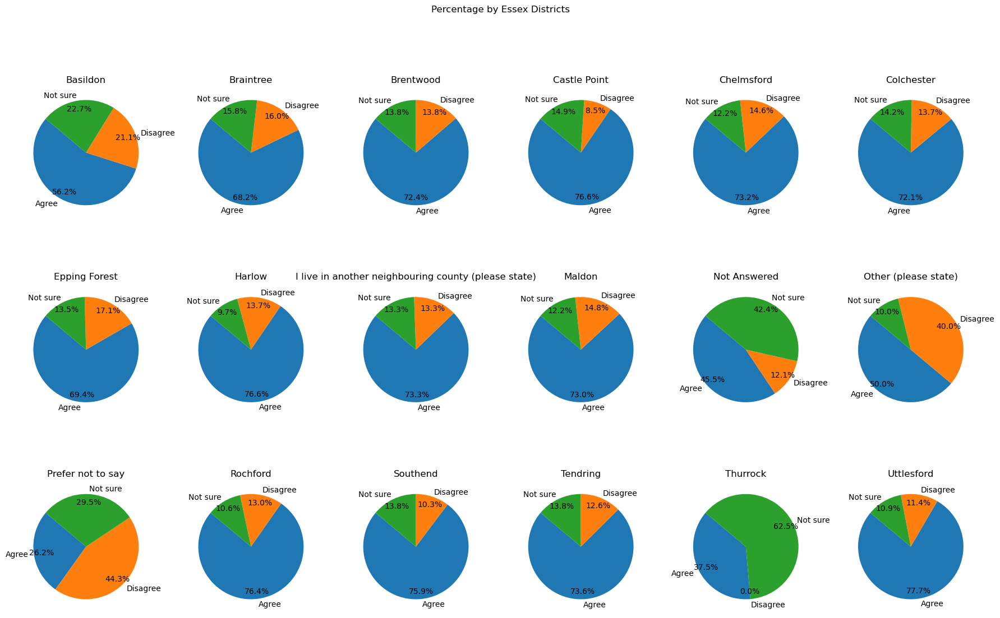


Summary by Essex Districts:
* out of 630 people in 'Basildon' district, 56.2% of people in the Basildon district agree with the statement, few 21.1% disagree and rest were not sure .
* In the 'Braintree' district out of total 425 people, 16.0% disagree, however 68.2% agreed and 15.8% are not sure.
* out of 691 people in 'Chelmsford' district, 73.2% of people in the Chelmsford district agree with the statement, few 14.6% disagree and rest were not sure .
* In the 'Colchester' district out of total 578 people, 13.7% disagree, however 72.1% agreed and 14.2% are not sure.
* out of 530 people in 'Tendring' district, 73.6% of people in the Tendring district agree with the statement, few 12.6% disagree and rest were not sure .
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [369]:
# Define new categories
def categorize_response(response):
    if response in ["Strongly agree", "Mostly agree"]:
        return "Agree"
    elif response in ["Strongly disagree", "Mostly disagree"]:
        return "Disagree"
    else:
        return "Not sure"

# Apply the categorization
#Col_A = df['To what extent do you agree or disagree that Collaboration and Innovation should be achieved through the following means: - Collaboration - Work to reduce the carbon impact of waste operations by increasing use of alternative fuels for our vehicles and equipment, and making waste transport routes as efficient as possible.'].apply(categorize_response)
for column in df:
    
    if all(value in df[column].values for value in ["Agree", "Disagree", "Not sure"]):
        
        columnSeriesObj = df[column]
        print('\nColumn Question : ', column)
        print('Column Responses : ', columnSeriesObj.values)
        # Calculate percentages for Essex districts
        city_counts = df.groupby([city, df[column]]).size().unstack(fill_value=0)
        city_totals = city_counts.sum(axis=1)
        city_percentages = (city_counts.T / city_totals).T * 100
        print(city_totals)

        import random

        # Initialize spaCy
        nlp = spacy.load("en_core_web_sm")

        # Function to create summary
        def create_summary(data, category, threshold=100):
            summaries = []
            for index, row in data.iterrows():
                if category[index] > threshold:
                    agree_percentage = row.get('Agree', 0)
                    disagree_percentage = row.get('Disagree', 0)
                    not_sure_percentage = row.get('Not sure', 0)

                    sentences = [
                        f"In '{index}' district out of {category[index]} people, {agree_percentage:.1f}% of participants agree, {disagree_percentage:.1f}% disagree and {not_sure_percentage:.1f}% are not sure.",
                        f"out of {category[index]} people in '{index}' district, the total of {disagree_percentage:.1f}% of {index} respondents disagree, {agree_percentage:.1f}% of respondents agree and unsure were {not_sure_percentage:.1f}% ",
                        #f"Not sure responses are at {not_sure_percentage:.1f}% for the {index} group.",
                        f"out of {category[index]} people in '{index}' district, {agree_percentage:.1f}% of people in the {index} district agree with the statement, few {disagree_percentage:.1f}% disagree and rest were not sure .",
                        f"In the '{index}' district out of total {category[index]} people, {disagree_percentage:.1f}% disagree, however {agree_percentage:.1f}% agreed and {not_sure_percentage:.1f}% are not sure."
                    ]

                    # Randomly select one sentence for the summary
                    summary_sentence = random.choice(sentences)
                    summaries.append(summary_sentence)
                else:
                    summaries.append(f"In the {index} category, less effective data due to low response count.")
            return summaries


        # Filter age categories with a count greater than 100
        filtered_city_percentages = city_percentages[city_totals > 400]
        # Generate summaries for age group
        city_summaries = create_summary(filtered_city_percentages, city_totals)


        # Function to plot pie charts
        def plot_pie_chart(df, title):
            plt.figure(figsize=(18, 12))  # Adjust the figure size as necessary
            num_plots = len(df)
            num_cols = 6  # 6 columns
            num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)  # Calculate the required number of rows

            for i, (index, row) in enumerate(df.iterrows()):
                plt.subplot(num_rows, num_cols, i + 1)
                plt.pie(
                    row,
                    labels=row.index,
                    autopct='%1.1f%%',
                    startangle=140,
                    pctdistance=0.85,
                    labeldistance=1.1
                )
                plt.title(index)

            plt.suptitle(title)
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            plt.show()


        # Plot pie charts for Essex Districts
        plot_pie_chart(city_percentages, 'Percentage by Essex Districts')

        print("\nSummary by Essex Districts:")
        for summary in city_summaries:
            print(f"* {summary}")
        print("-"*250)